In [1]:
import sys
import os
import uproot
import numpy as np
import matplotlib.pyplot as plt

from scipy import stats as st
import scipy

import peakutils

from datetime import datetime

import math
from scipy          import stats
from scipy.optimize import curve_fit

In [2]:
### Import functions from peak_functions

repository_path = os.path.abspath('../..')
sys.path.append(repository_path)

import blr_functions  as blr
import peak_functions as pf
import fit_functions  as fitf

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
plt.rcParams["figure.figsize"] = 9, 6
plt.rcParams["font.size"]      = 14

### Get npz files

In [5]:
evts_path = '/Users/romoluque_c/LEGEND/BACON/data_npz/'

all_channels = 9

peak_heights = {}

pos_date1 = 42
pos_date2 = 52

def get_date(filename):
    date_str = filename[pos_date1:pos_date2]
    date = datetime.strptime(date_str, '%m_%d_%Y')
    return date

files        = os.listdir(evts_path)
filt_files   = [file for file in files if file.startswith("BACoN_sig_processing_cal_using_height_run")]
sorted_files = sorted(filt_files, key=get_date)

for filename in sorted_files:
    my_file = evts_path+filename
    d = np.load(my_file, allow_pickle=True)
    
    date = filename[pos_date1:pos_date2]
    
    try:
        if date not in peak_heights:
            peak_heights_ch = [np.array([]) for _ in range(all_channels)]
    
        for channel in range(all_channels):
            peak_heights_ch[channel] = np.concatenate((peak_heights_ch[channel], d['peak_height_all_channels'][channel][0]))
            
        peak_heights[date] = np.array(peak_heights_ch, dtype=object)
    except IndexError:
        print(date, len(d['peak_height_all_channels'][channel]))
        continue

11_21_2023 0


In [6]:
peak_heights.keys()

dict_keys(['11_20_2023', '11_21_2023', '11_23_2023', '11_24_2023', '11_25_2023', '11_26_2023', '11_28_2023', '11_29_2023', '11_30_2023'])

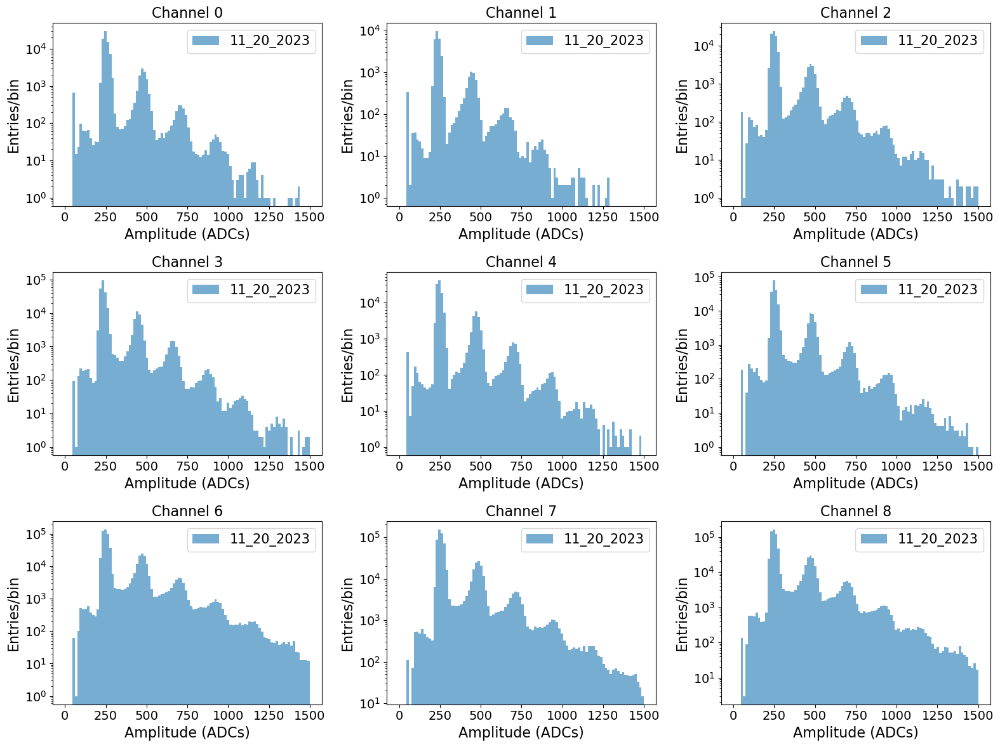

In [7]:
select_date = '11_20_2023'

fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for k in range(9):
    i = int(k/3)
    j = k%3
    axs[i][j].hist(peak_heights[select_date][k], bins=100, range=(0,1500), log=True, label=f'{select_date}', alpha=0.6)
    axs[i][j].set_xlabel('Amplitude (ADCs)', fontsize=16)
    axs[i][j].set_ylabel('Entries/bin',      fontsize=16)
    axs[i][j].set_title(f"Channel {k}",      fontsize=16)
    axs[i][j].legend(fontsize=15)
plt.tight_layout()
plt.show()

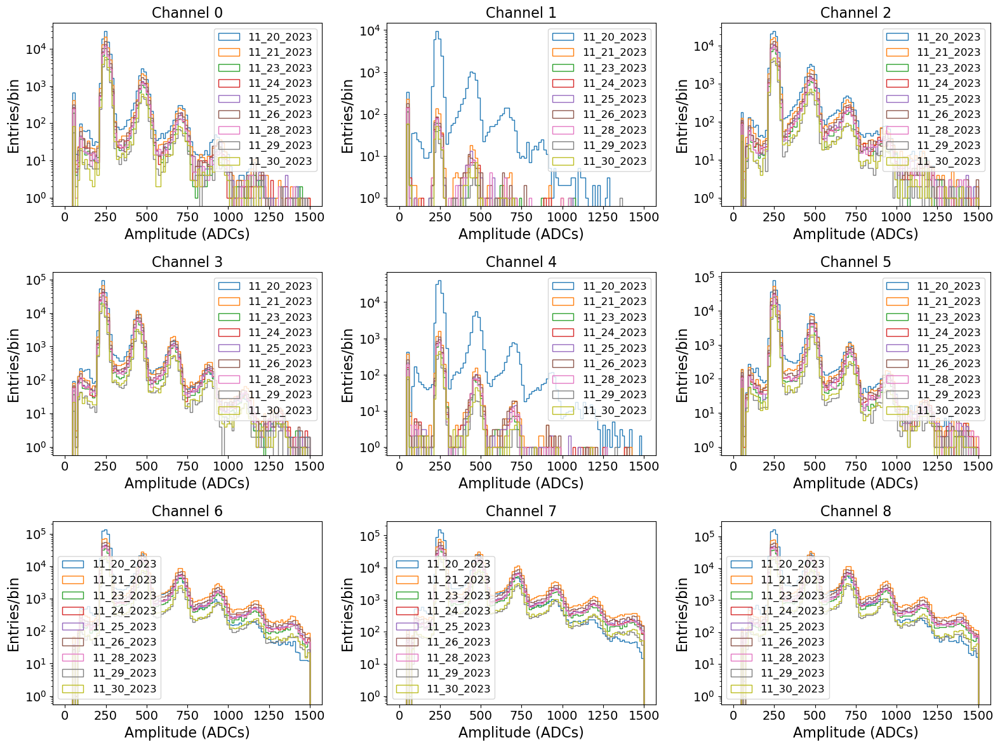

In [8]:
fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for date in peak_heights.keys():
    for k in range(9):
        i = int(k/3)
        j = k%3
        axs[i][j].hist(peak_heights[date][k], bins=100, range=(0,1500), log=True, label=f'{date}', histtype='step')
        axs[i][j].set_xlabel('Amplitude (ADCs)', fontsize=16)
        axs[i][j].set_ylabel('Entries/bin',      fontsize=16)
        axs[i][j].set_title(f"Channel {k}",      fontsize=16)
        axs[i][j].legend(fontsize=12)
plt.tight_layout()
plt.show()

### Join all runs since the Vbias has not changed

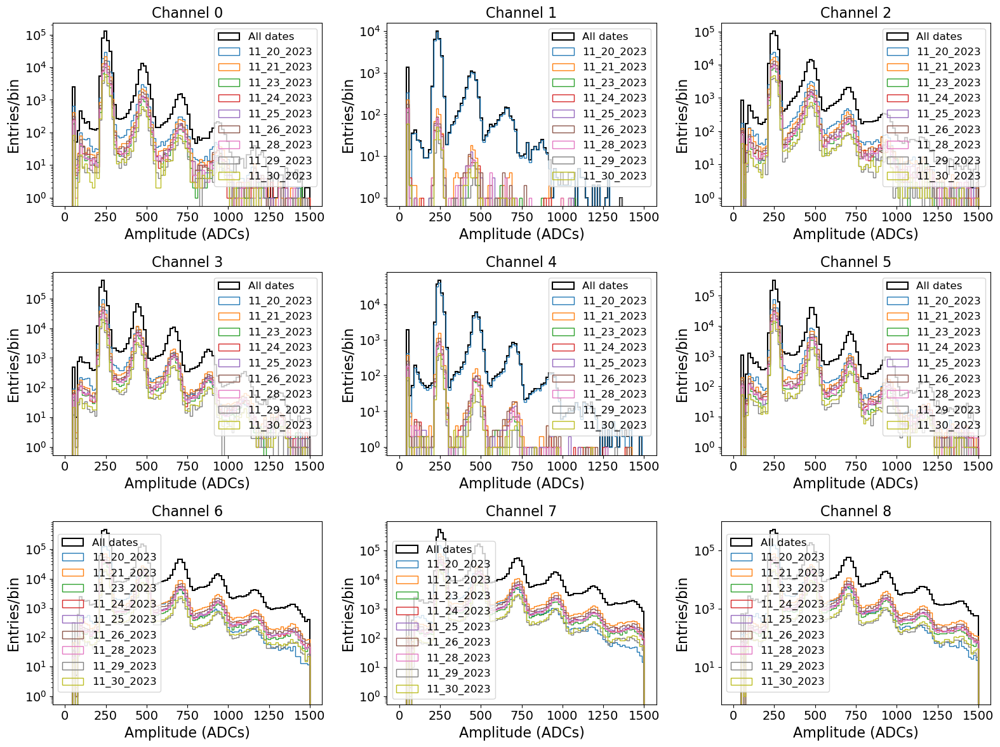

In [9]:
fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for k in range(9):
    join_all_dates = np.concatenate(np.array([peak_heights[date][k] for date in peak_heights.keys()]))
    i = int(k/3)
    j = k%3
    axs[i][j].hist(join_all_dates, bins=100, range=(0,1500), log=True, label=f'All dates', histtype='step', color='k', linewidth=1.5)
    for date in peak_heights.keys():
        axs[i][j].hist(peak_heights[date][k], bins=100, range=(0,1500), log=True, label=f'{date}', histtype='step')
        axs[i][j].set_xlabel('Amplitude (ADCs)', fontsize=16)
        axs[i][j].set_ylabel('Entries/bin',      fontsize=16)
        axs[i][j].set_title(f"Channel {k}",      fontsize=16)
        axs[i][j].legend(fontsize=12)
plt.tight_layout()
plt.show()

## Fit

In [10]:
# Define the function for a single Gaussian peak
def gaussian(x, amplitude, mean, stddev):
    return amplitude * np.exp(-(x - mean)**2 / (2 * stddev**2))

# Define the function for multiple Gaussian peaks
def multi_gaussian(x, *params):
    n_peaks = len(params) // 3
    y = np.zeros_like(x)
    for i in range(n_peaks):
        amplitude = params[i * 3]
        mean = params[i * 3 + 1]
        stddev = params[i * 3 + 2]
        y += gaussian(x, amplitude, mean, stddev)
    return y

def shift_to_bin_centers(x):
    """
    Return bin centers, given bin lower edges.
    """
    return x[:-1] + np.diff(x) * 0.5

def truncate(number, decimals=0):
    """
    Returns a value truncated to a specific number of decimal places.
    """
    if not isinstance(decimals, int):
        raise TypeError("decimal places must be an integer.")
    elif decimals < 0:
        raise ValueError("decimal places has to be 0 or more.")
    elif decimals == 0:
        return math.trunc(number)

    factor = 10.0 ** decimals
    return math.trunc(number * factor) / factor

def plot_linear_fit(y, yerr):
    x    = np.arange(len(y))+1
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    line = slope*x + intercept
    
    fig = plt.figure(figsize=(8,5))
    plt.errorbar(x, y, yerr=yerr, marker='_', markersize=5, linestyle='', c='k', label=f'Measured gain values')
    plt.plot(x, line, color='r', alpha=0.7, label=f'Fit: y = x*{round(slope, 2)} - {round(np.abs(intercept), 2)}, \n     R$^2$ = {truncate(r_value, 2)}')
    
    plt.xlabel('Peak number')
    plt.ylabel('Mu from fit (ADCs)')
    plt.legend(fontsize=14, loc='upper left')
    plt.show()
    return slope

In [11]:
initial_guess_ch = {0: [ 15000, 245, 20,  2000, 475, 25,  200, 710, 30,  20, 925, 40],
                    1: [  6000, 235, 20,   600, 445, 25,  100, 650, 30,  20, 870, 40],
                    2: [ 16000, 250, 20,  2000, 475, 25,  400, 700, 30,  50, 925, 40],
                    3: [ 60000, 230, 20,  8000, 445, 25, 1000, 660, 30, 100, 875, 40],
                    4: [ 30000, 245, 20,  4000, 475, 25,  500, 700, 30,  70, 935, 40],
                    5: [ 50000, 250, 20,  5000, 480, 25,  700, 710, 30, 100, 945, 40],
                    6: [ 90000, 245, 20, 18000, 470, 25, 3000, 700, 30, 500, 920, 40],
                    7: [100000, 250, 20, 16000, 485, 25,  500, 710, 30, 500, 950, 40],
                    8: [110000, 245, 20, 20000, 475, 25, 4000, 700, 30, 600, 920, 40]}

In [12]:
def fit_spectrum_and_plot(data, channel=7, initial_guess=[1000, 100, 20], bins=150, rng=(100,1500), num_peaks_fit=4):
    
    plt.figure(figsize=(7, 5))
    y, x, _ = plt.hist(data, bins=bins, range=rng, log=False, alpha=0.6)

    popt, pcov = curve_fit(multi_gaussian, shift_to_bin_centers(x), y, p0=initial_guess)
    
    plt.plot(x, multi_gaussian(x, *popt), 'r--', label='Fit')
    plt.xlabel('Amplitude (ADCs)',      fontsize=15)
    plt.ylabel('Entries/bin',           fontsize=15)
    plt.title(f"Spectrum for channel {channel} (height of the peaks)", fontsize=15)
    plt.tight_layout()
    plt.show()
    
    perr = np.sqrt(np.diag(pcov))
    
    all_means     = np.array([popt[i*3+1] for i in range(len(popt)//3)])
    all_means_err = np.array([perr[i*3+1] for i in range(len(perr)//3)])
    
    return plot_linear_fit(all_means[:num_peaks_fit], all_means_err[:num_peaks_fit])

In [13]:
initial_guess_all_dates_ch = {0: [ 90000, 245, 20,  8000, 480, 25,  1000, 710, 30,  110, 935, 40],
                              1: [  6000, 235, 20,   700, 445, 25,  100, 650, 30],
                              2: [ 70000, 250, 20,  9000, 475, 25,  1300, 700, 30,  200, 925, 40],
                              3: [260000, 230, 20, 43000, 445, 25,  7000, 665, 30, 1200, 875, 40],
                              4: [ 30000, 245, 20,  4000, 475, 25,  500, 700, 30,  70, 935, 40],
                              5: [220000, 250, 20,  25000, 480, 25,  4000, 710, 30, 600, 945, 40],
                              6: [300000, 245, 20, 100000, 480, 25, 30000, 710, 30, 10000, 940, 40],
                              7: [300000, 250, 20, 100000, 485, 25, 30000, 720, 30, 10000, 955, 40],
                              8: [350000, 245, 20, 120000, 475, 25, 35000, 705, 30, 10000, 930, 40]}

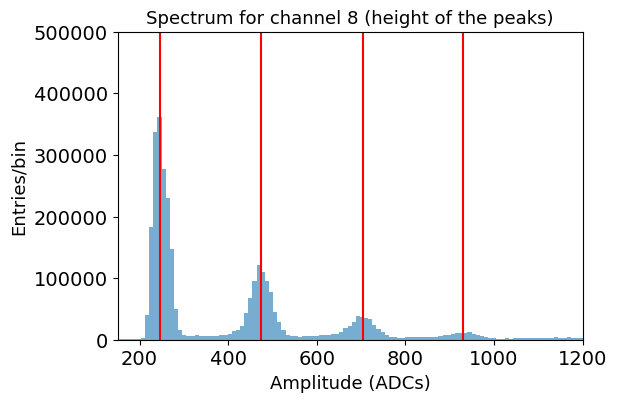

In [14]:
sel_channel    = 8
join_all_dates = np.concatenate(np.array([peak_heights[date][sel_channel] for date in peak_heights.keys()]))

plt.figure(figsize=(6, 4))
y, x, _ = plt.hist(join_all_dates, bins=150, range=(100,1500), log=False, alpha=0.6)
plt.axvline(x=245, color='r')
plt.axvline(x=475, color='r')
plt.axvline(x=705, color='r')
plt.axvline(x=930, color='r')
plt.xlabel('Amplitude (ADCs)',      fontsize=13)
plt.ylabel('Entries/bin',           fontsize=13)
plt.title(f"Spectrum for channel {sel_channel} (height of the peaks)", fontsize=13)
plt.xlim(150, 1200)
plt.ylim(0, 500000)
plt.show()

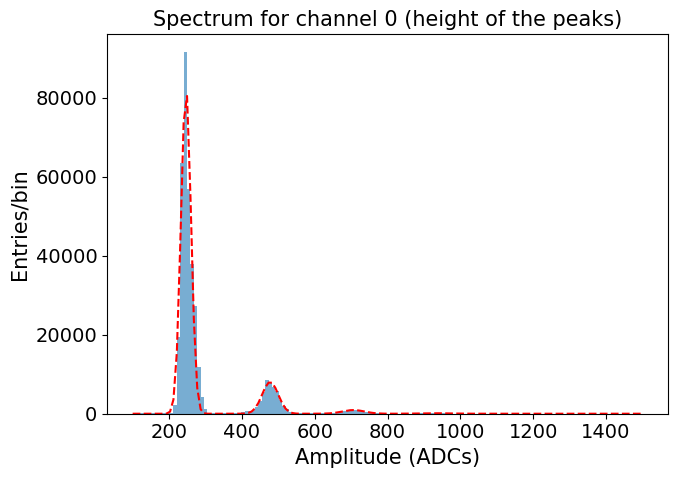

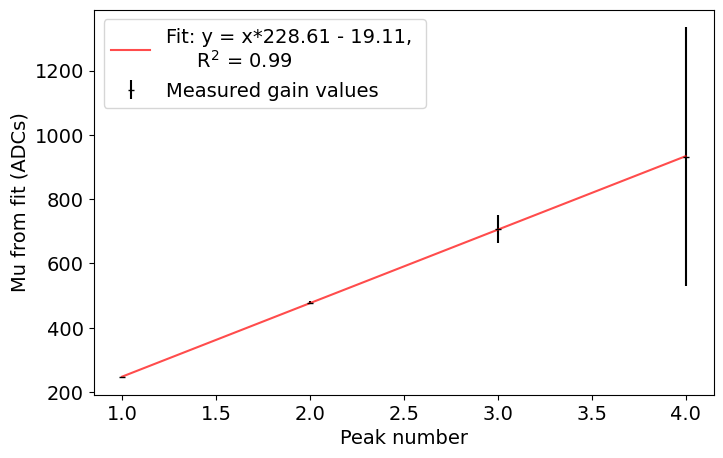

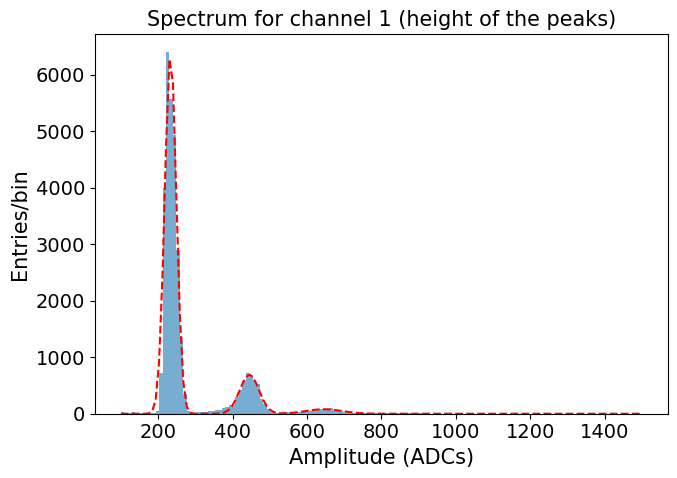

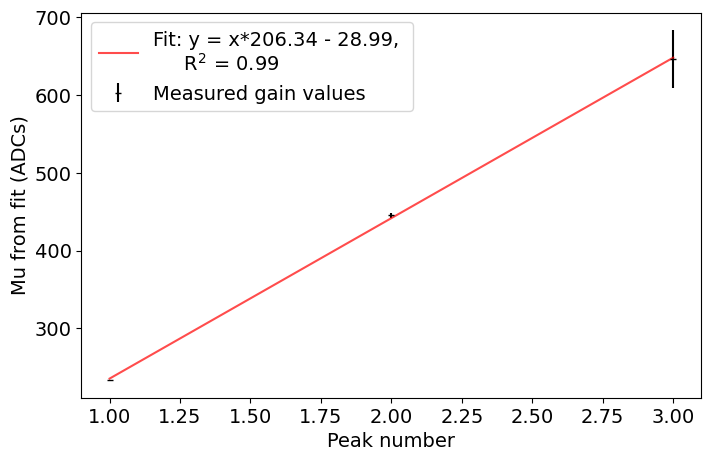

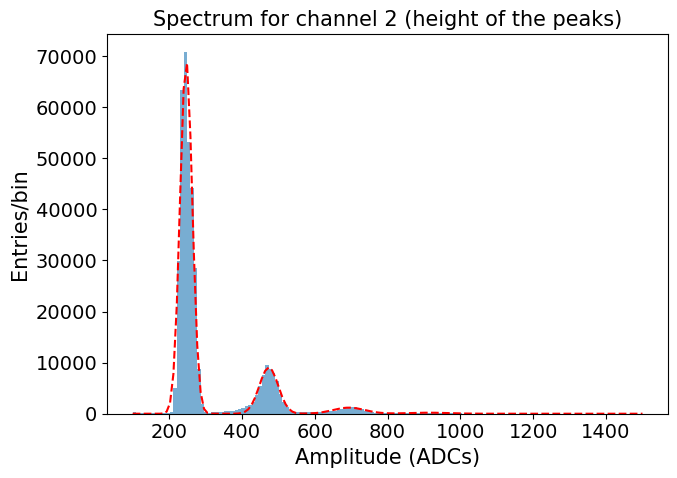

...

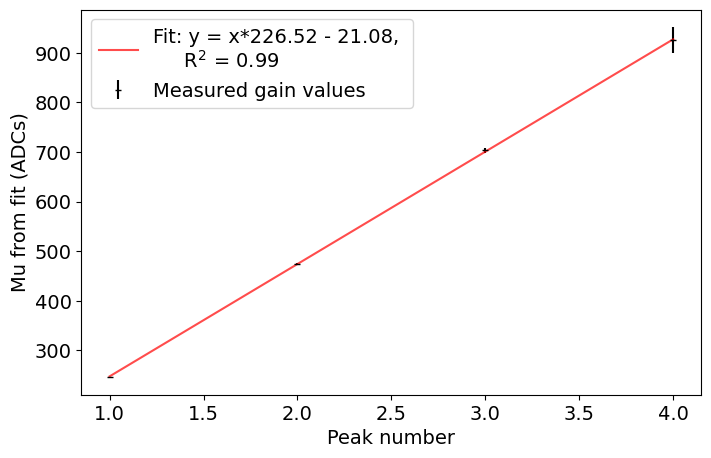

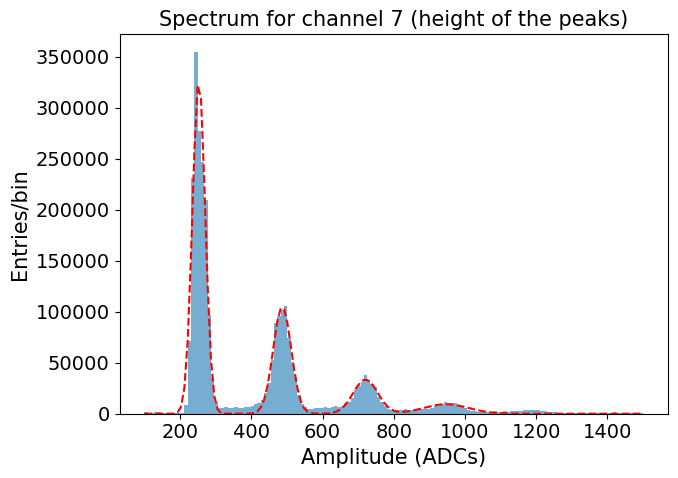

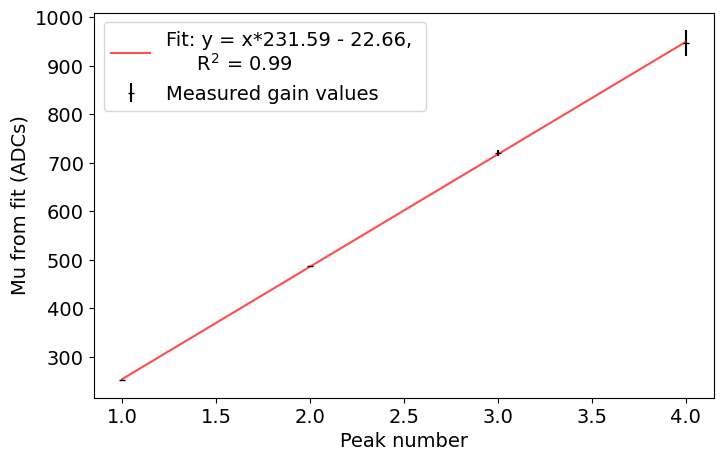

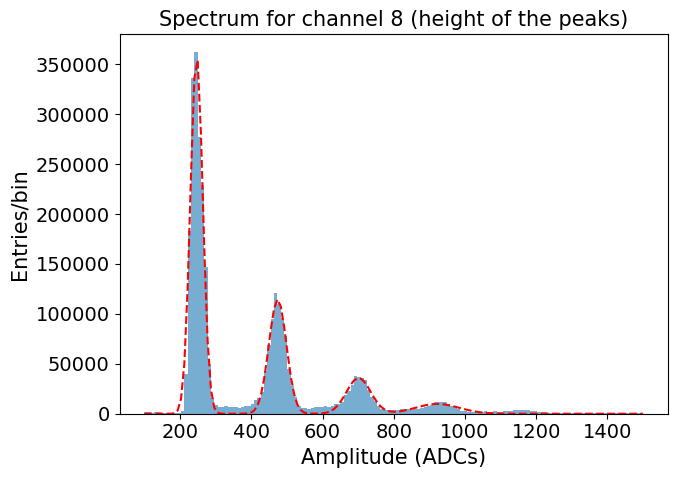

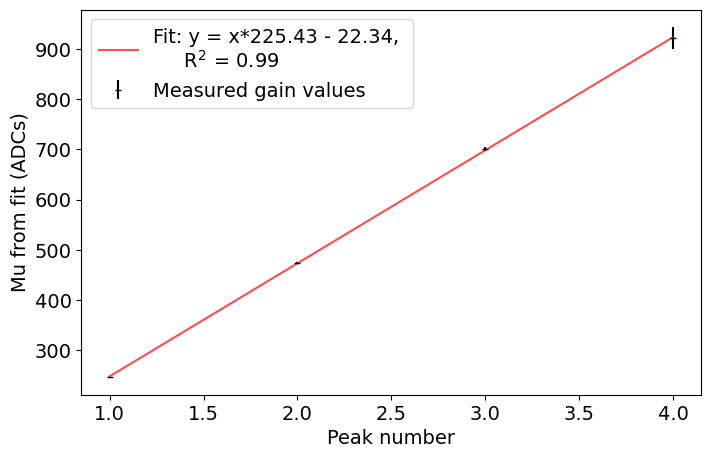

In [15]:
slopes_all_dates = []
for k in range(9):
    #if k!=6:
    #    continue
    join_all_dates = np.concatenate(np.array([peak_heights[date][k] for date in peak_heights.keys()]))
    try:
        slope = fit_spectrum_and_plot(join_all_dates, channel=k, initial_guess=initial_guess_all_dates_ch[k])
        slopes_all_dates.append(slope)
    except RuntimeError:
        slopes_all_dates.append(0)
        continue

-------------------------------
Channel 0, date = 11_20_2023
-------------------------------


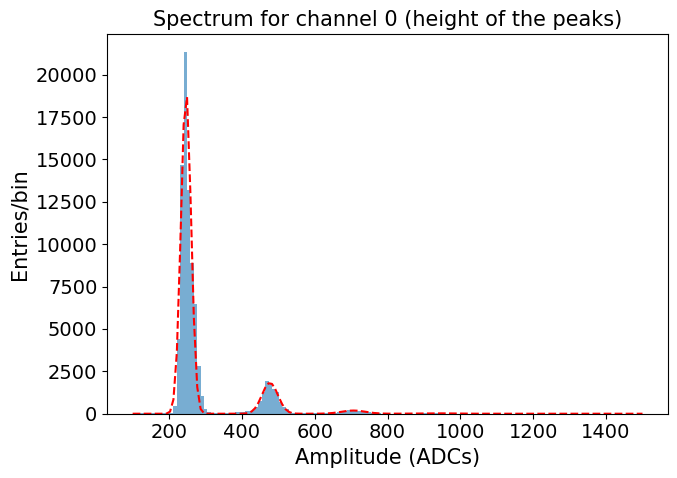

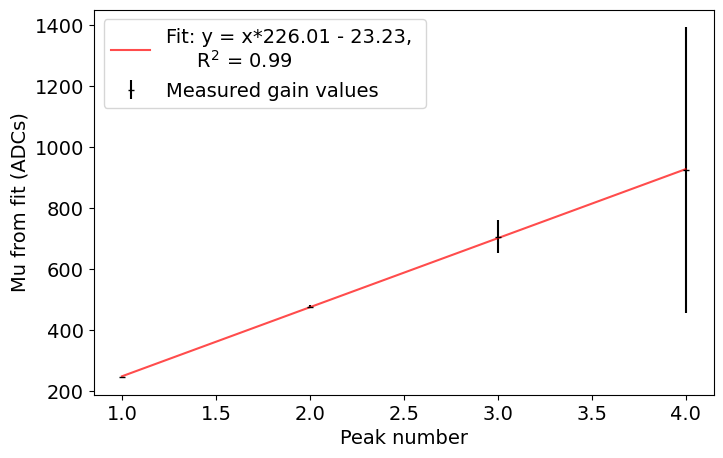

-------------------------------
Channel 1, date = 11_20_2023
-------------------------------


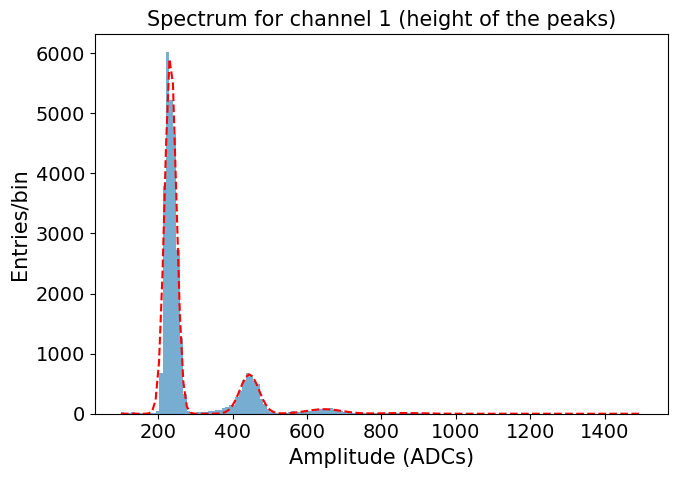

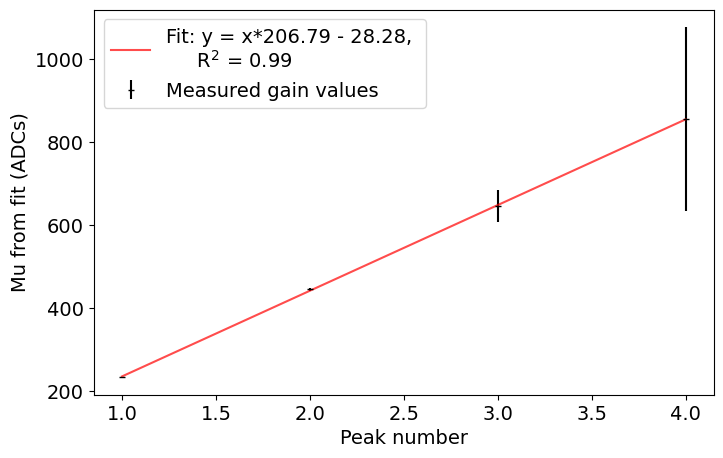

-------------------------------
Channel 2, date = 11_20_2023
-------------------------------


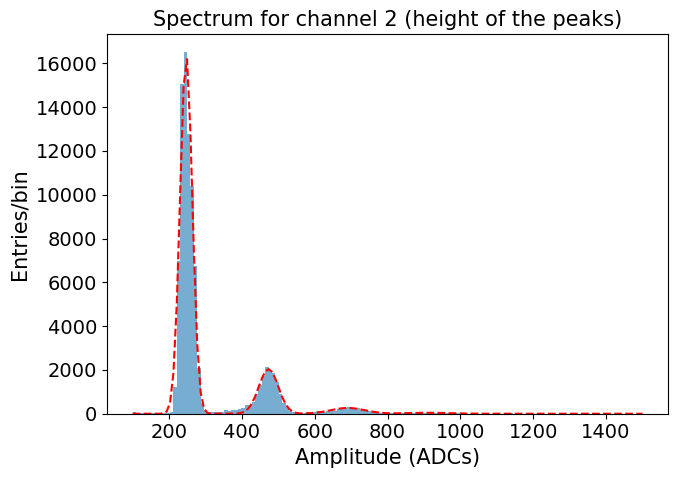

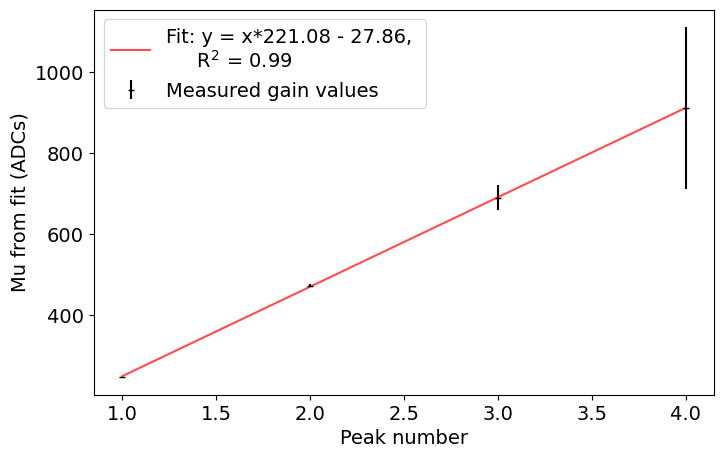

-------------------------------
Channel 3, date = 11_20_2023
-------------------------------


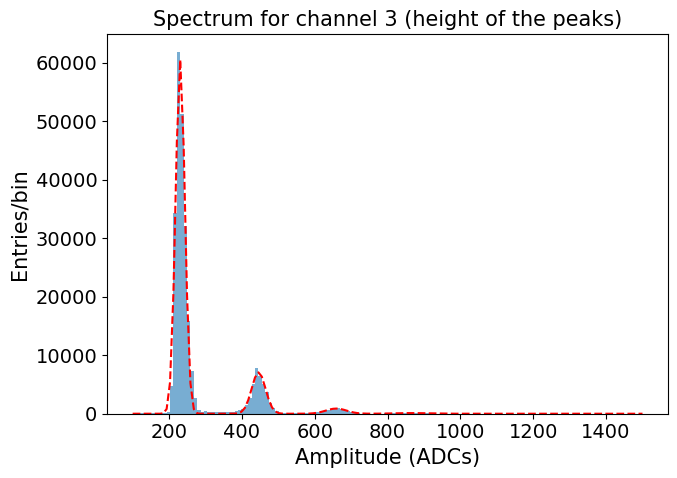

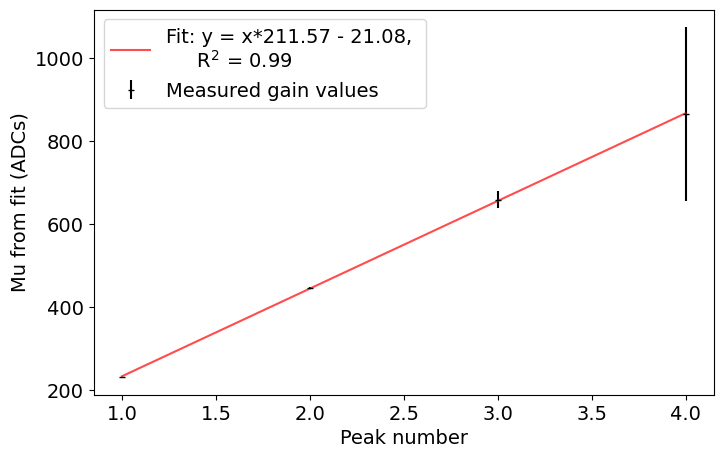

-------------------------------
Channel 4, date = 11_20_2023
-------------------------------


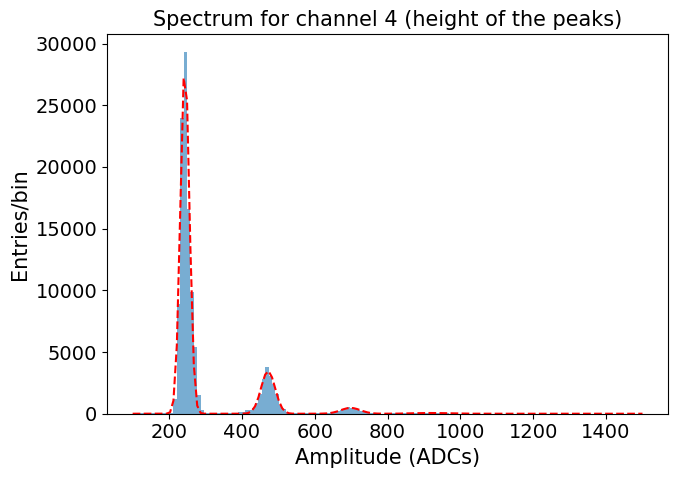

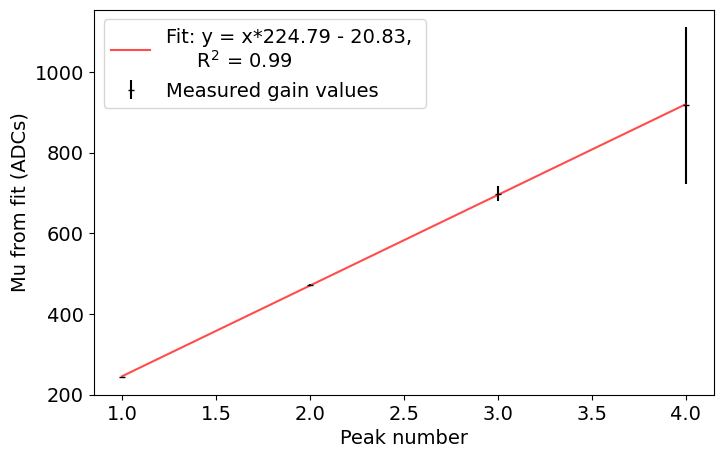

-------------------------------
Channel 5, date = 11_20_2023
-------------------------------


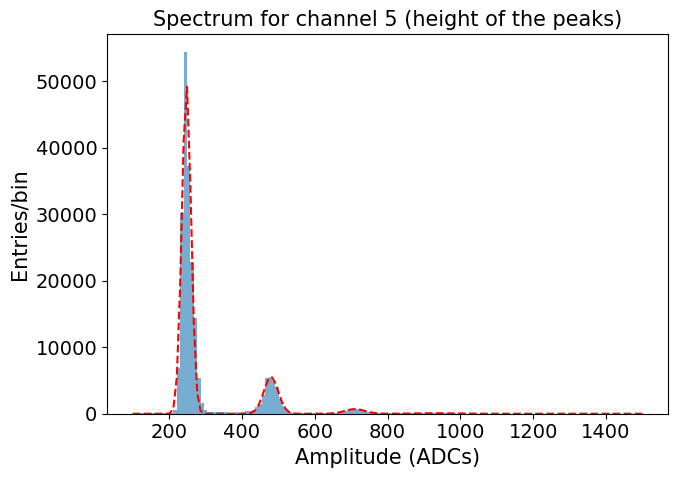

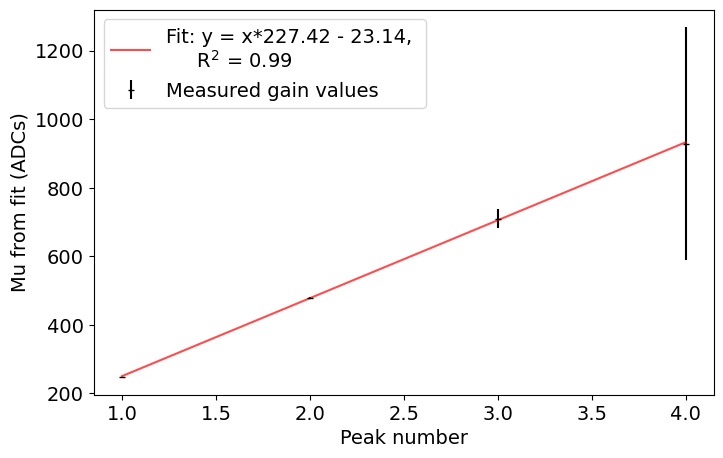

-------------------------------
Channel 6, date = 11_20_2023
-------------------------------


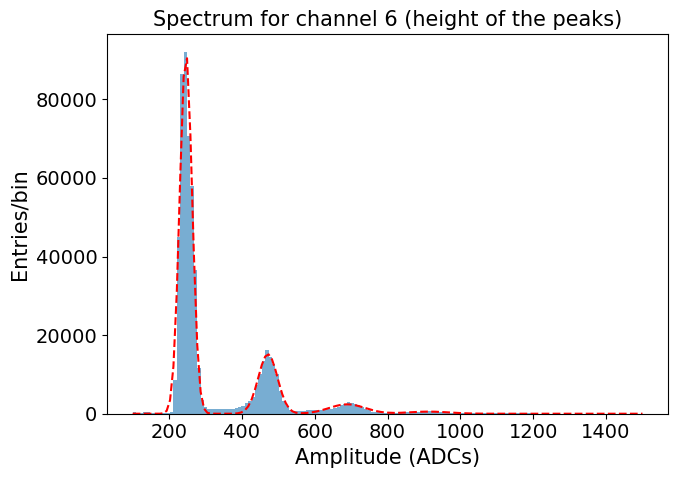

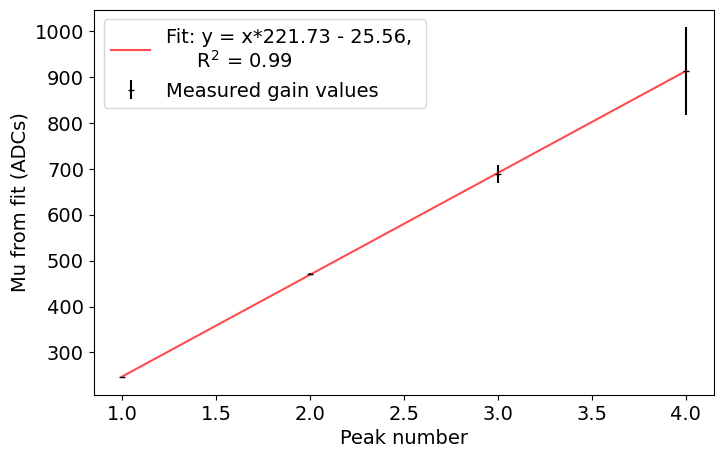

-------------------------------
Channel 7, date = 11_20_2023
-------------------------------


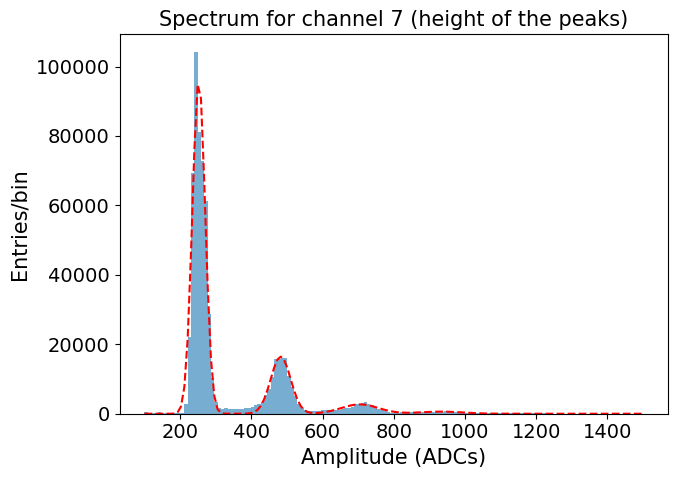

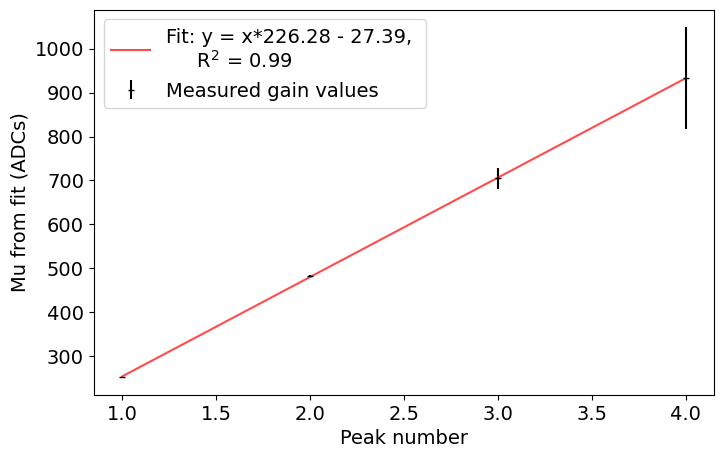

-------------------------------
Channel 8, date = 11_20_2023
-------------------------------


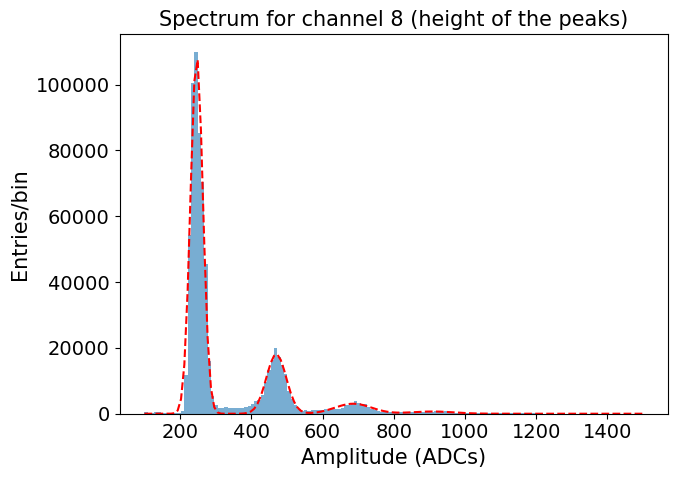

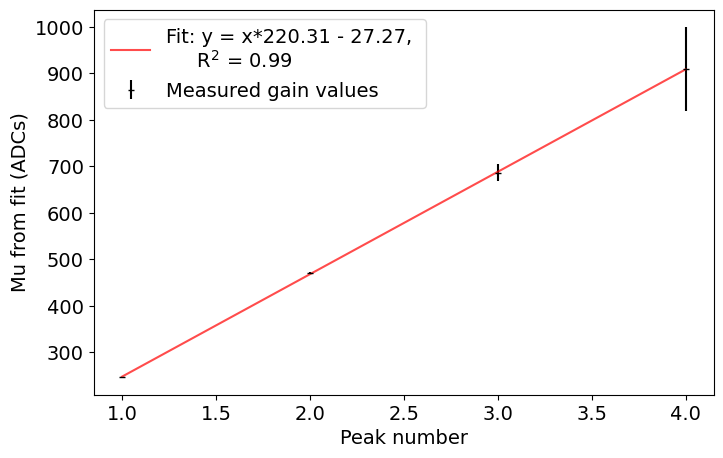

-------------------------------
Channel 0, date = 11_21_2023
-------------------------------


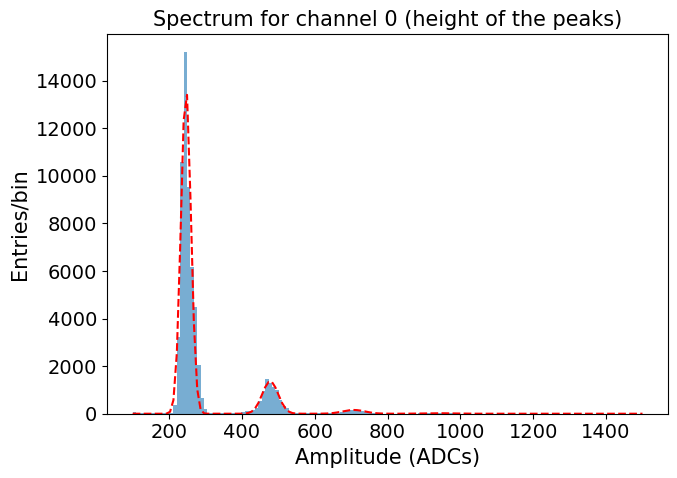

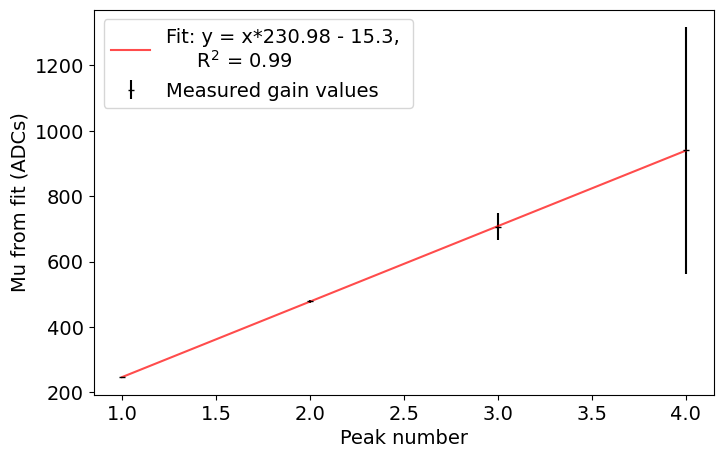

-------------------------------
Channel 1, date = 11_21_2023
-------------------------------


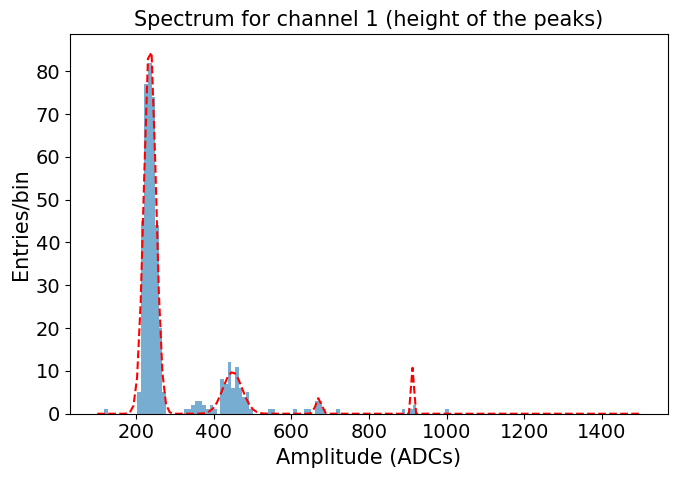

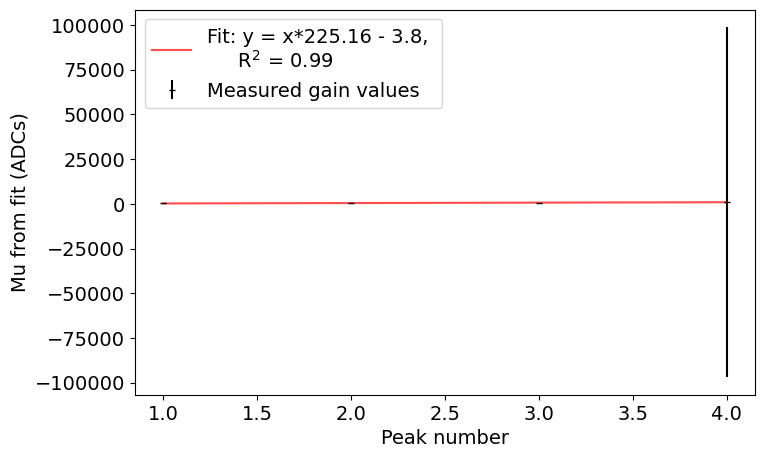

-------------------------------
Channel 2, date = 11_21_2023
-------------------------------


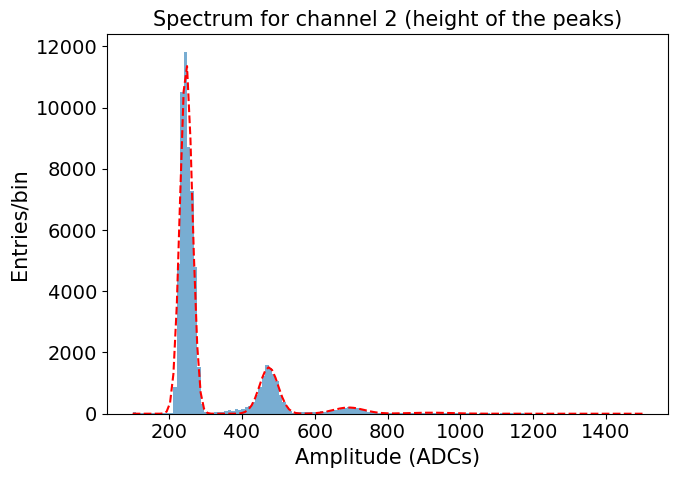

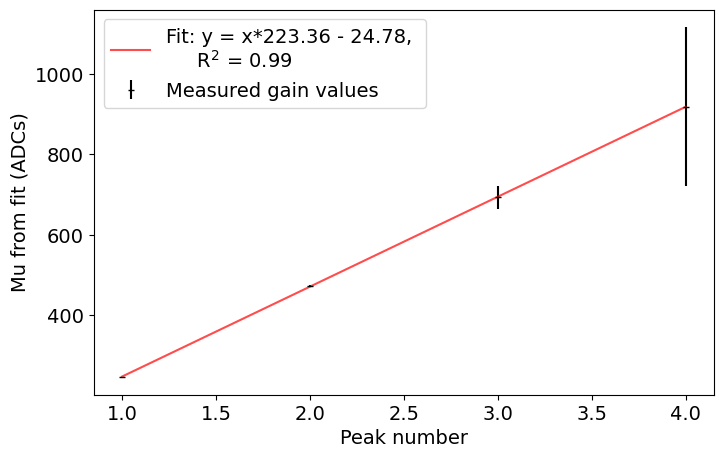

-------------------------------
Channel 3, date = 11_21_2023
-------------------------------


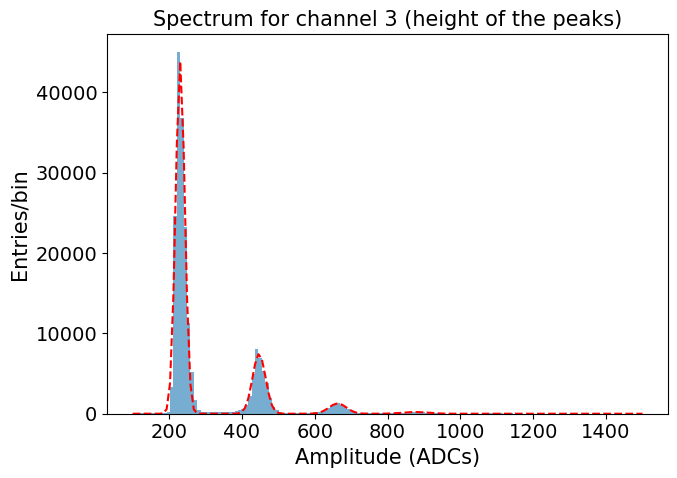

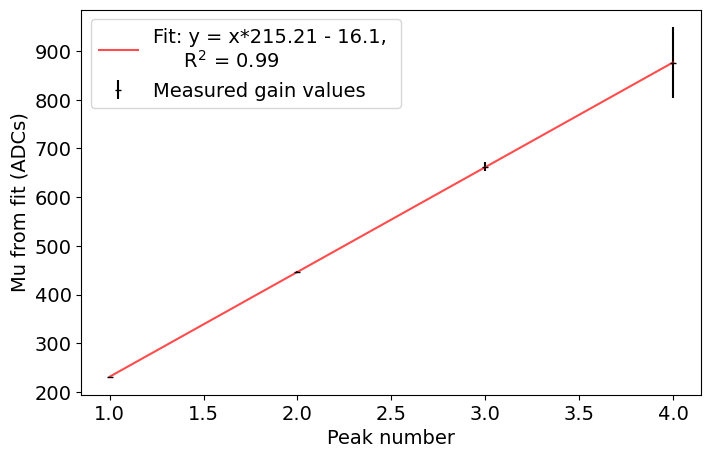

-------------------------------
Channel 4, date = 11_21_2023
-------------------------------


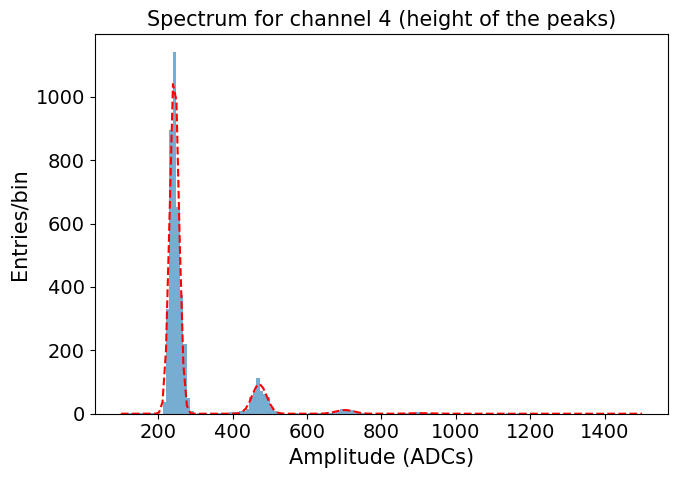

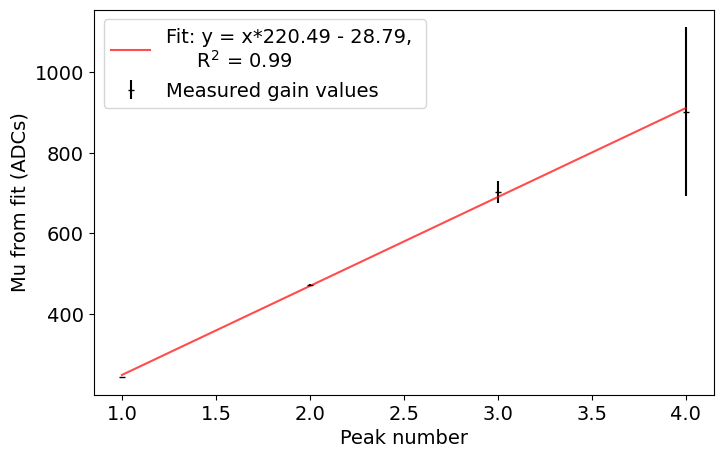

-------------------------------
Channel 5, date = 11_21_2023
-------------------------------


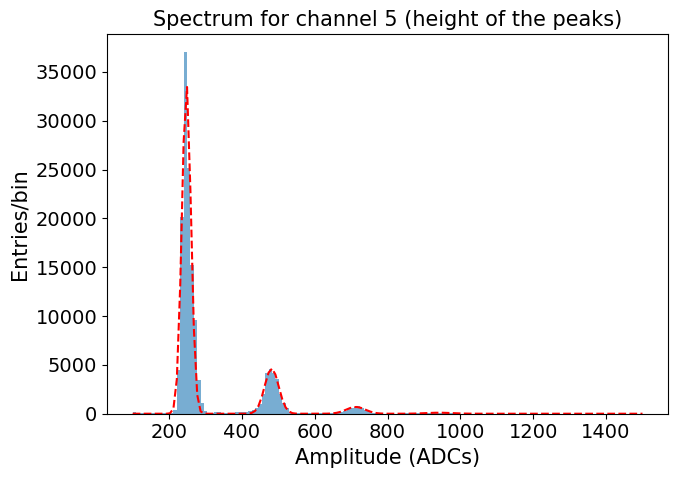

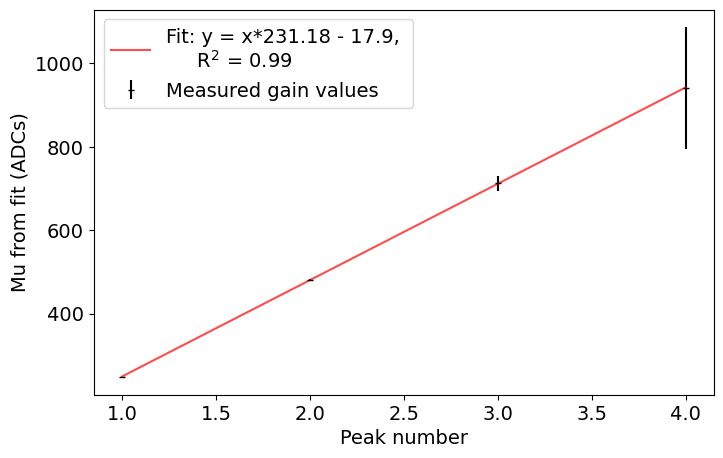

-------------------------------
Channel 6, date = 11_21_2023
-------------------------------


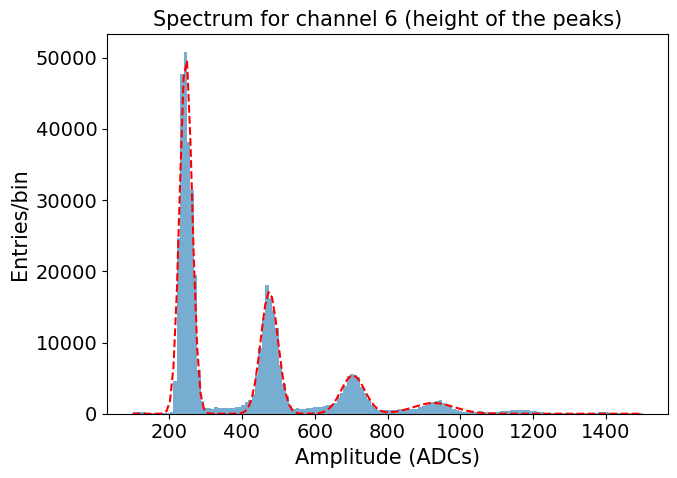

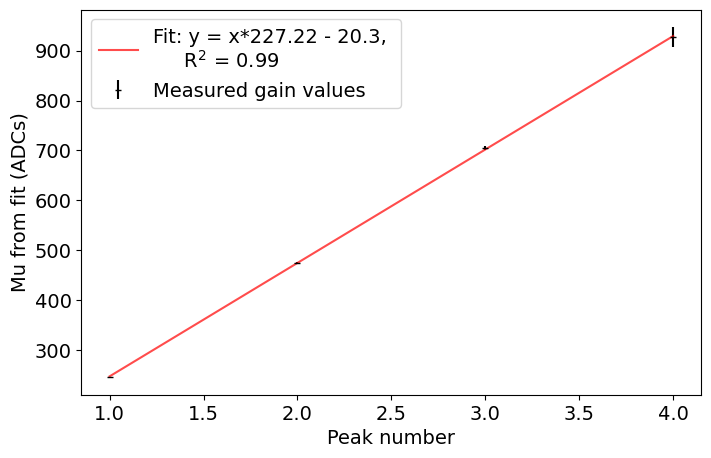

-------------------------------
Channel 7, date = 11_21_2023
-------------------------------
-------------------------------
Channel 8, date = 11_21_2023
-------------------------------


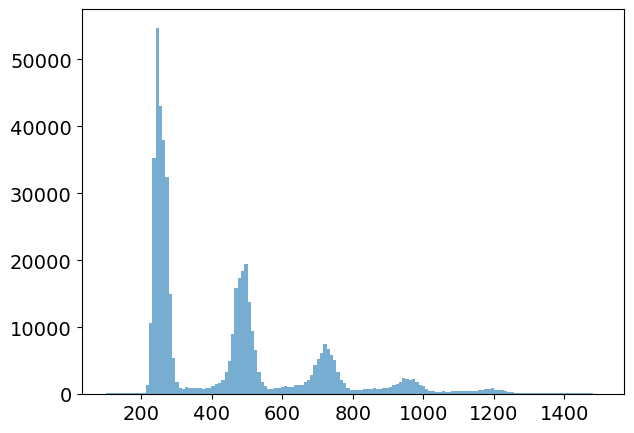

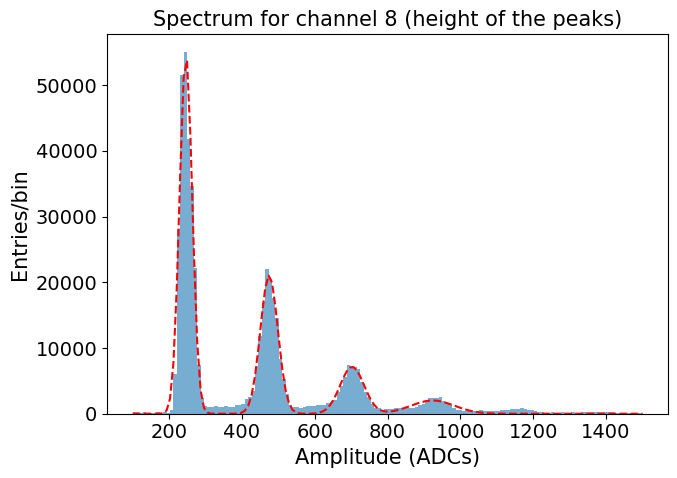

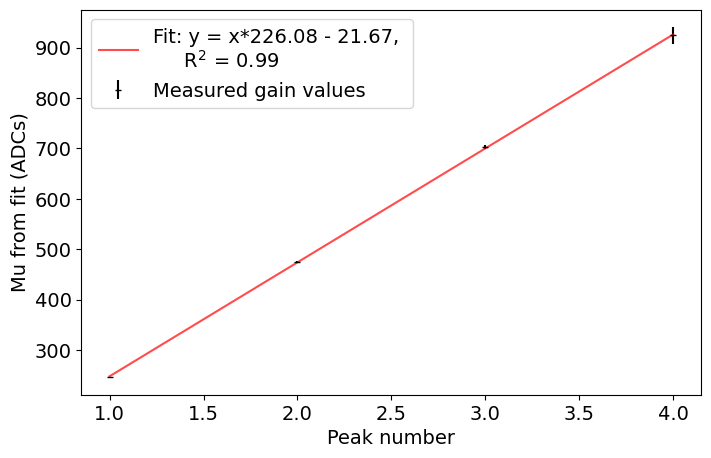

-------------------------------
Channel 0, date = 11_23_2023
-------------------------------


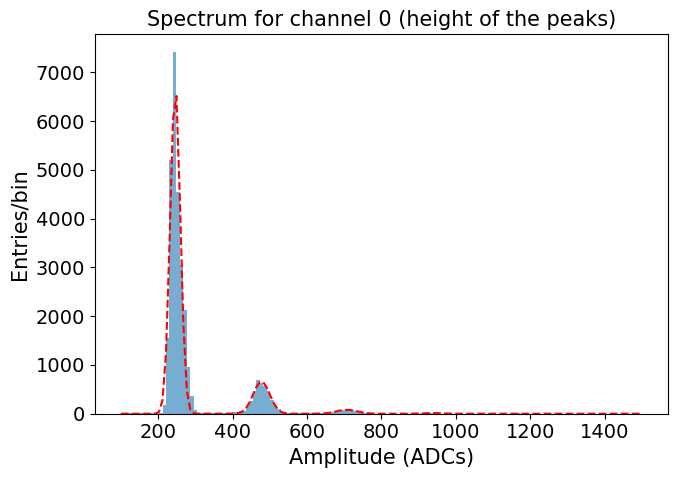

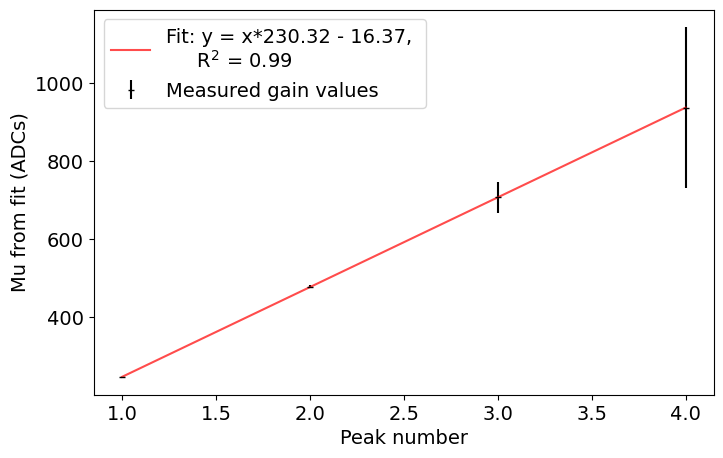

-------------------------------
Channel 1, date = 11_23_2023
-------------------------------


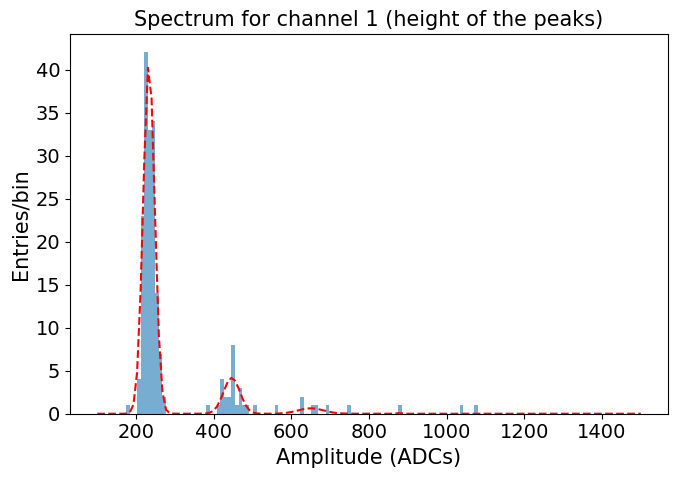

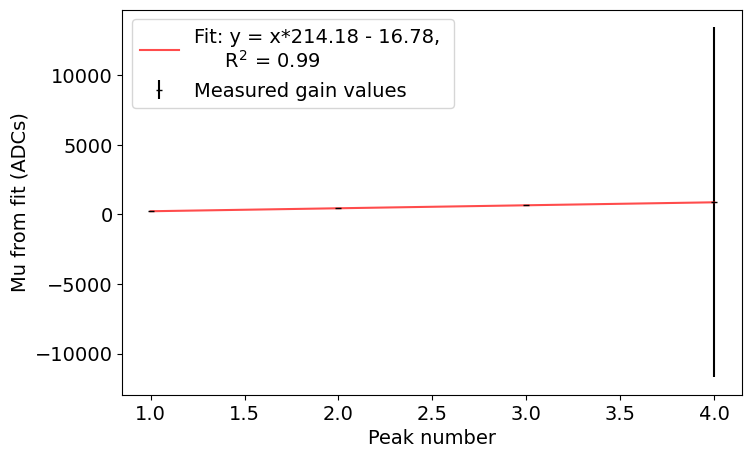

-------------------------------
Channel 2, date = 11_23_2023
-------------------------------


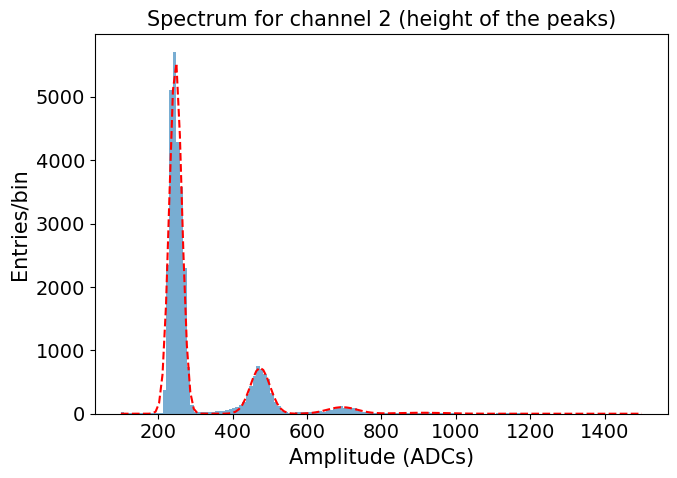

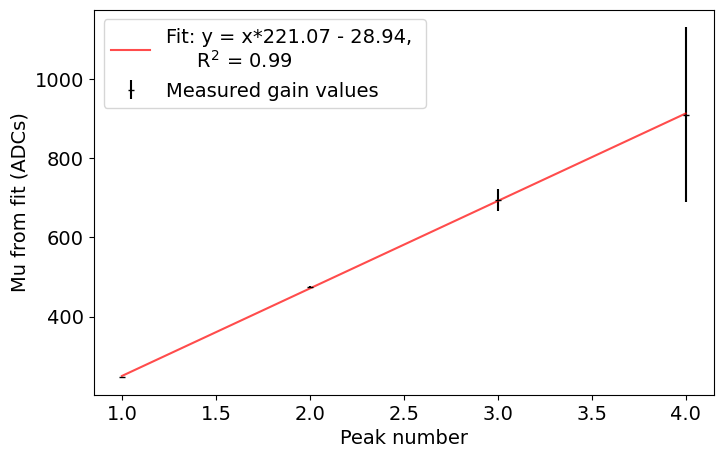

-------------------------------
Channel 3, date = 11_23_2023
-------------------------------


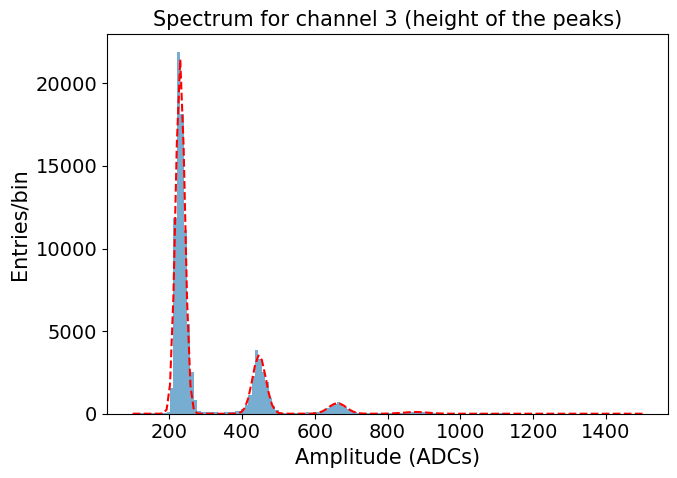

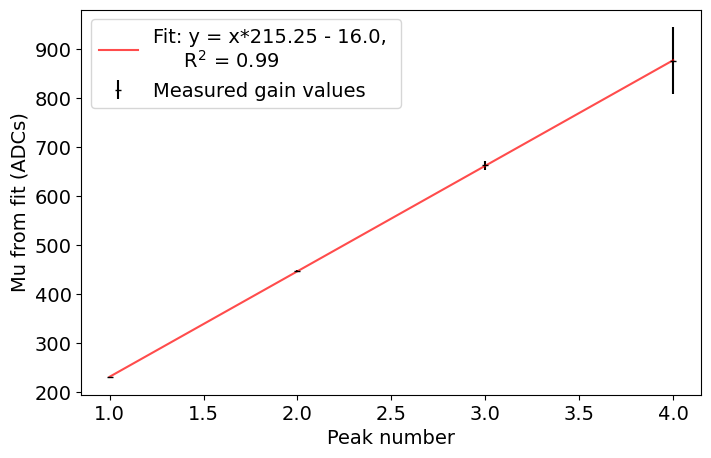

-------------------------------
Channel 4, date = 11_23_2023
-------------------------------


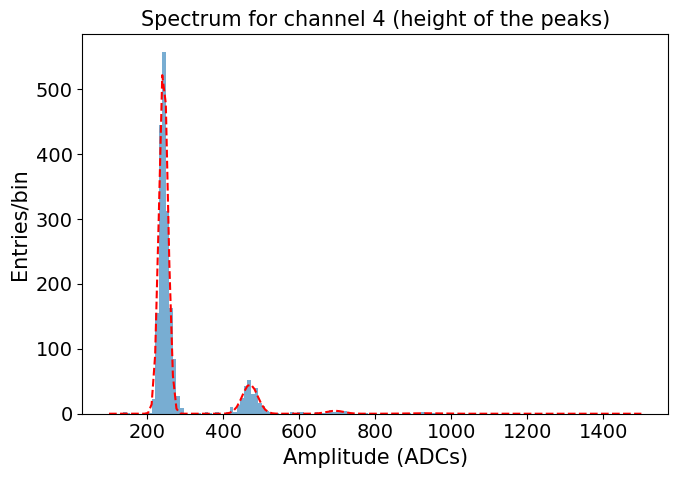

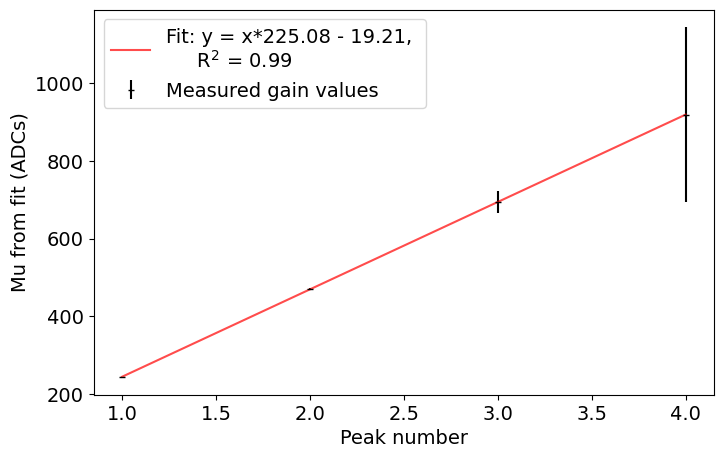

-------------------------------
Channel 5, date = 11_23_2023
-------------------------------


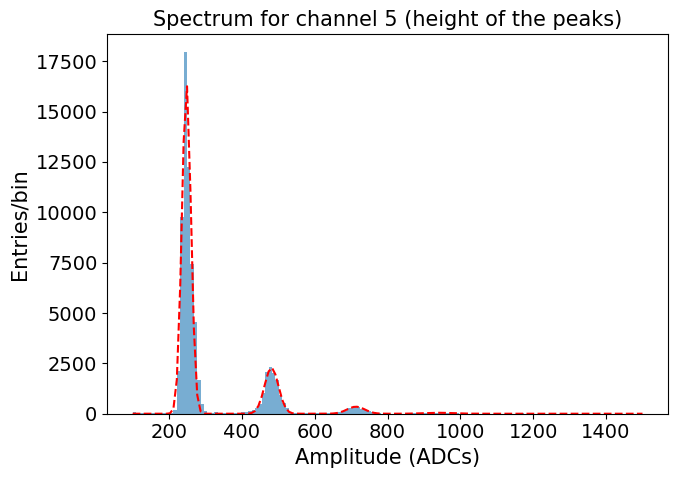

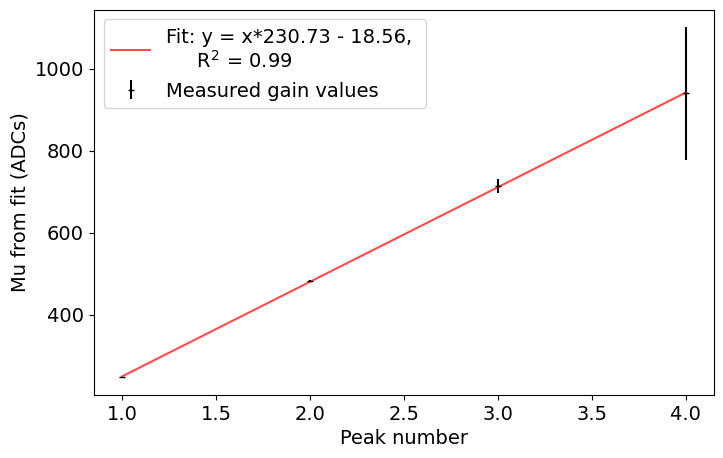

-------------------------------
Channel 6, date = 11_23_2023
-------------------------------


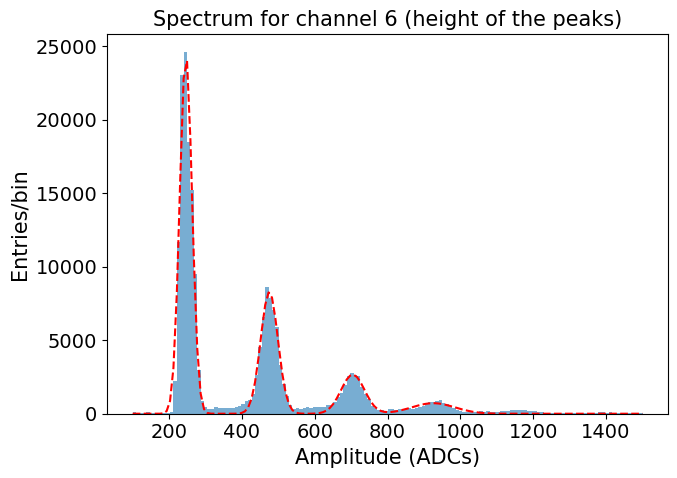

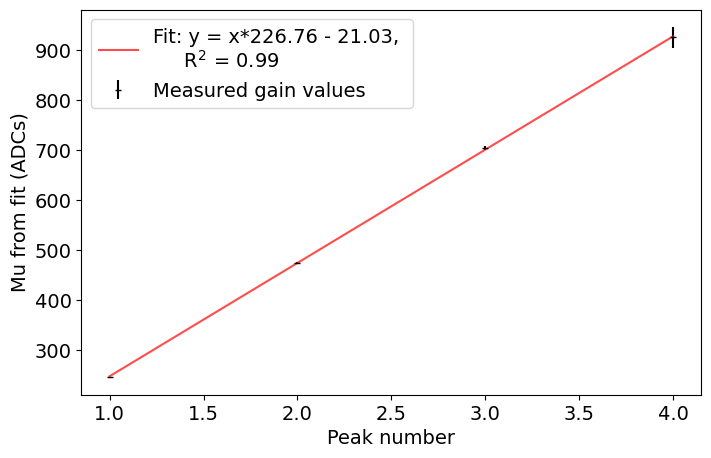

-------------------------------
Channel 7, date = 11_23_2023
-------------------------------


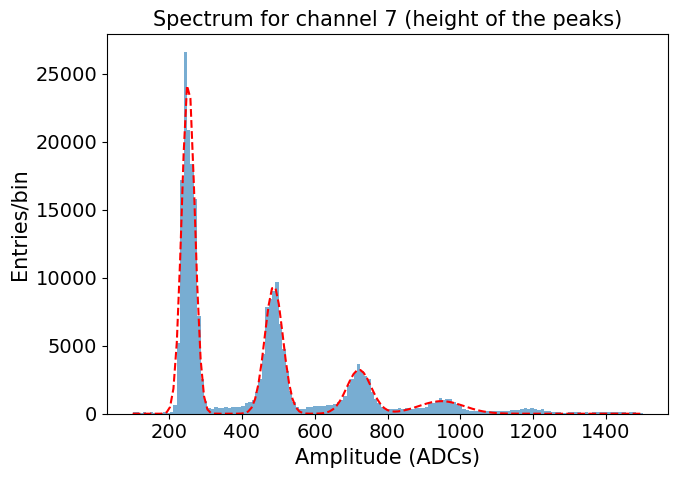

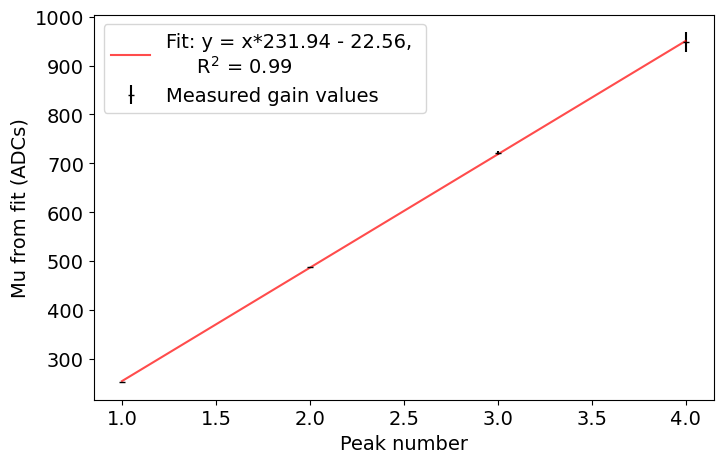

-------------------------------
Channel 8, date = 11_23_2023
-------------------------------


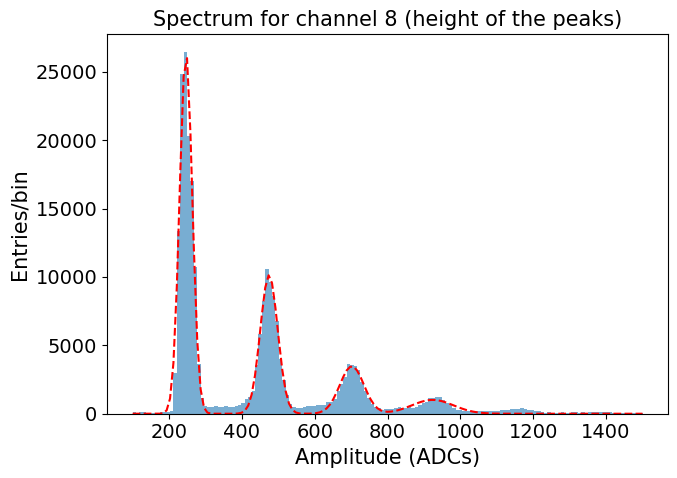

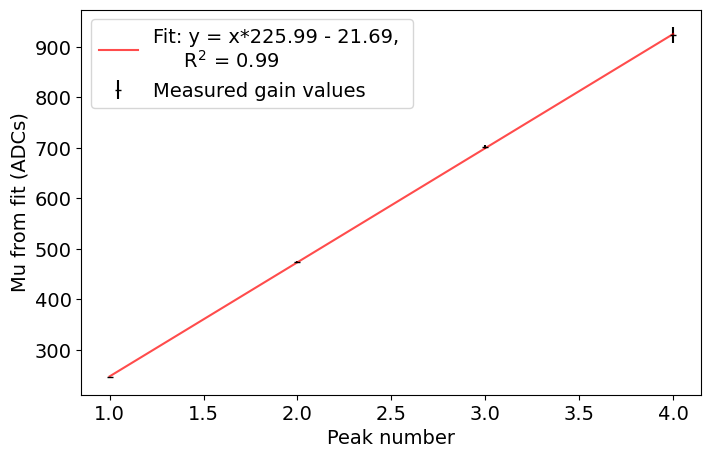

-------------------------------
Channel 0, date = 11_24_2023
-------------------------------


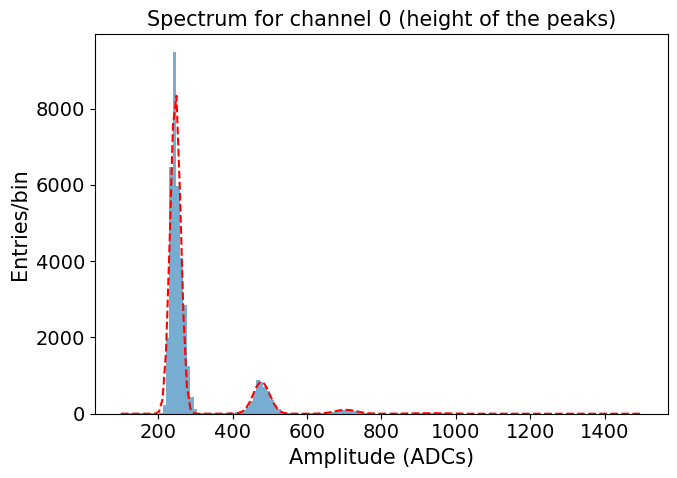

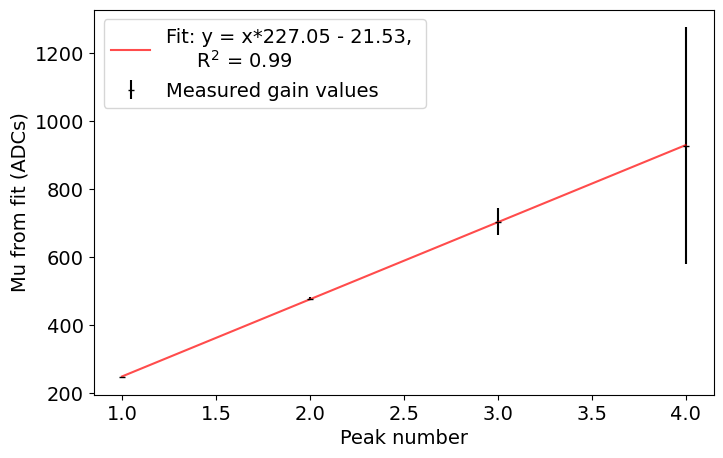

-------------------------------
Channel 1, date = 11_24_2023
-------------------------------


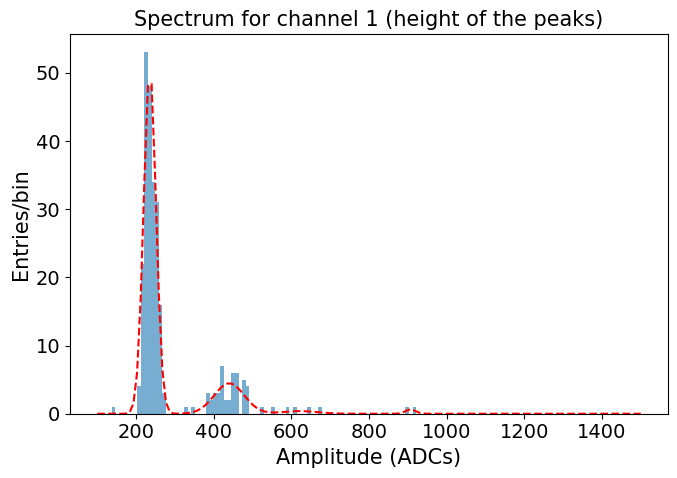

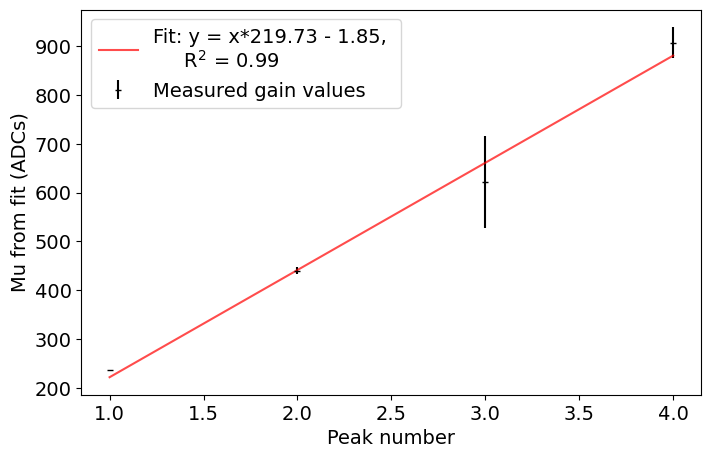

-------------------------------
Channel 2, date = 11_24_2023
-------------------------------


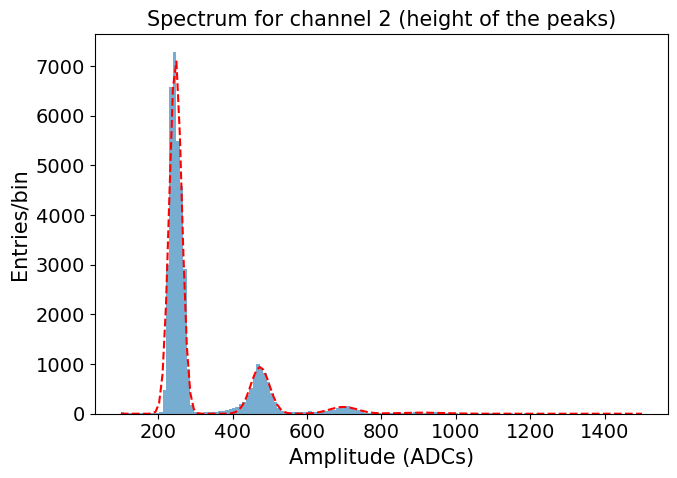

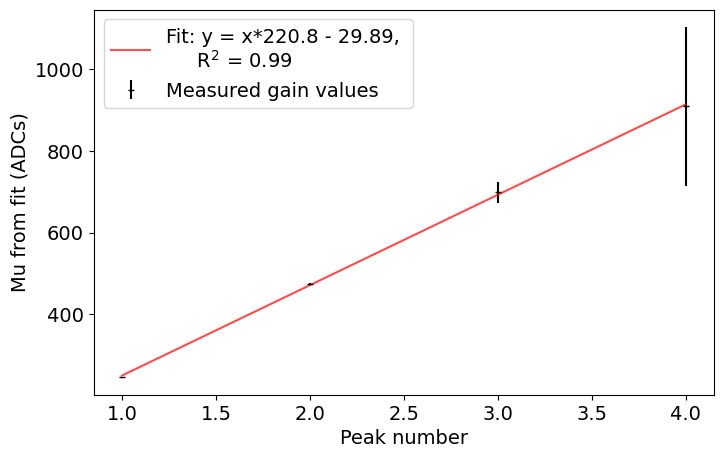

-------------------------------
Channel 3, date = 11_24_2023
-------------------------------


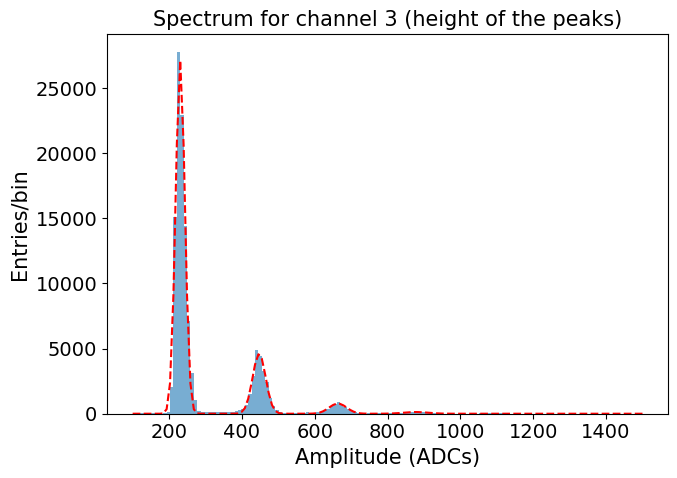

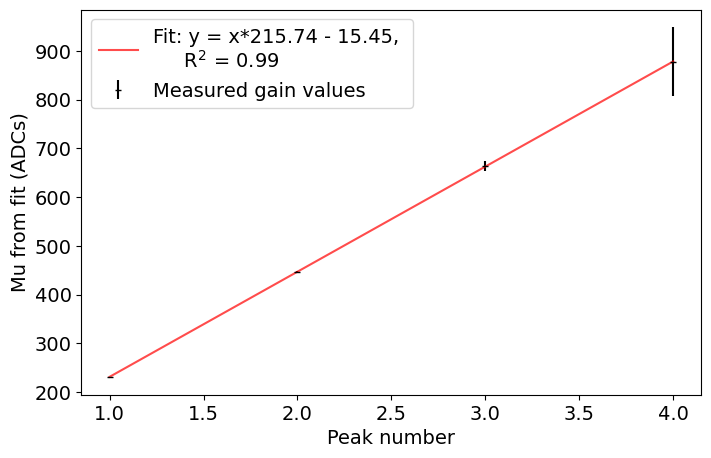

-------------------------------
Channel 4, date = 11_24_2023
-------------------------------


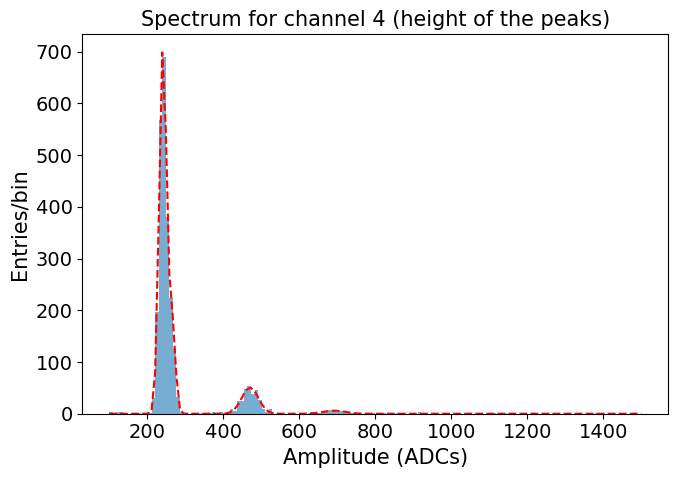

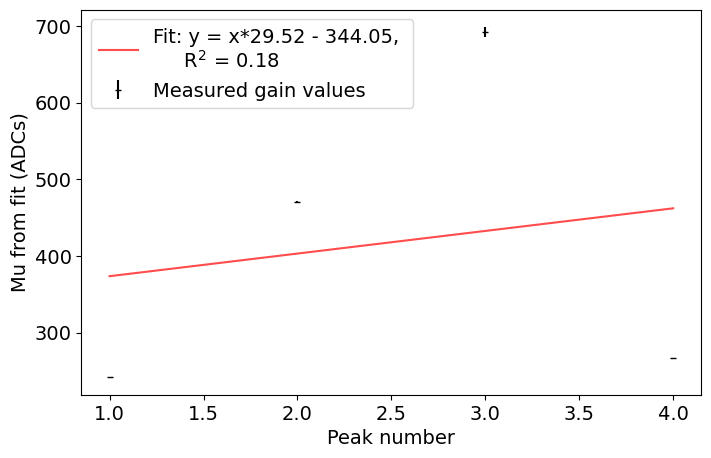

-------------------------------
Channel 5, date = 11_24_2023
-------------------------------


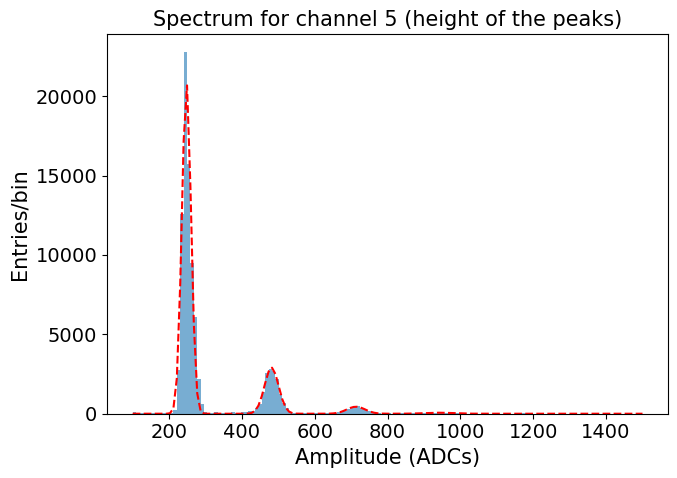

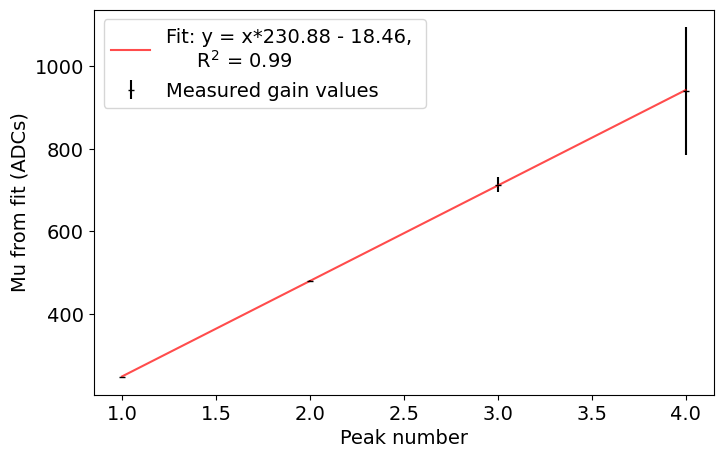

-------------------------------
Channel 6, date = 11_24_2023
-------------------------------


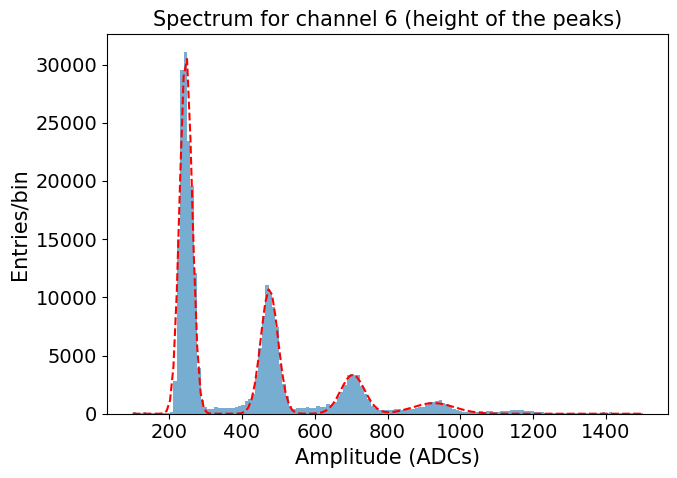

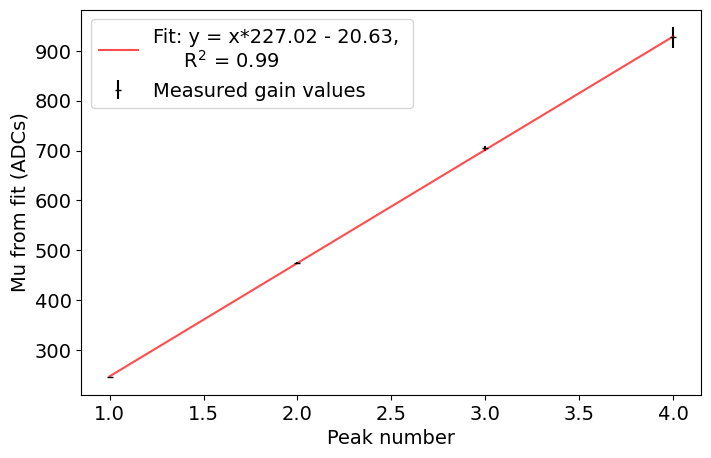

-------------------------------
Channel 7, date = 11_24_2023
-------------------------------


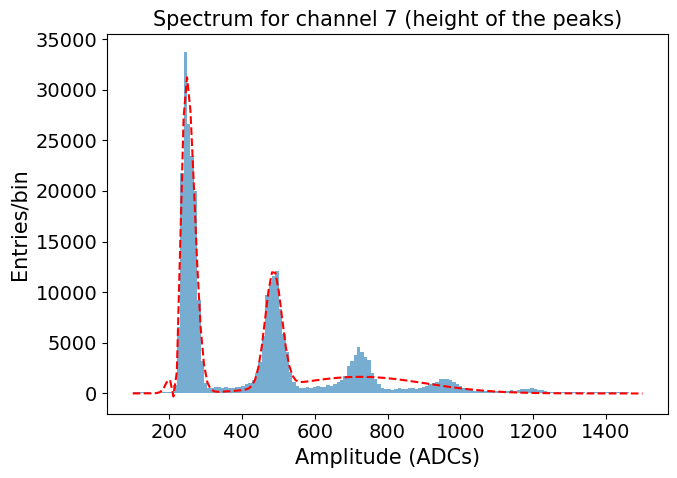

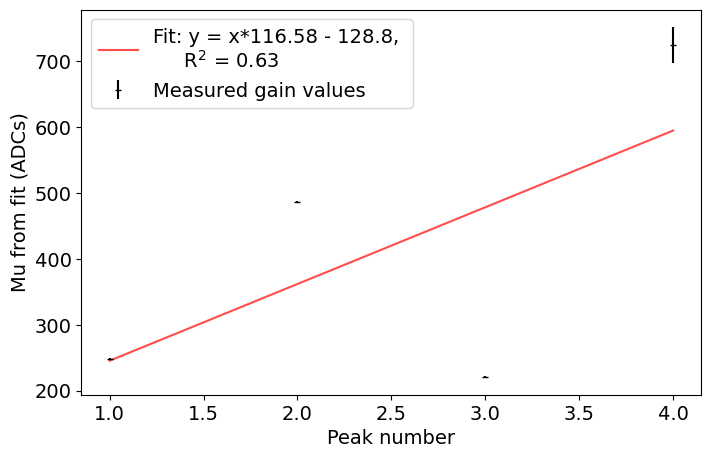

-------------------------------
Channel 8, date = 11_24_2023
-------------------------------


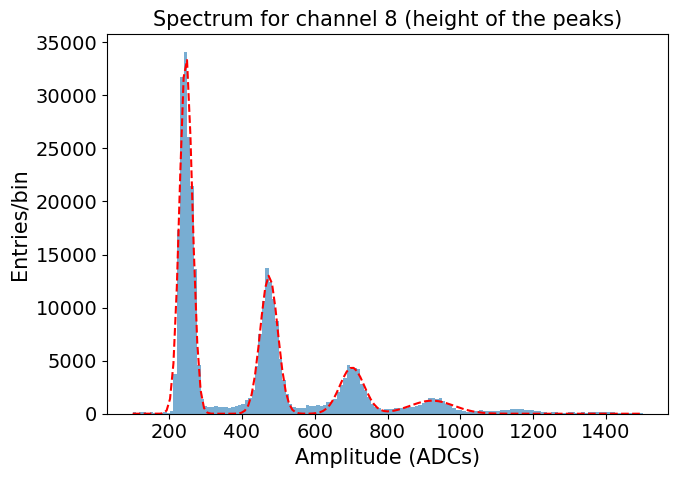

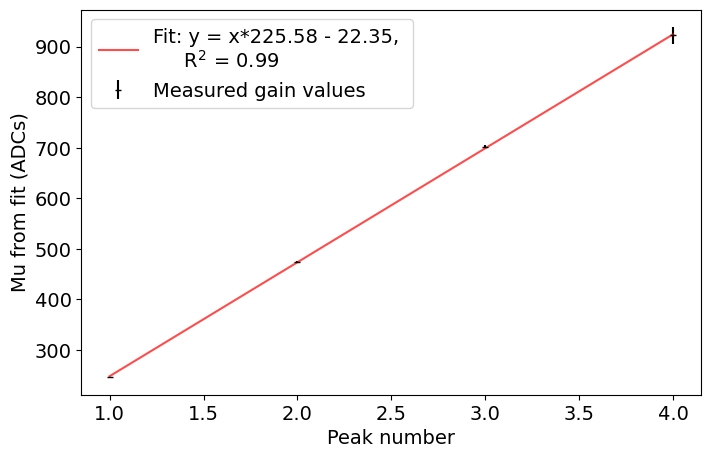

-------------------------------
Channel 0, date = 11_25_2023
-------------------------------


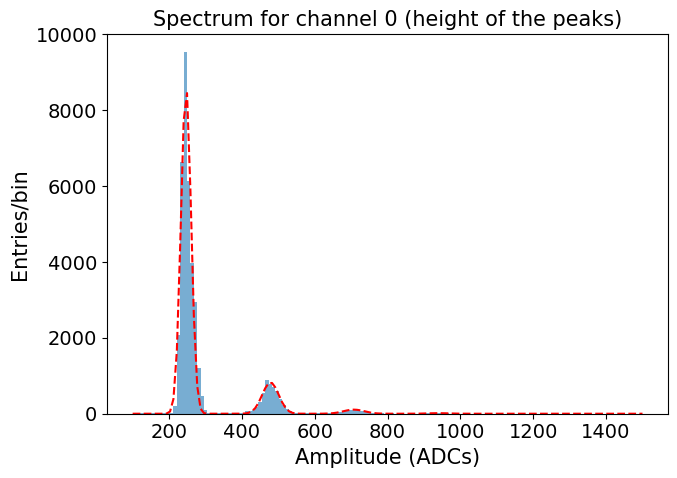

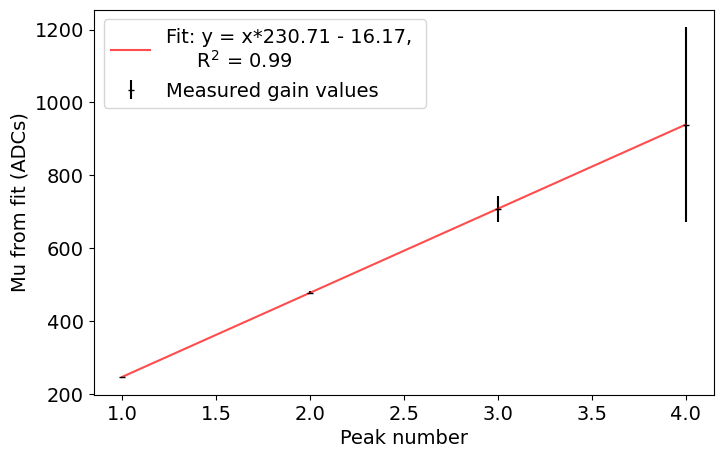

-------------------------------
Channel 1, date = 11_25_2023
-------------------------------


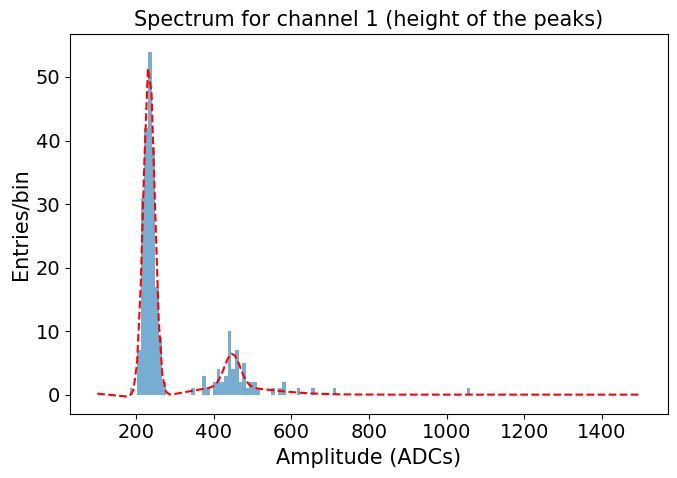

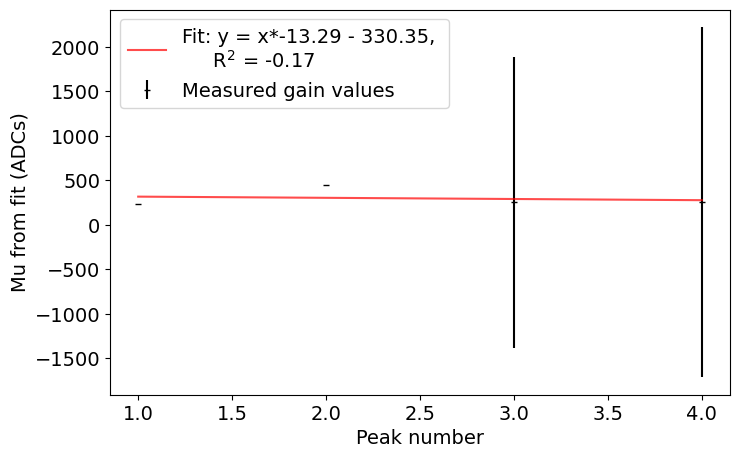

-------------------------------
Channel 2, date = 11_25_2023
-------------------------------


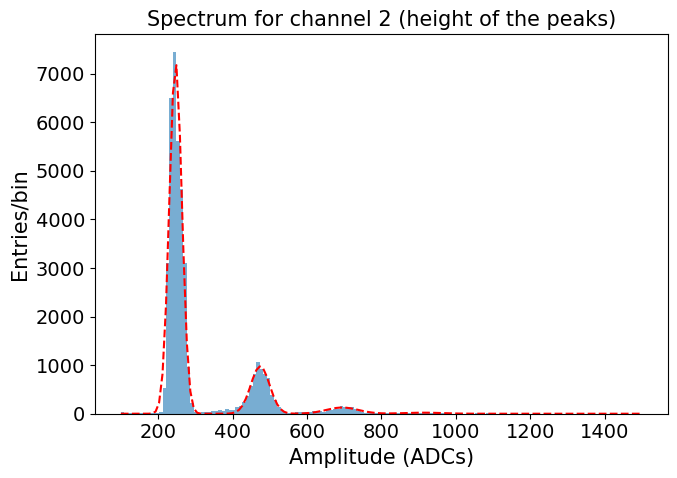

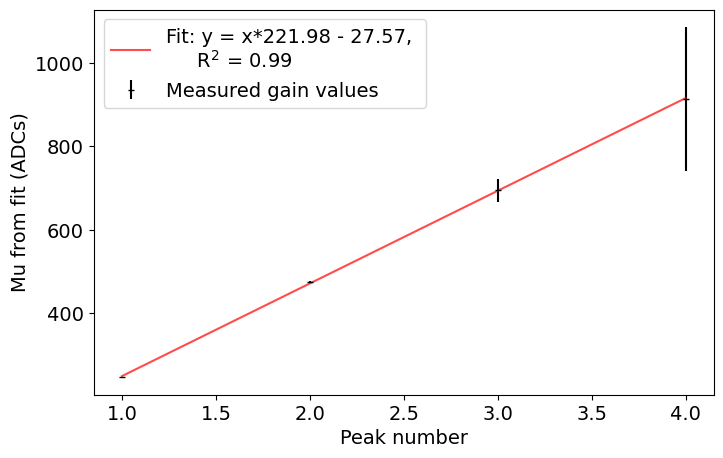

-------------------------------
Channel 3, date = 11_25_2023
-------------------------------


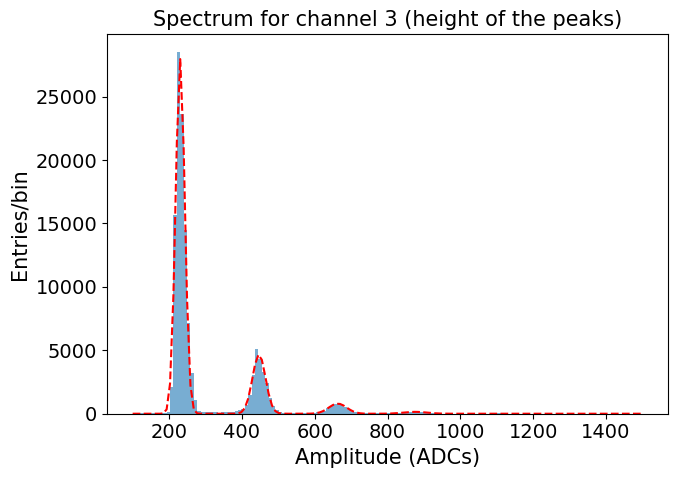

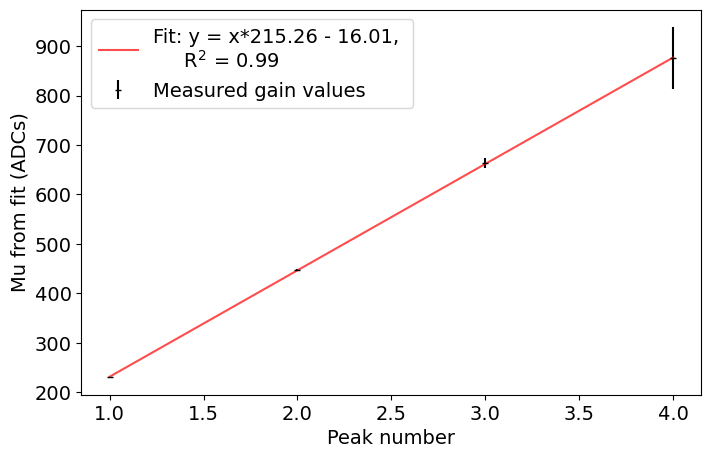

-------------------------------
Channel 4, date = 11_25_2023
-------------------------------


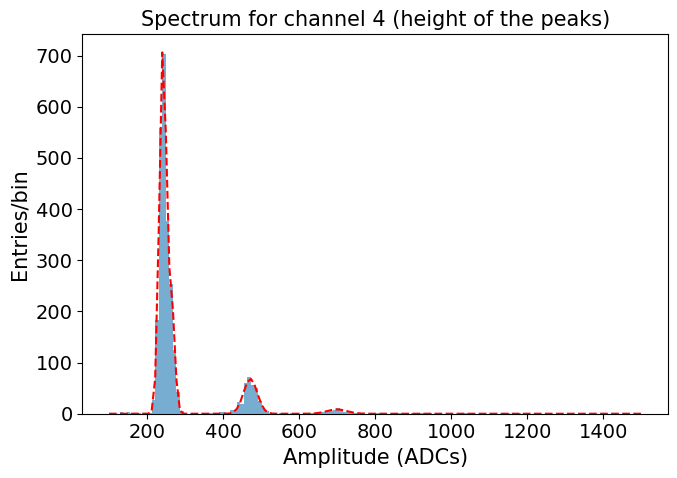

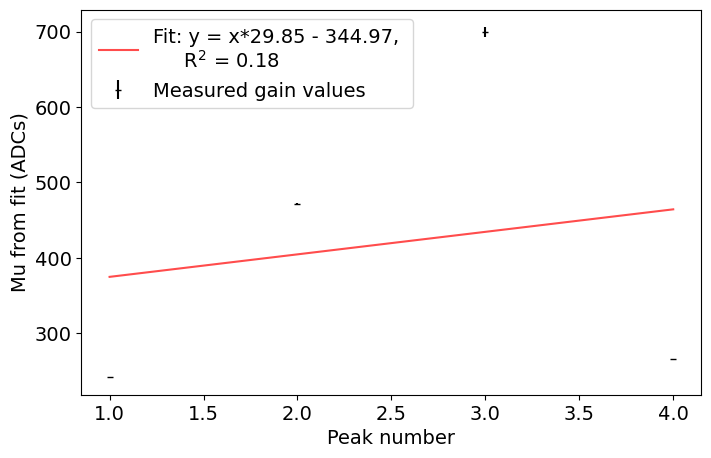

-------------------------------
Channel 5, date = 11_25_2023
-------------------------------


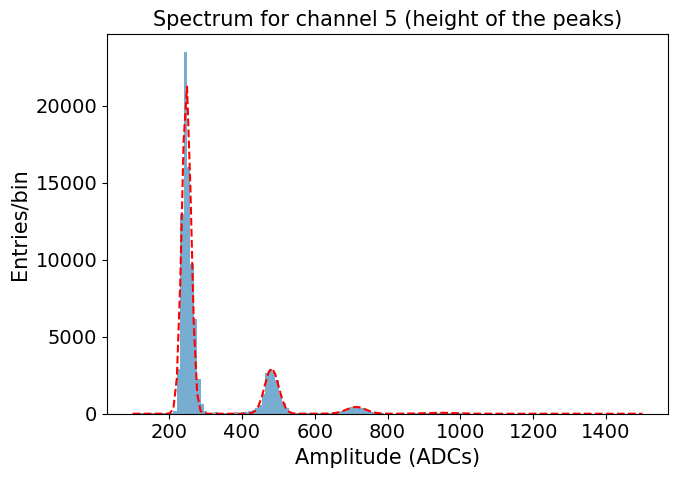

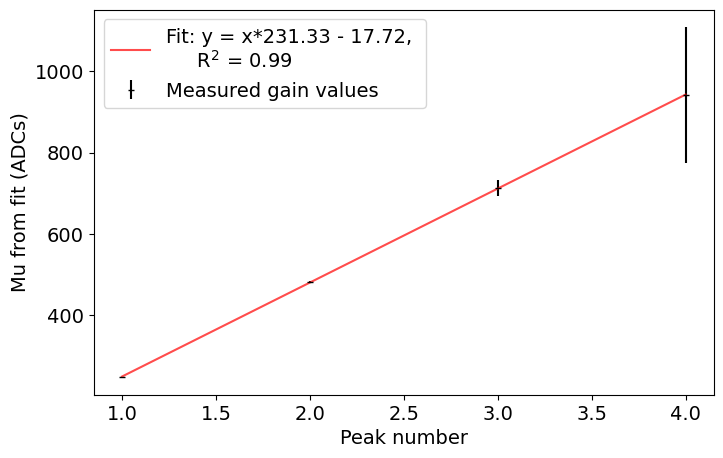

-------------------------------
Channel 6, date = 11_25_2023
-------------------------------


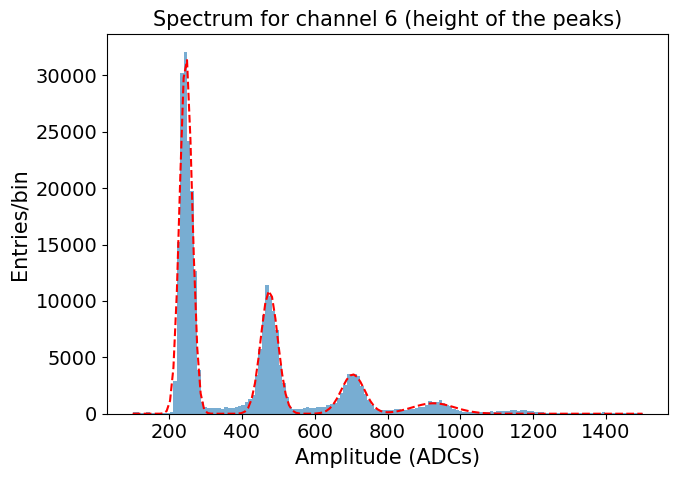

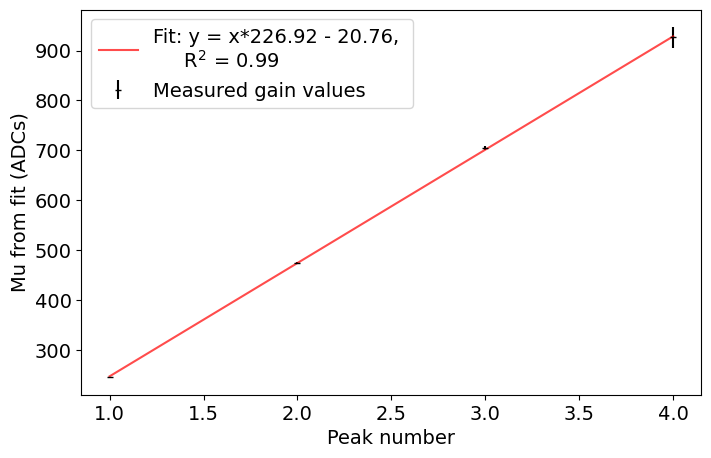

-------------------------------
Channel 7, date = 11_25_2023
-------------------------------


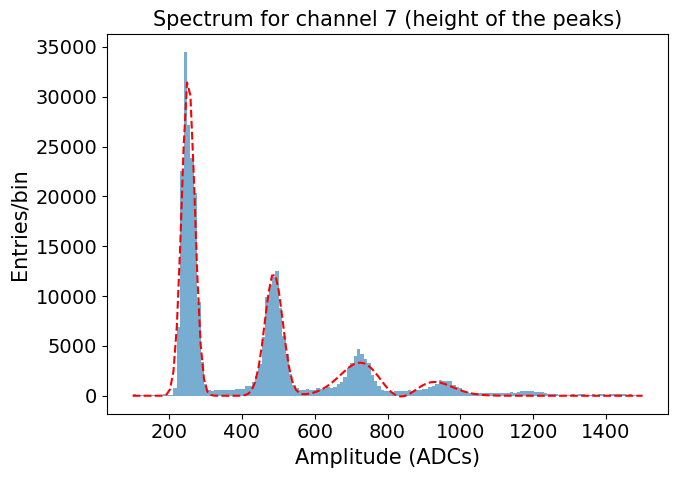

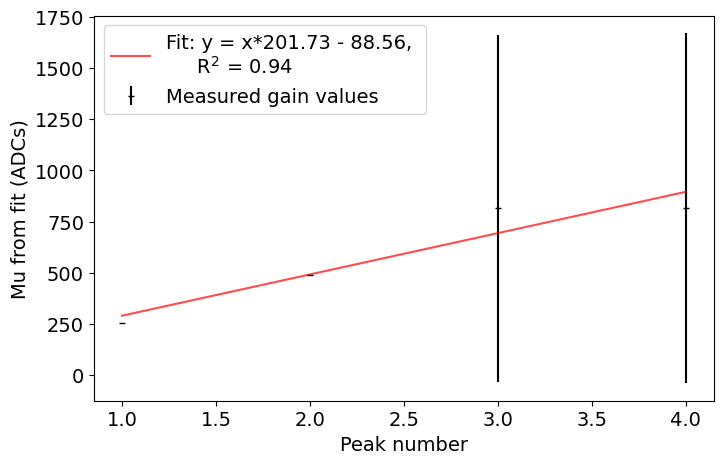

-------------------------------
Channel 8, date = 11_25_2023
-------------------------------


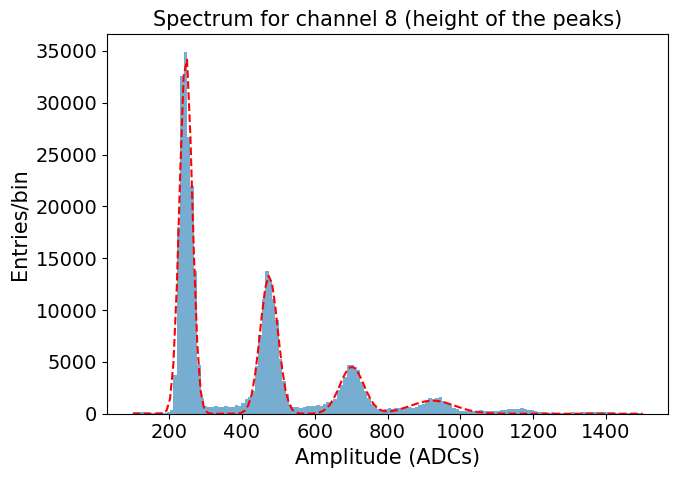

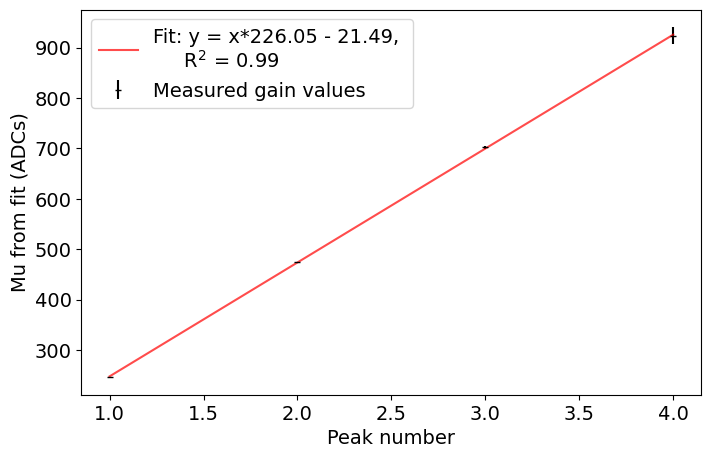

-------------------------------
Channel 0, date = 11_26_2023
-------------------------------


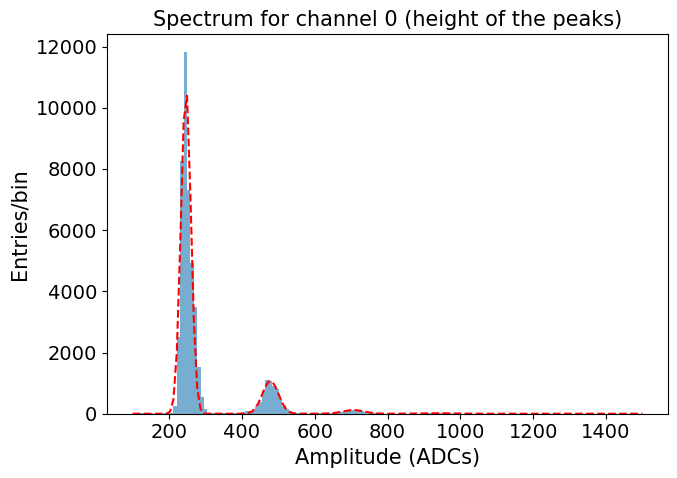

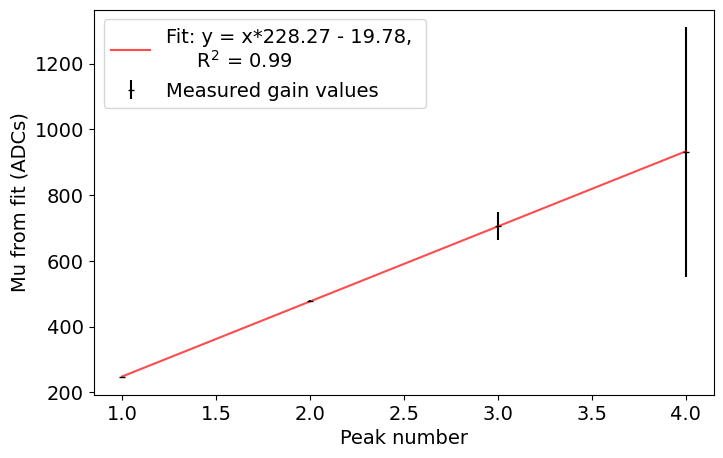

-------------------------------
Channel 1, date = 11_26_2023
-------------------------------


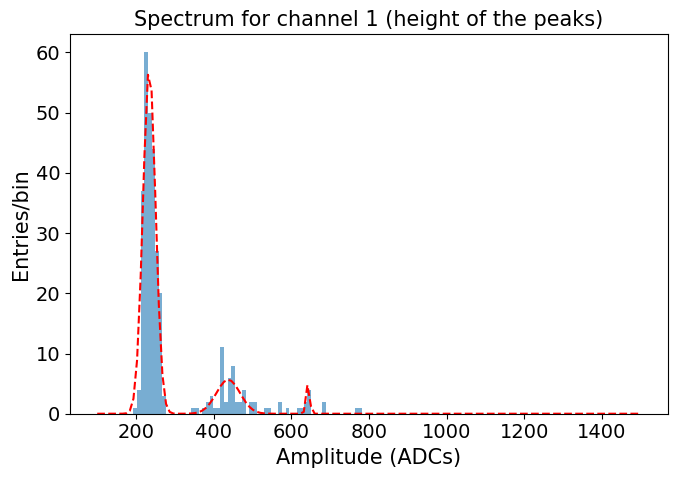

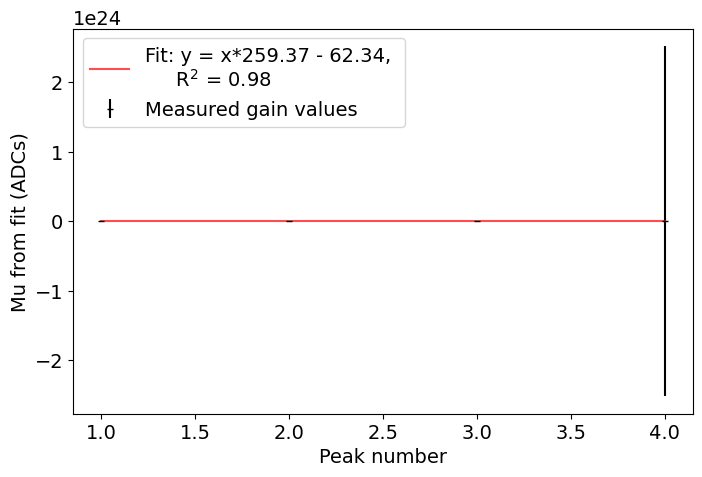

-------------------------------
Channel 2, date = 11_26_2023
-------------------------------


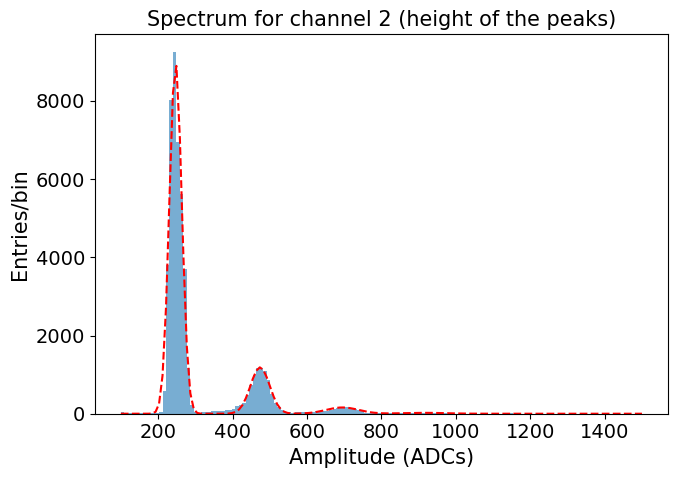

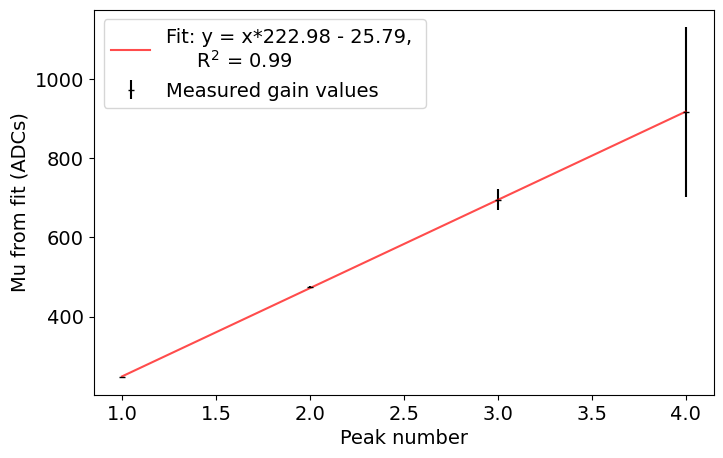

-------------------------------
Channel 3, date = 11_26_2023
-------------------------------


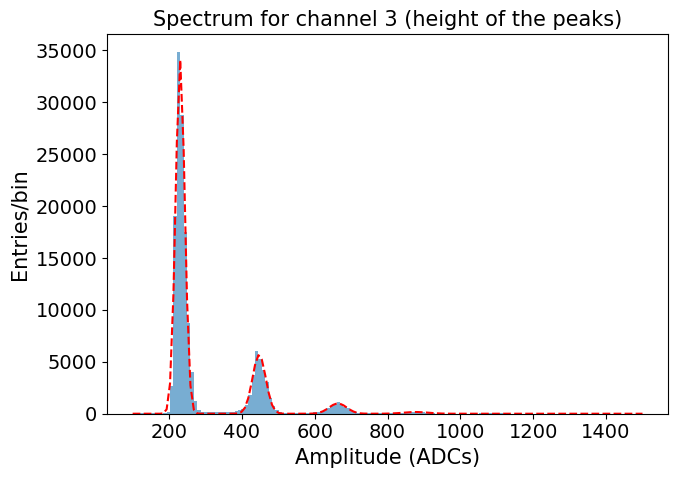

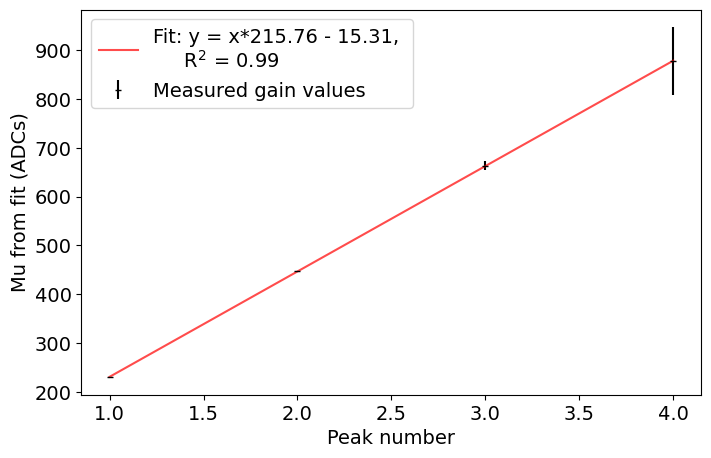

-------------------------------
Channel 4, date = 11_26_2023
-------------------------------


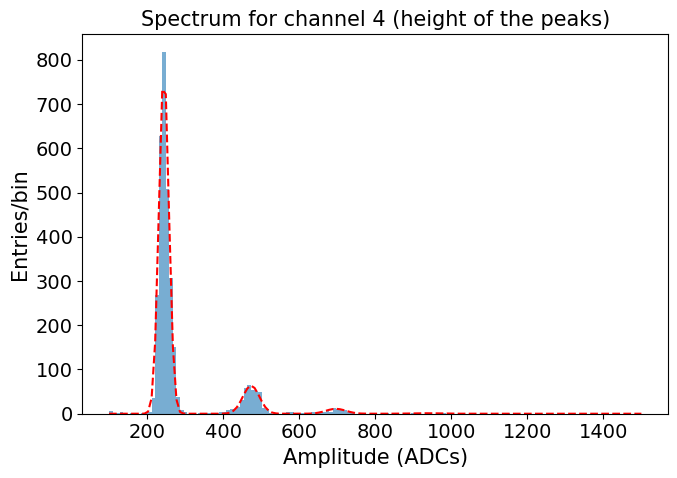

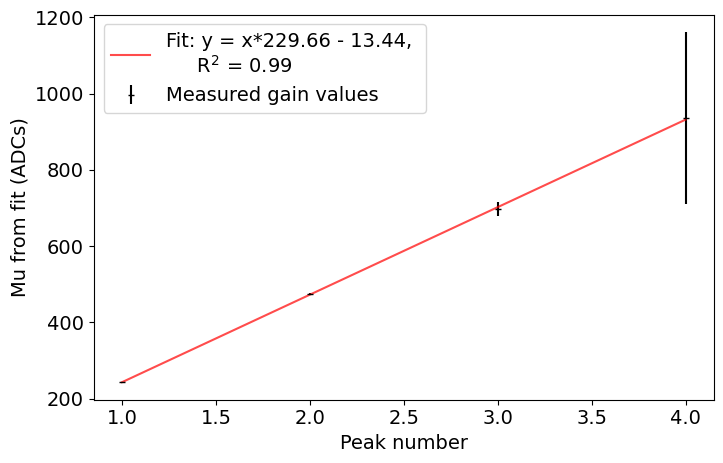

-------------------------------
Channel 5, date = 11_26_2023
-------------------------------


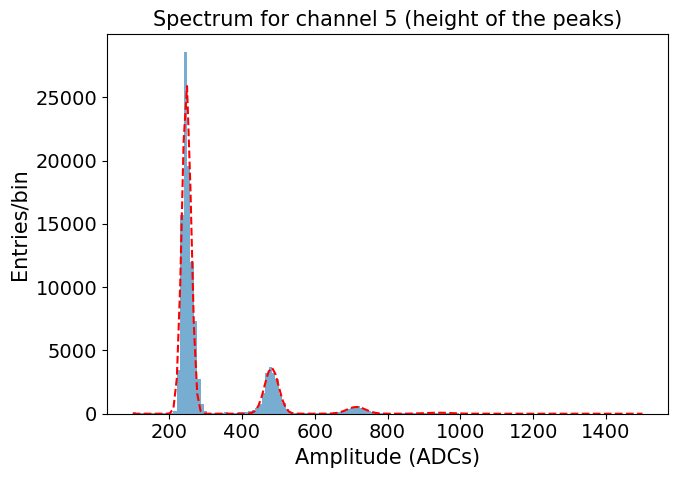

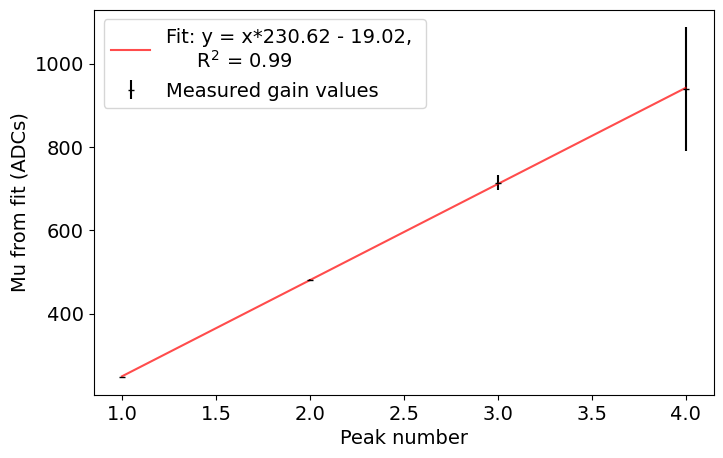

-------------------------------
Channel 6, date = 11_26_2023
-------------------------------


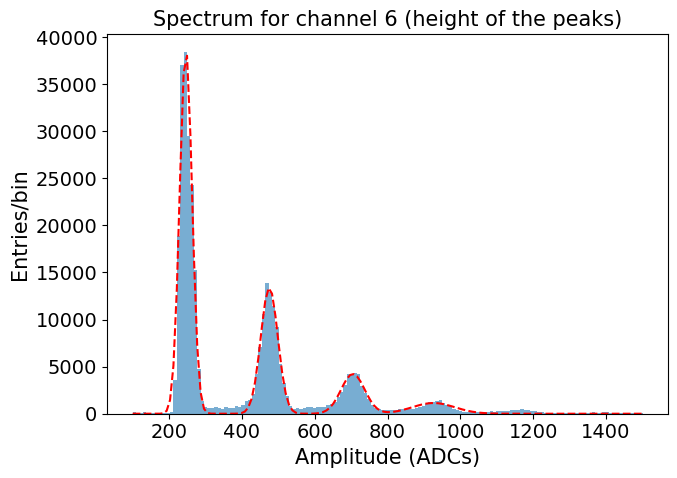

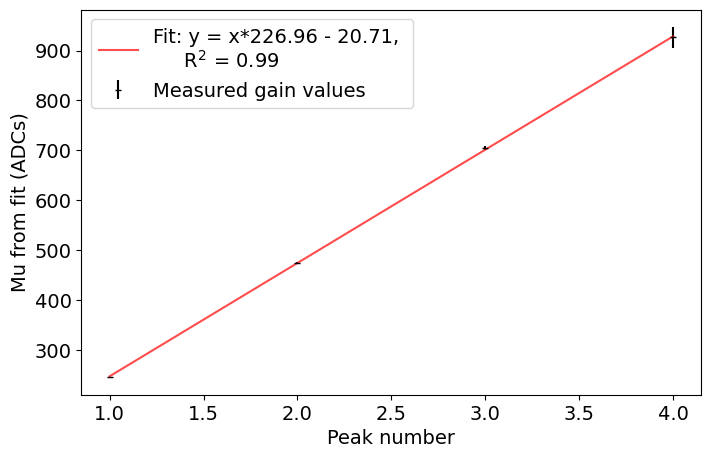

-------------------------------
Channel 7, date = 11_26_2023
-------------------------------


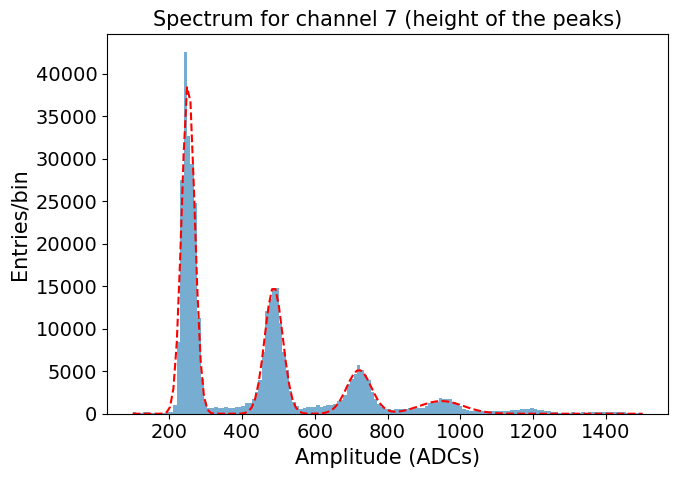

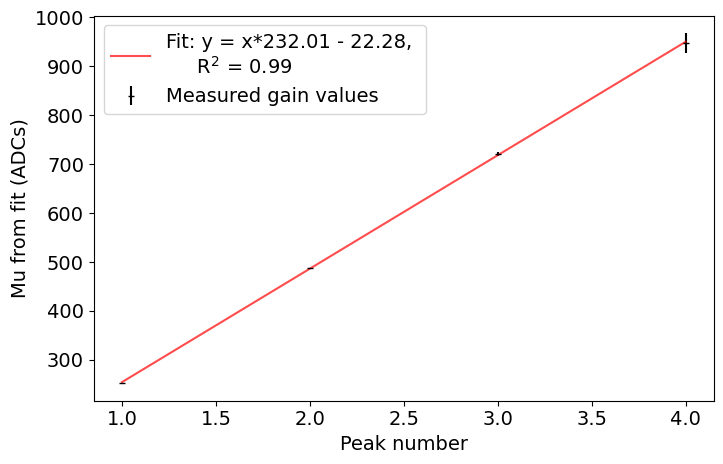

-------------------------------
Channel 8, date = 11_26_2023
-------------------------------


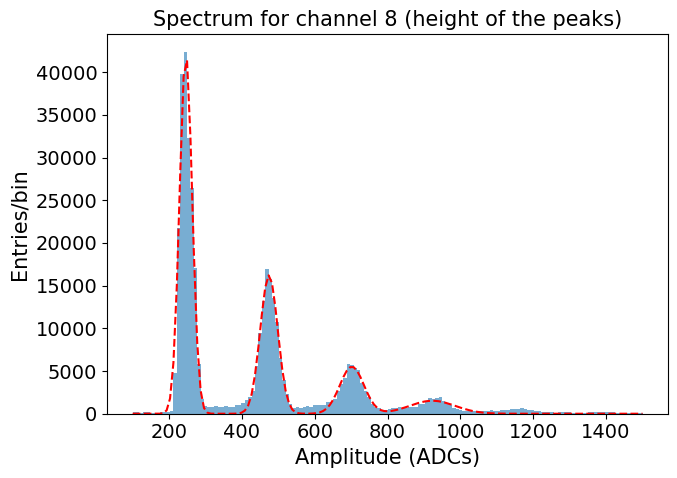

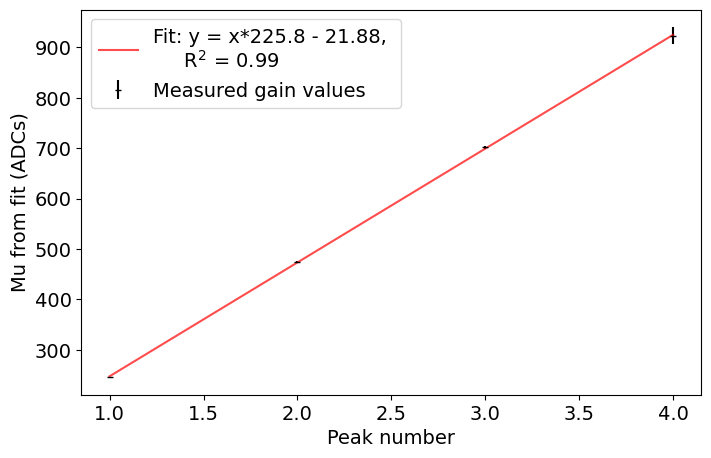

-------------------------------
Channel 0, date = 11_28_2023
-------------------------------


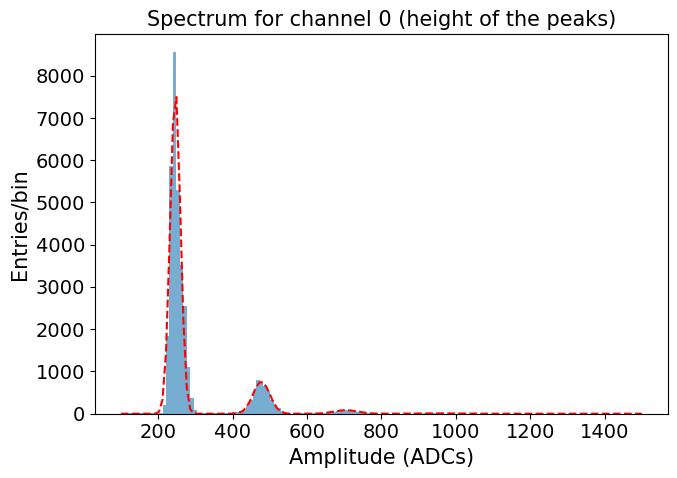

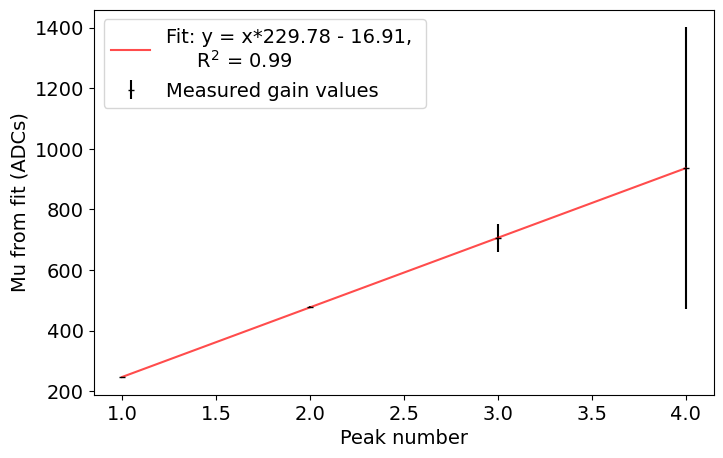

-------------------------------
Channel 1, date = 11_28_2023
-------------------------------


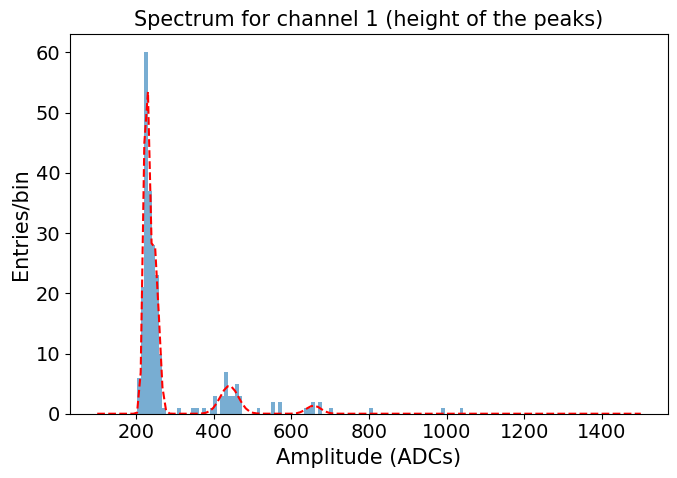

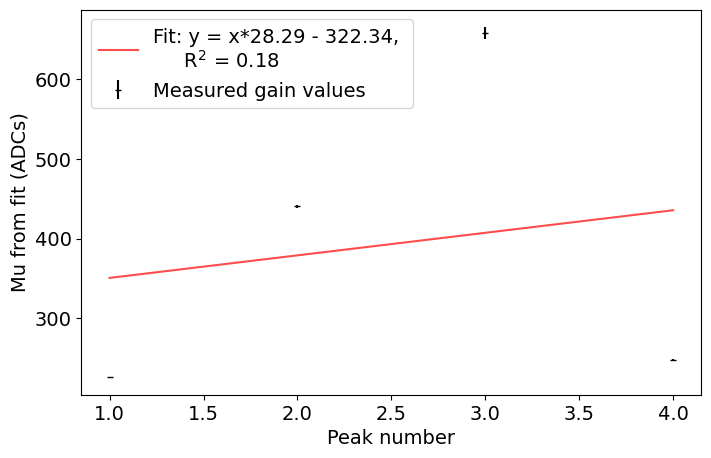

-------------------------------
Channel 2, date = 11_28_2023
-------------------------------


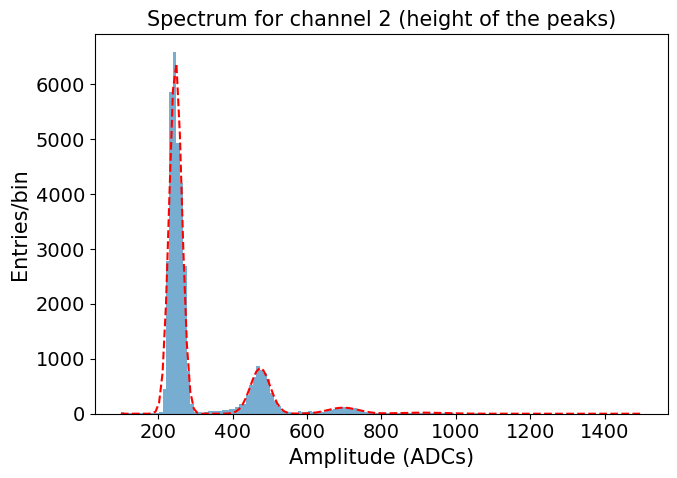

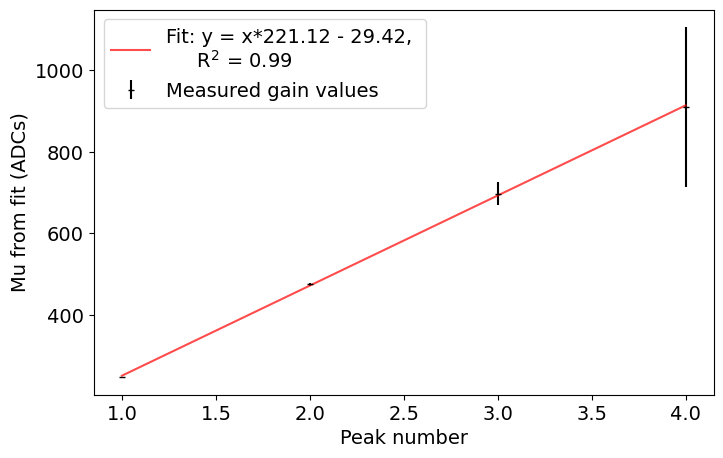

-------------------------------
Channel 3, date = 11_28_2023
-------------------------------


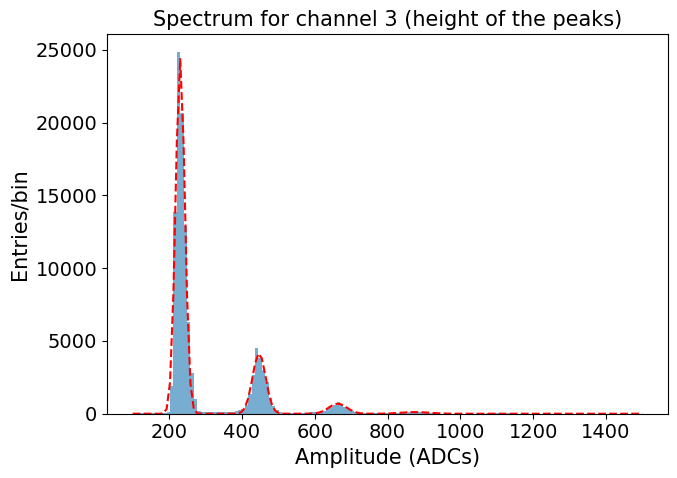

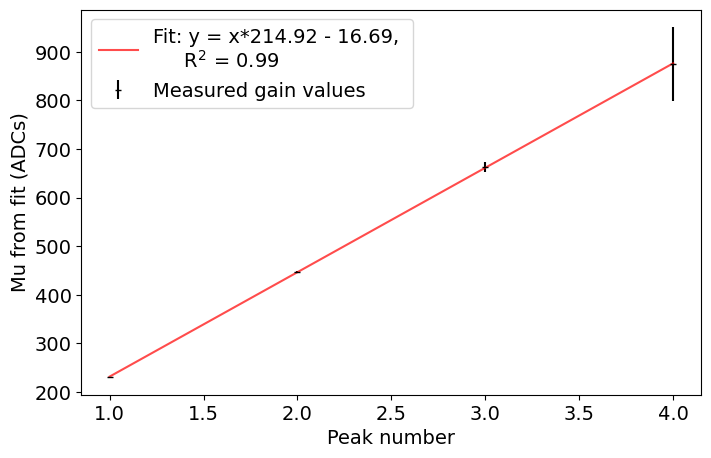

-------------------------------
Channel 4, date = 11_28_2023
-------------------------------


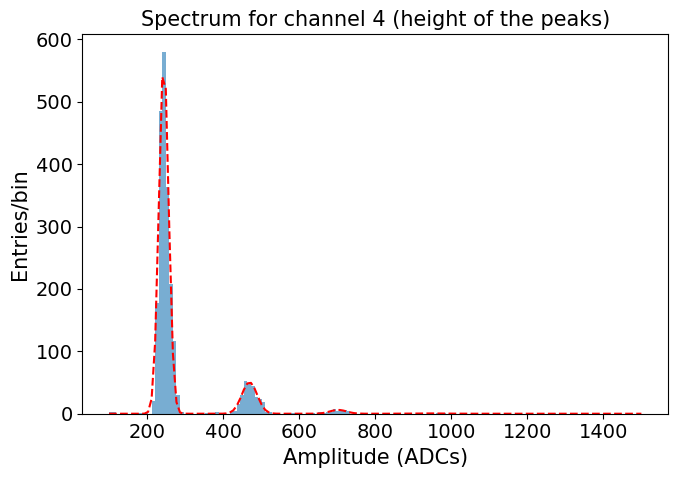

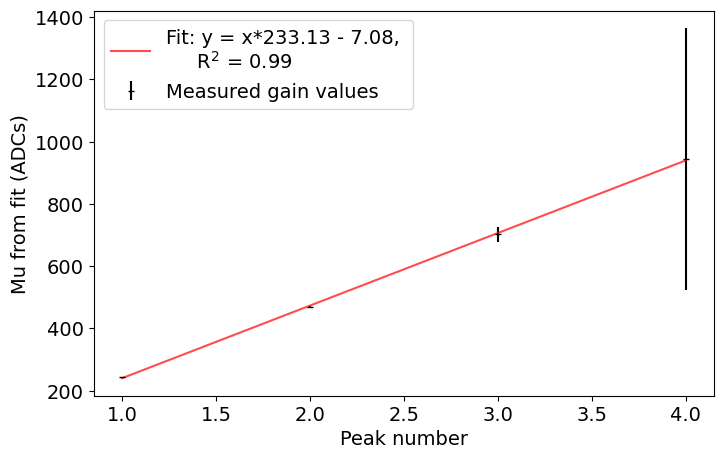

-------------------------------
Channel 5, date = 11_28_2023
-------------------------------


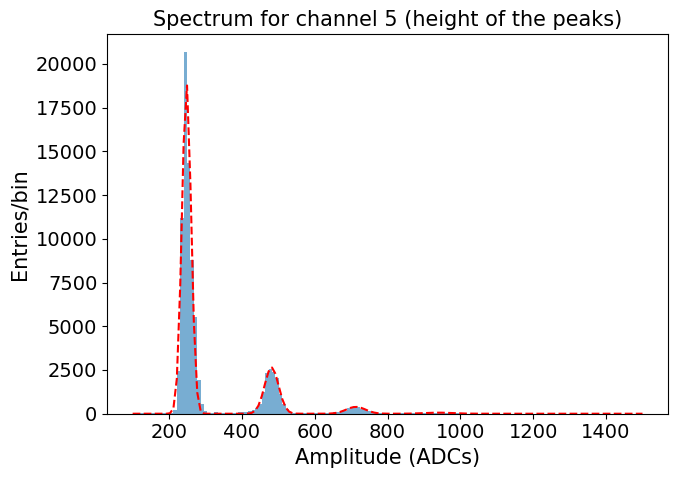

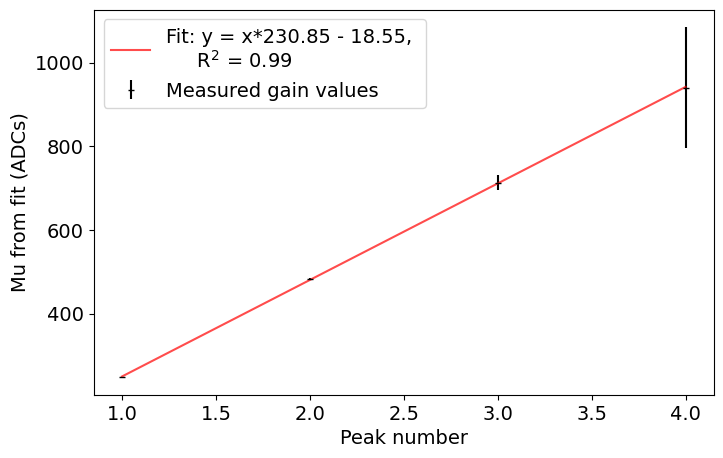

-------------------------------
Channel 6, date = 11_28_2023
-------------------------------


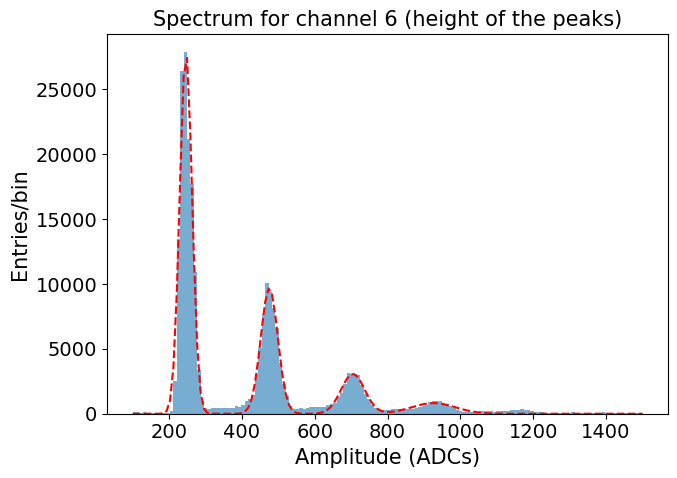

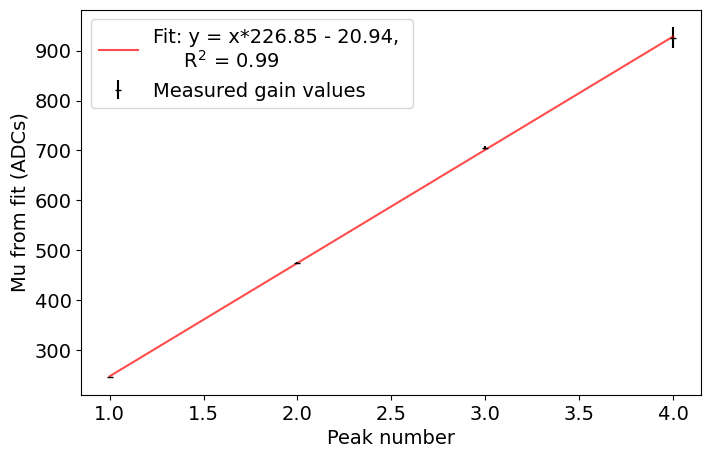

-------------------------------
Channel 7, date = 11_28_2023
-------------------------------


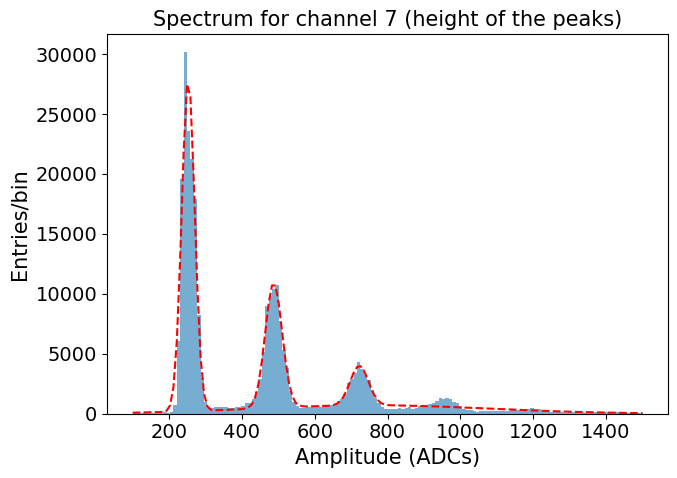

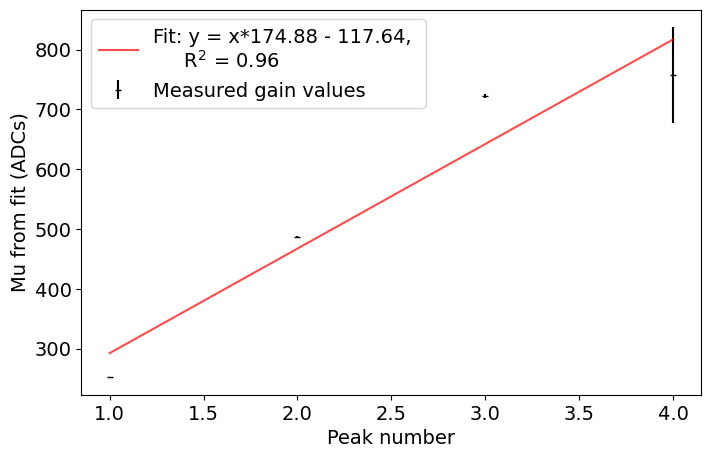

-------------------------------
Channel 8, date = 11_28_2023
-------------------------------


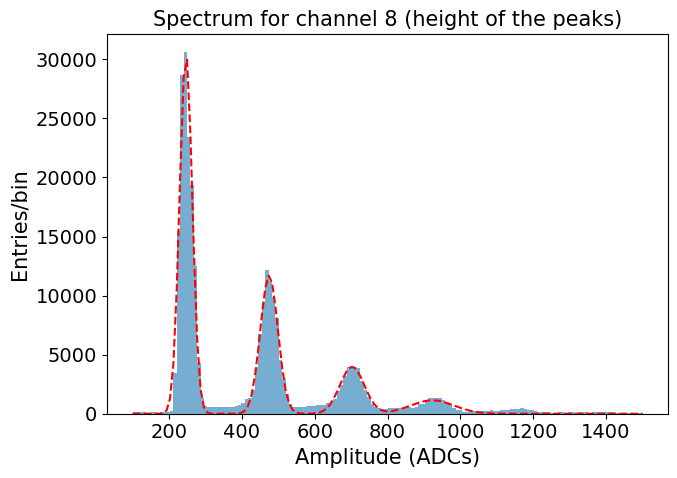

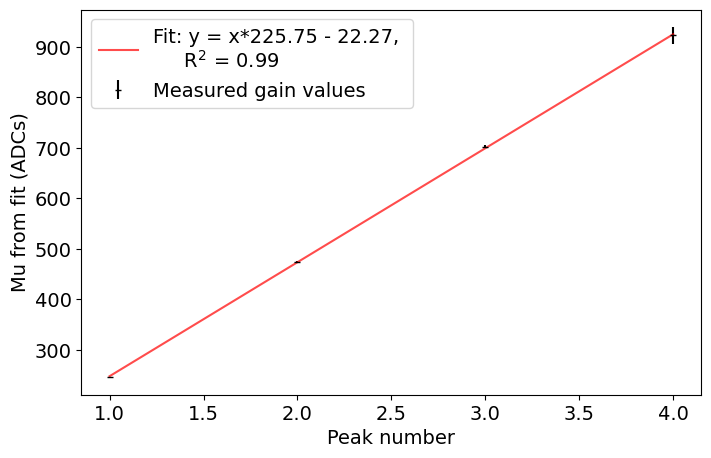

-------------------------------
Channel 0, date = 11_29_2023
-------------------------------


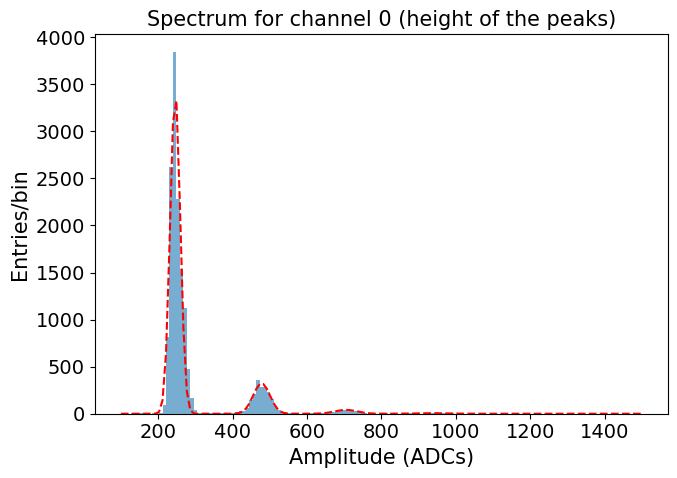

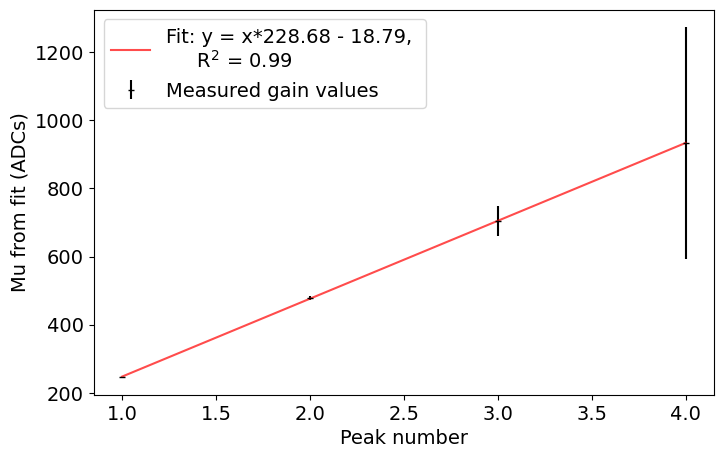

-------------------------------
Channel 1, date = 11_29_2023
-------------------------------


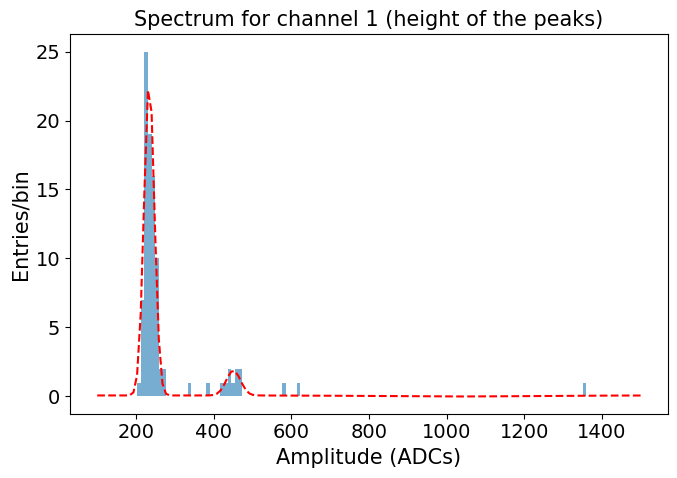

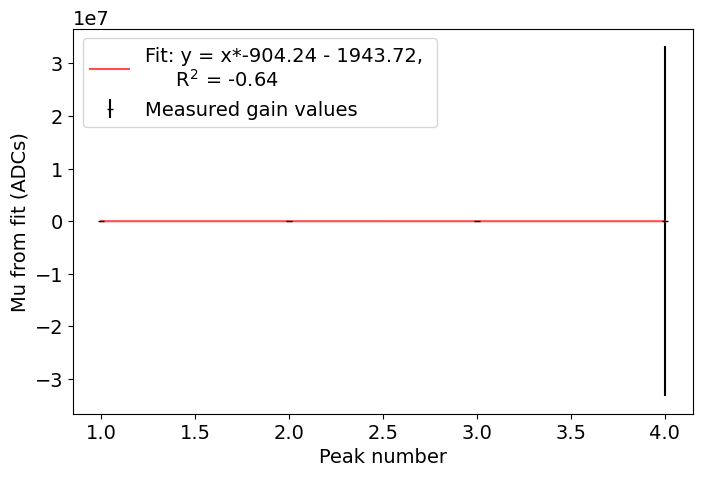

-------------------------------
Channel 2, date = 11_29_2023
-------------------------------


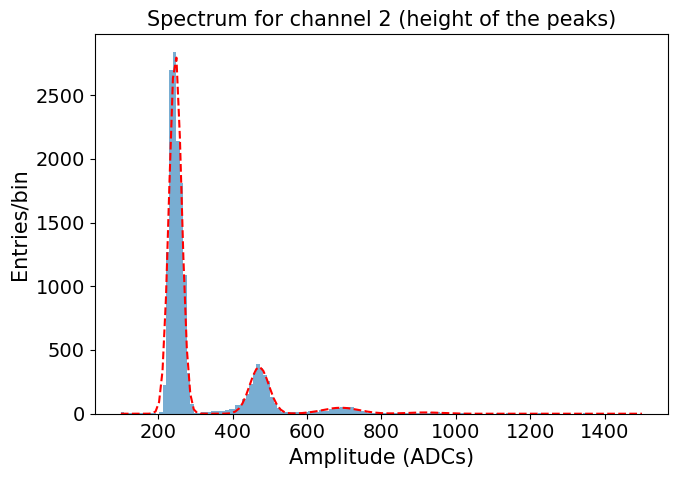

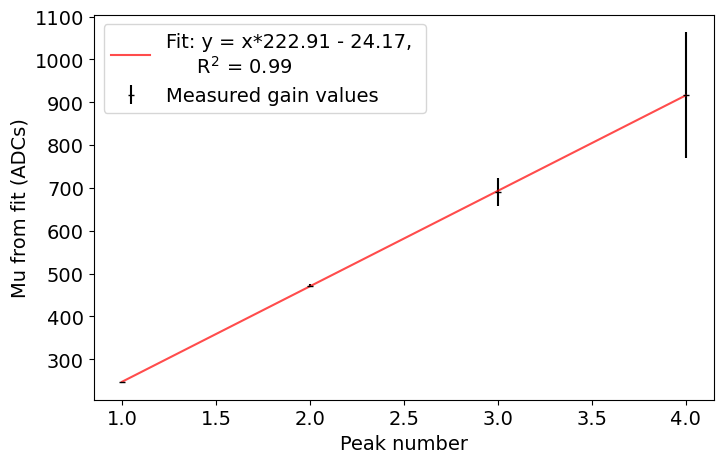

-------------------------------
Channel 3, date = 11_29_2023
-------------------------------


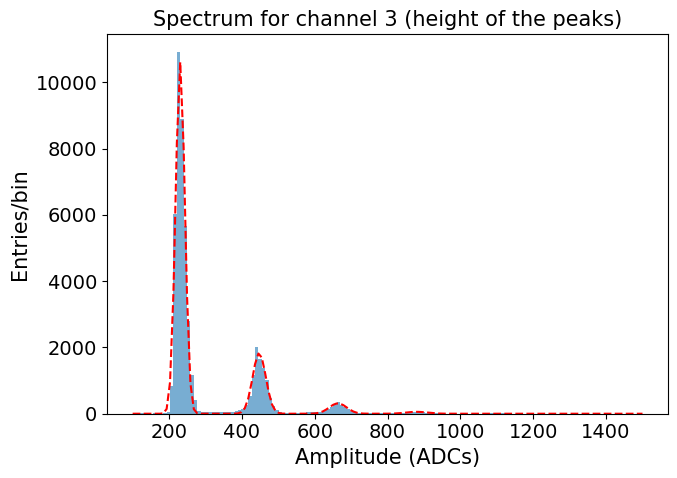

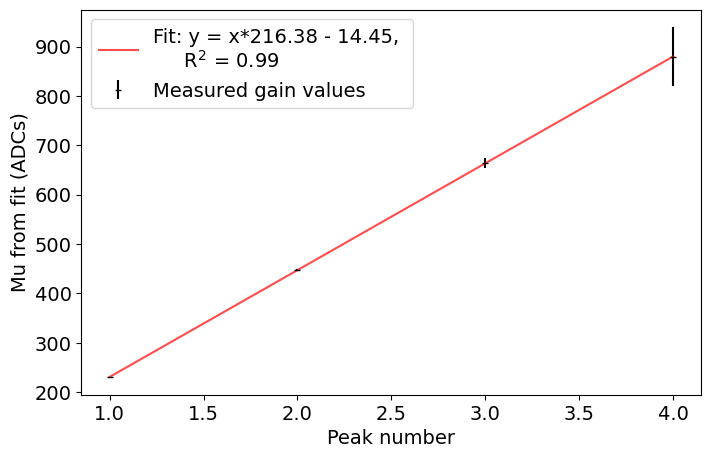

-------------------------------
Channel 4, date = 11_29_2023
-------------------------------


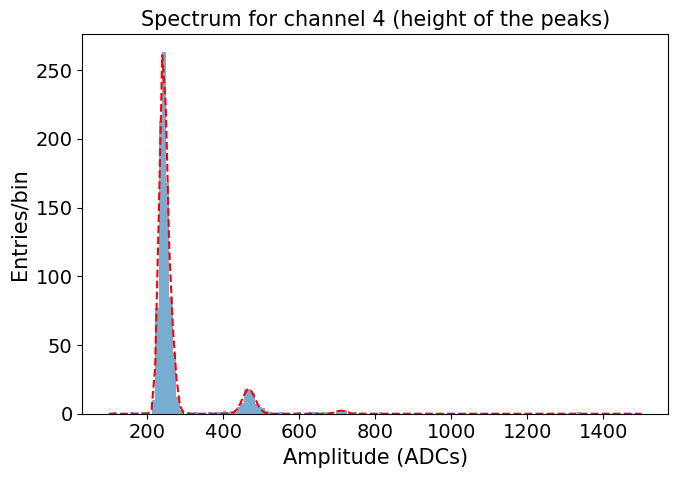

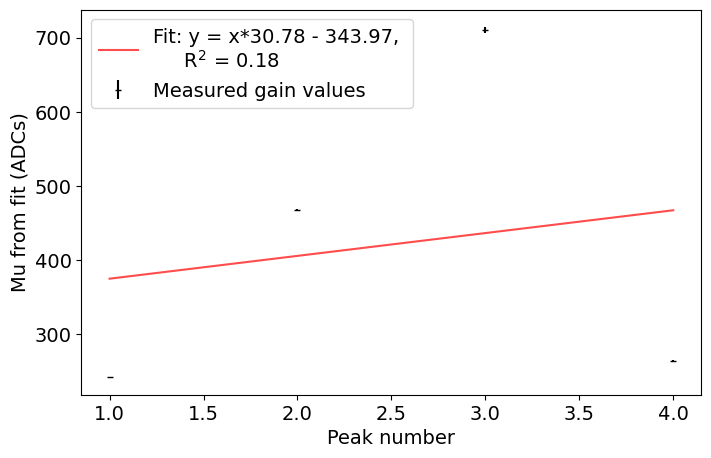

-------------------------------
Channel 5, date = 11_29_2023
-------------------------------


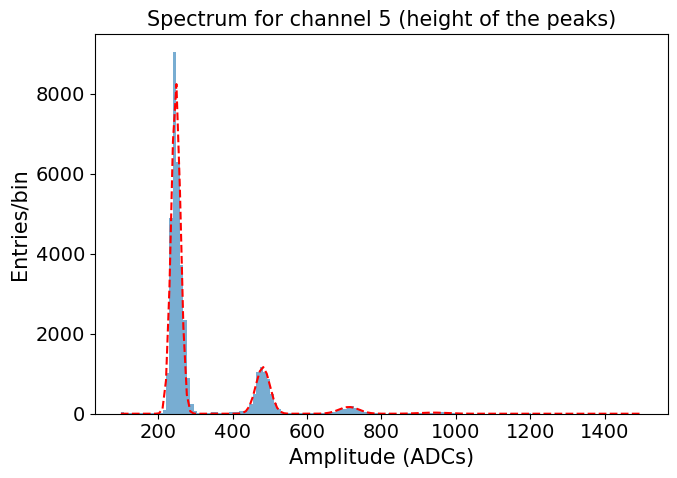

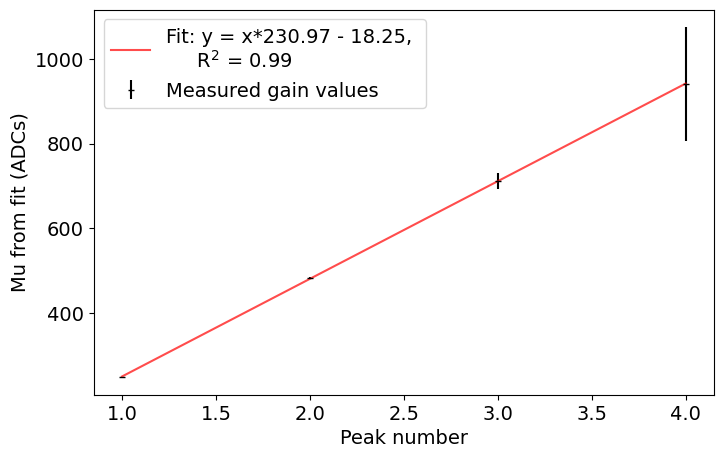

-------------------------------
Channel 6, date = 11_29_2023
-------------------------------


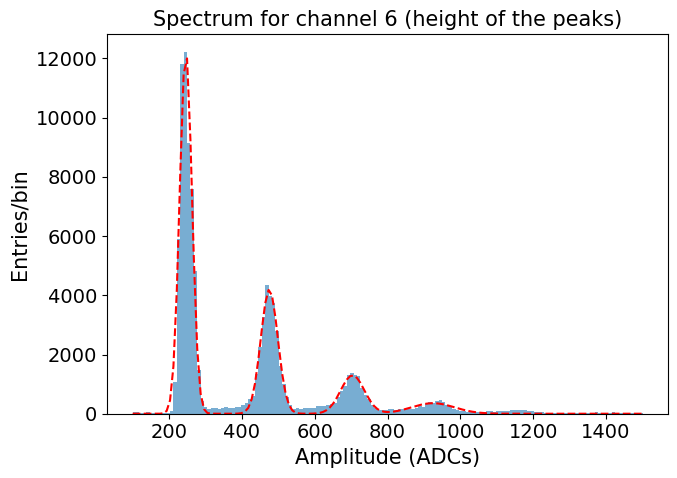

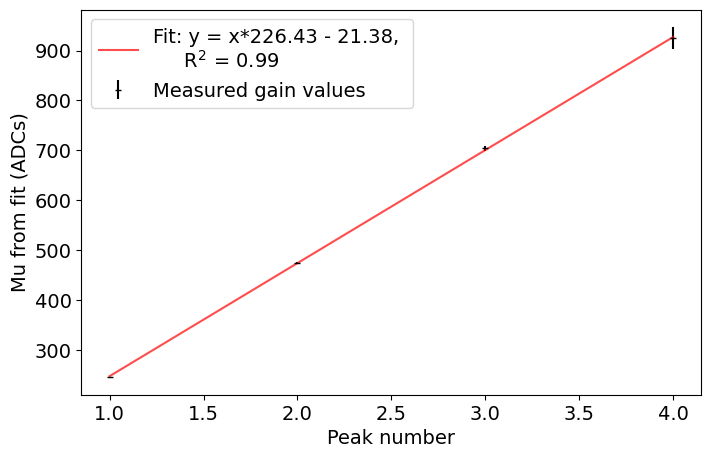

-------------------------------
Channel 7, date = 11_29_2023
-------------------------------


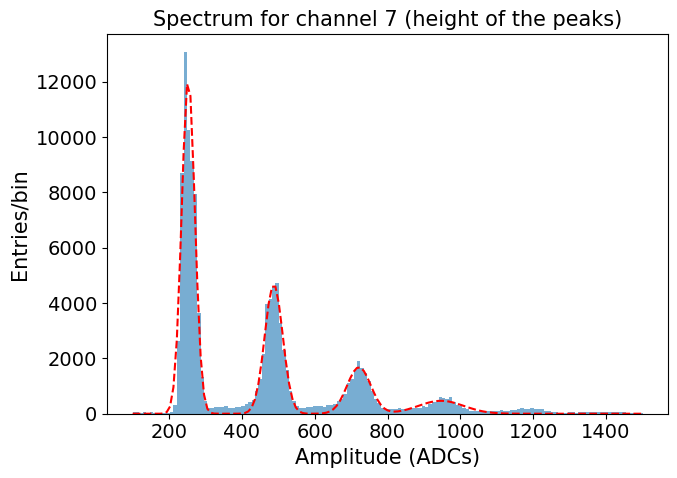

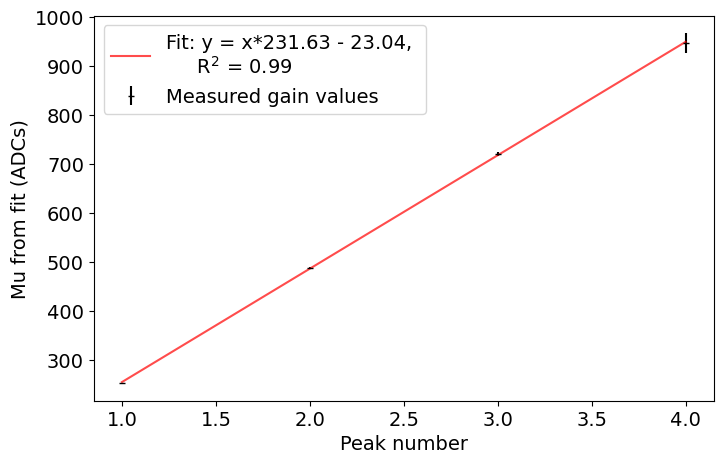

-------------------------------
Channel 8, date = 11_29_2023
-------------------------------


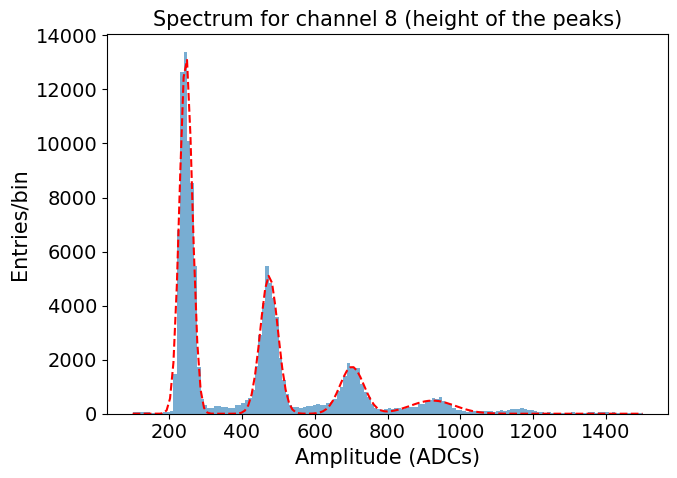

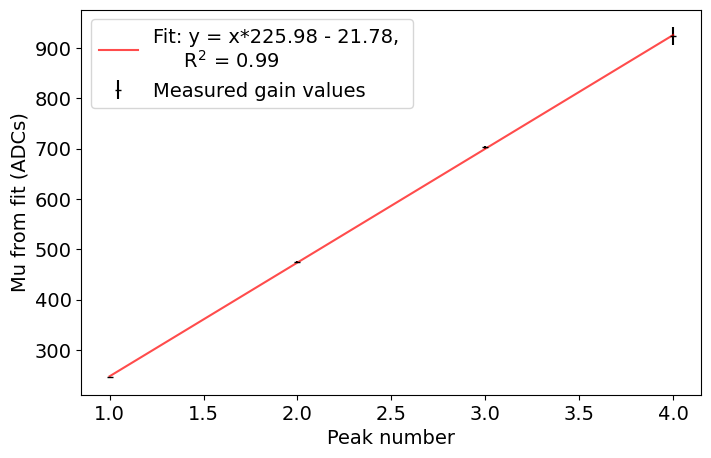

-------------------------------
Channel 0, date = 11_30_2023
-------------------------------


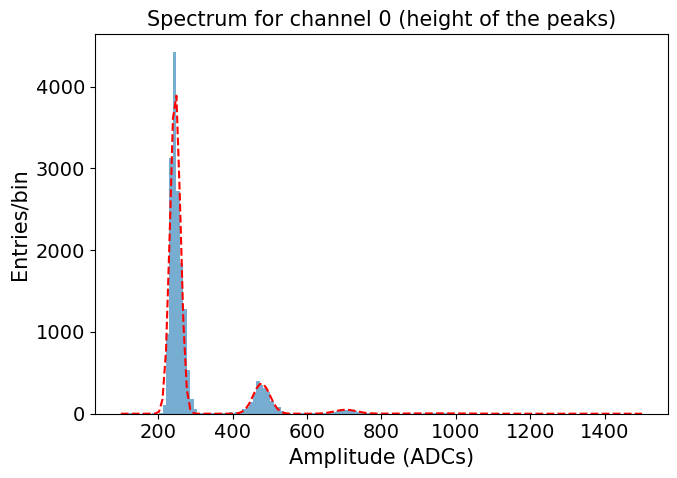

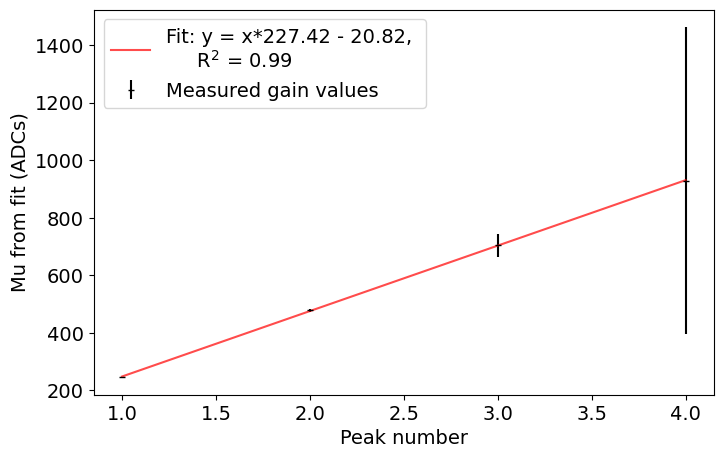

-------------------------------
Channel 1, date = 11_30_2023
-------------------------------


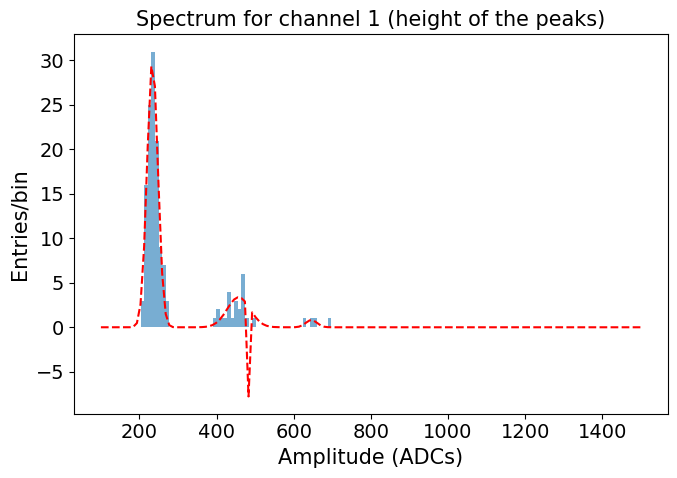

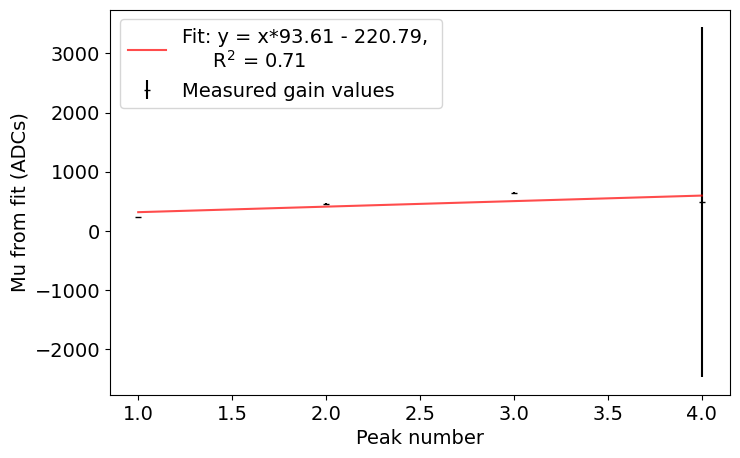

-------------------------------
Channel 2, date = 11_30_2023
-------------------------------


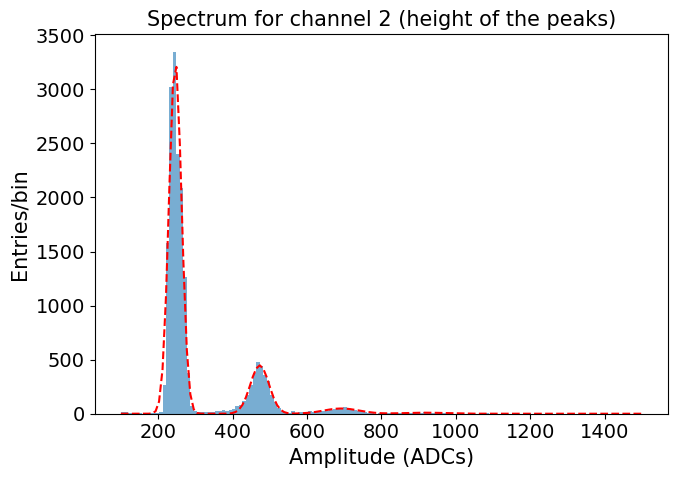

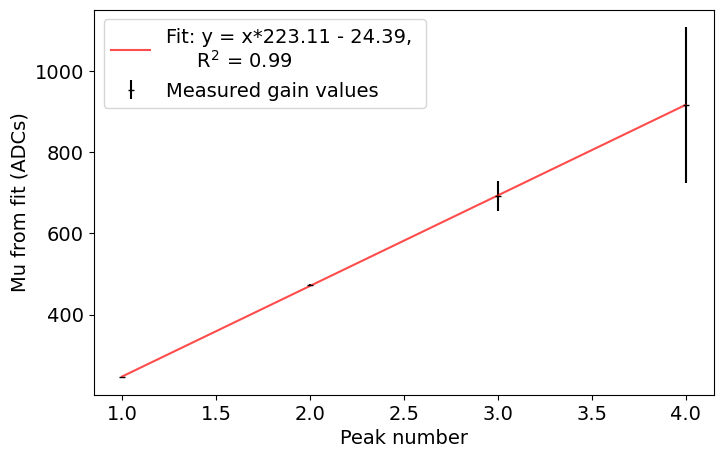

-------------------------------
Channel 3, date = 11_30_2023
-------------------------------


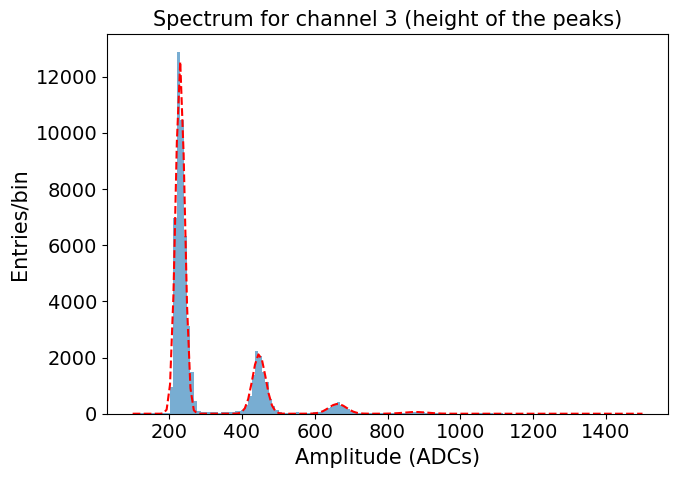

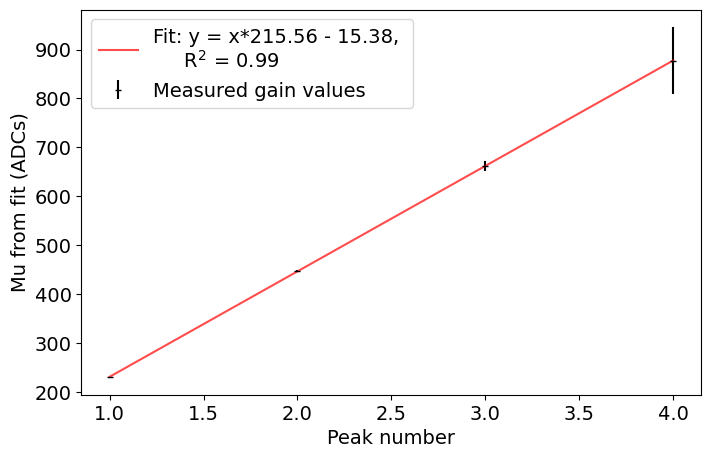

-------------------------------
Channel 4, date = 11_30_2023
-------------------------------


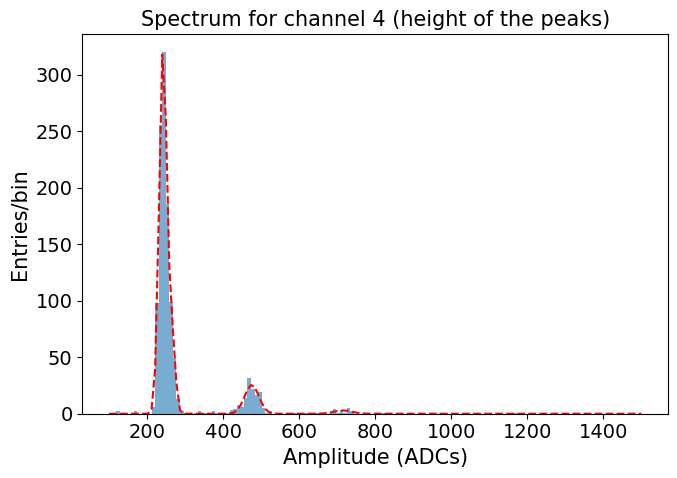

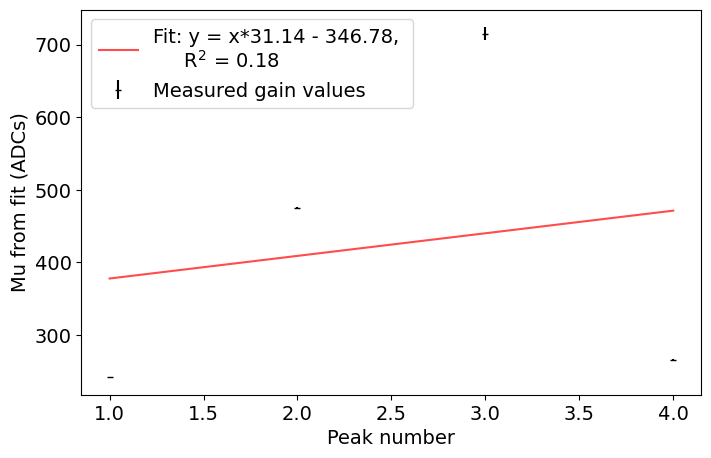

-------------------------------
Channel 5, date = 11_30_2023
-------------------------------


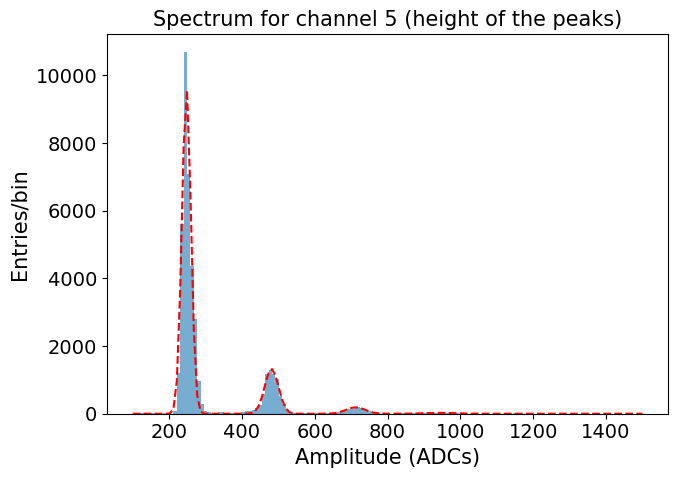

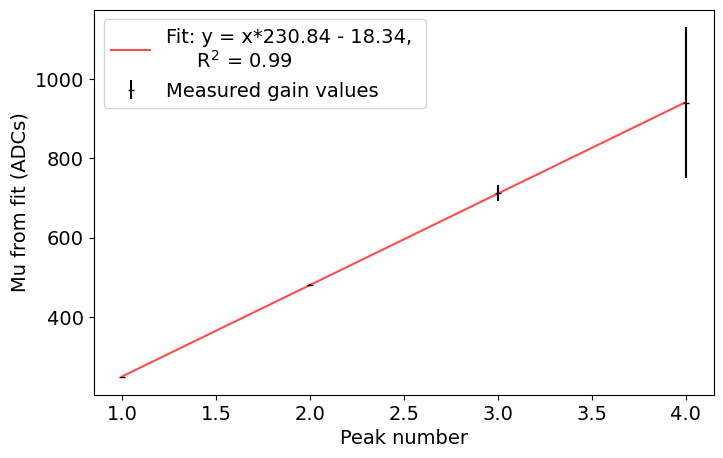

-------------------------------
Channel 6, date = 11_30_2023
-------------------------------


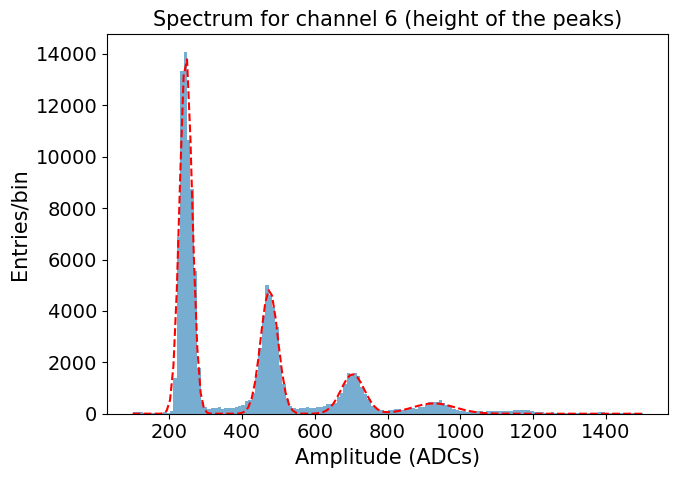

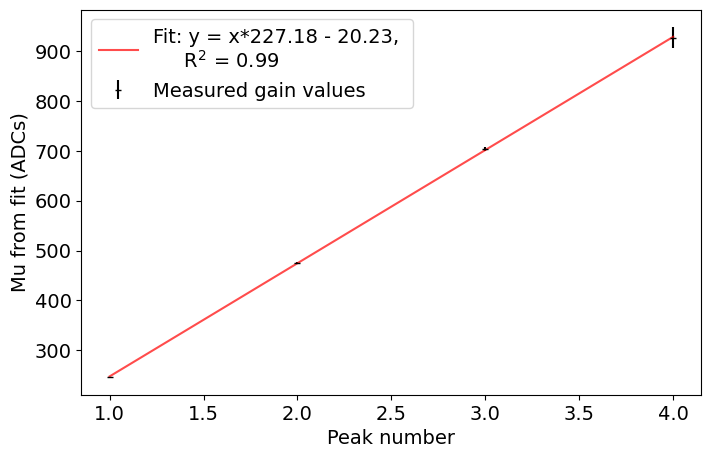

-------------------------------
Channel 7, date = 11_30_2023
-------------------------------


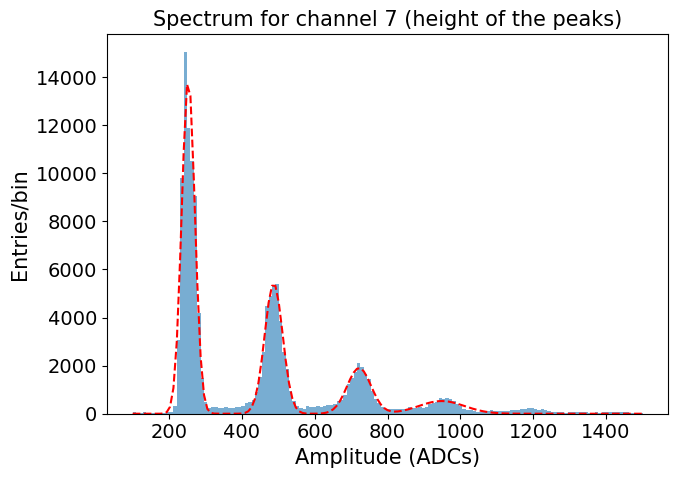

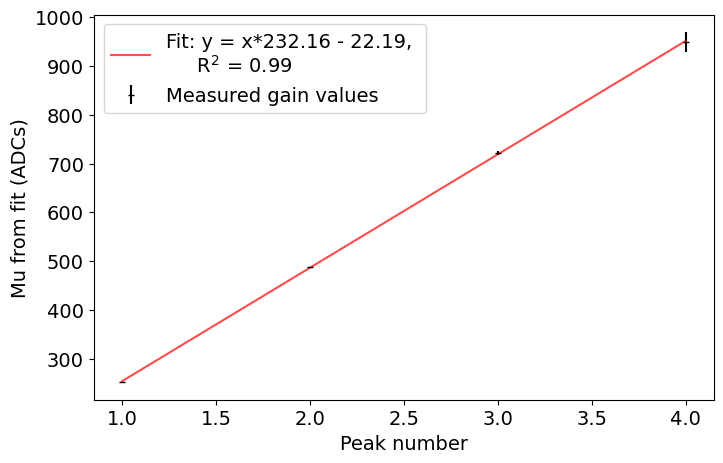

-------------------------------
Channel 8, date = 11_30_2023
-------------------------------


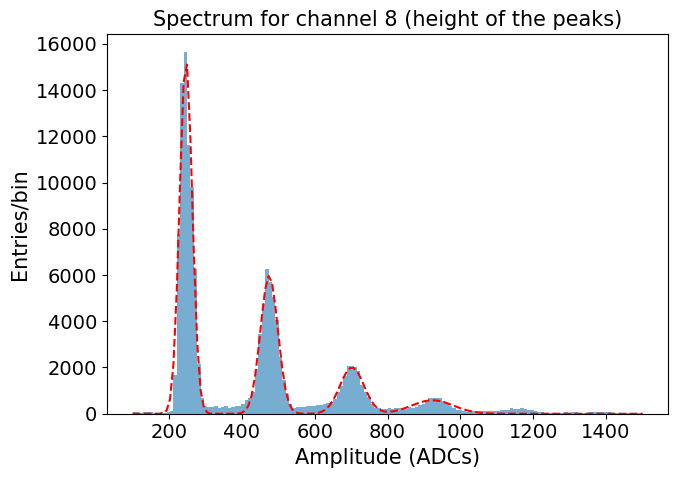

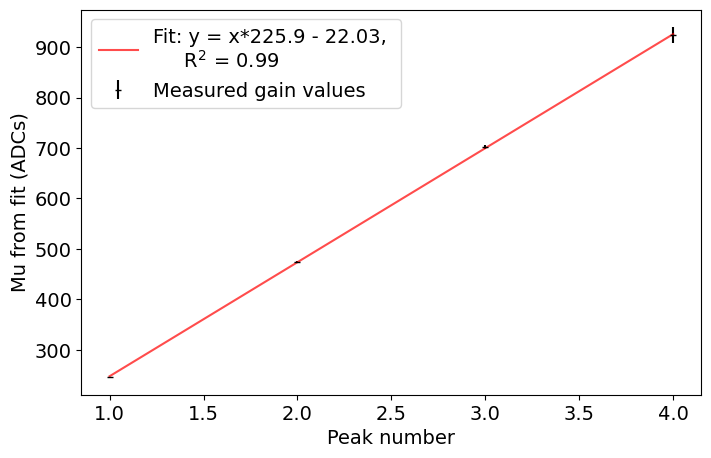

In [16]:
all_slopes = {}
for date in peak_heights.keys():
    slope_ch = []
    for k in range(9):
        try:
            print('-------------------------------')
            print(f'Channel {k}, date = {date}')
            print('-------------------------------')
            slope = fit_spectrum_and_plot(peak_heights[date][k], channel=k, initial_guess=initial_guess_ch[k])
            slope_ch.append(slope)
        except RuntimeError:
            slope_ch.append(0)
            continue
            
    all_slopes[date] = np.array(slope_ch)

In [17]:
all_slopes

{'11_20_2023': array([226.00663934, 206.7871513 , 221.07788724, 211.56947489,
        224.78729245, 227.41737901, 221.73063328, 226.28395664,
        220.30802631]),
 '11_21_2023': array([230.97569395, 225.15585498, 223.36360719, 215.21141872,
        220.49460324, 231.17601976, 227.217805  ,   0.        ,
        226.0781069 ]),
 '11_23_2023': array([230.32034941, 214.17800893, 221.06783585, 215.24951288,
        225.07826745, 230.73166673, 226.76031137, 231.94334623,
        225.98505799]),
 '11_24_2023': array([227.05100563, 219.72911985, 220.79585546, 215.74338185,
         29.52459434, 230.87567871, 227.01821184, 116.57874509,
        225.58343576]),
 '11_25_2023': array([230.71072546, -13.2945049 , 221.98183312, 215.2593647 ,
         29.84537099, 231.33320398, 226.91685095, 201.73206305,
        226.05064955]),
 '11_26_2023': array([228.27384626, 259.37445462, 222.9752576 , 215.76266783,
        229.66290754, 230.62339484, 226.95605248, 232.0107658 ,
        225.80356709]),
 '11

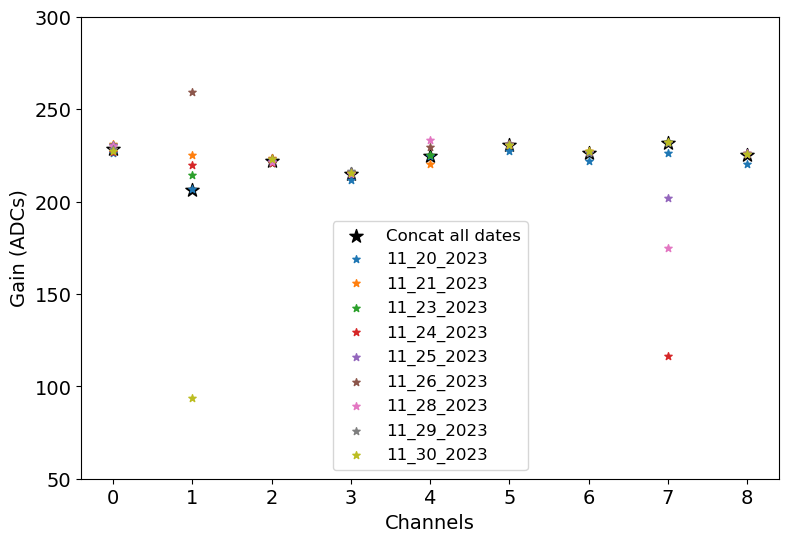

In [18]:
plt.scatter(range(9), slopes_all_dates, marker='*', s=100, color='k', label='Concat all dates')
for date in all_slopes.keys():
    plt.scatter(range(9), all_slopes[date], marker='*', s=30, label=f'{date}')
plt.ylim(50, 300)
plt.xlabel('Channels')
plt.ylabel('Gain (ADCs)')
plt.legend(fontsize=12)
plt.show()

In [59]:
slopes_all_dates

[228.60604565191687,
 206.34311805972095,
 221.9751025687914,
 215.06932276978736,
 224.8076710540091,
 230.50097040107894,
 226.52495525686777,
 231.59231748969287,
 225.42814952613816]

In [19]:
gains_dark_box_vb55 = np.array([134.57801821, 133.68639542, 136.39412143, 138.11533159,
                                140.29249586, 136.46477923, 131.27390486, 127.56319275,
                                130.72306411, 139.4783214 , 142.0017588 , 165.5407446])
gains_dark_box_vb56 = np.array([174.03107833, 172.96599152, 176.42412688, 179.54566931,
                                179.21006561, 179.21814564, 177.77043258, 166.97475842,
                                173.60047227, 184.8525647 , 181.81694524, 186.04528817])
gains_BACoN = slopes_all_dates

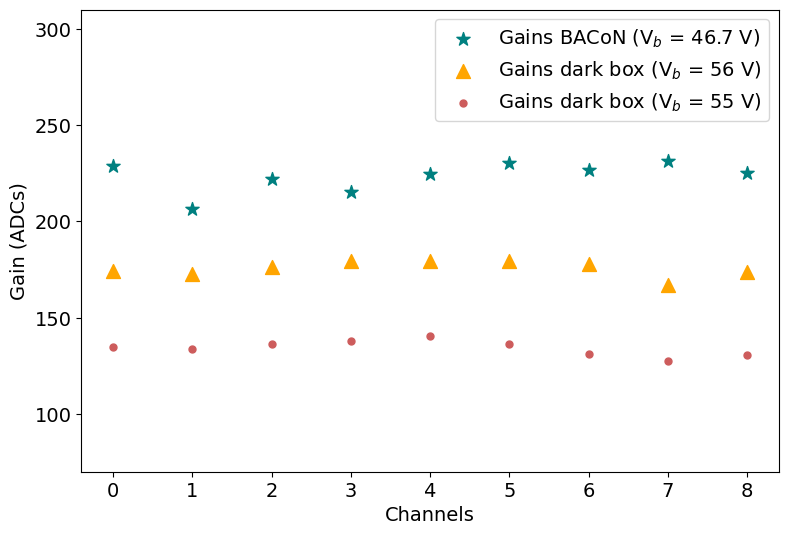

In [20]:
plt.scatter(range(9), gains_BACoN,             marker='*', s=100, label='Gains BACoN (V$_b$ = 46.7 V)' , color='teal')
plt.scatter(range(9), gains_dark_box_vb56[:9], marker='^', s=100, label='Gains dark box (V$_b$ = 56 V)', color='orange')
plt.scatter(range(9), gains_dark_box_vb55[:9], marker='.', s=100, label='Gains dark box (V$_b$ = 55 V)', color='indianred')
plt.ylim(70, 310)
plt.xlabel('Channels')
plt.ylabel('Gain (ADCs)')
plt.legend()
plt.show()

## Trigger SiPMs

In [21]:
evts_path = '/Users/romoluque_c/LEGEND/BACON/data_npz/'

trigger_SiPMs = [9, 10, 11]

peak_heights_trigger_SiPMs = {}

pos_date1 = 56
pos_date2 = 66

def get_date(filename):
    date_str = filename[pos_date1:pos_date2]
    date = datetime.strptime(date_str, '%m_%d_%Y')
    return date

files        = os.listdir(evts_path)
filt_files   = [file for file in files if file.startswith("BACoN_sig_processing_cal_using_height_trigger")]
sorted_files = sorted(filt_files, key=get_date)

for filename in sorted_files:
    my_file = evts_path+filename
    d = np.load(my_file, allow_pickle=True)
    
    date = filename[pos_date1:pos_date2]
    
    try:
        if date not in peak_heights_trigger_SiPMs:
            peak_heights_ch = [np.array([]) for _ in range(len(trigger_SiPMs))]
    
        for i, channel in enumerate(trigger_SiPMs):
            peak_heights_ch[i] = np.concatenate((peak_heights_ch[i], d['peak_height_all_channels'][i][0]))
            
        peak_heights_trigger_SiPMs[date] = np.array(peak_heights_ch, dtype=object)
    except IndexError:
        print(date, len(d['peak_height_all_channels'][i]))
        continue

In [22]:
peak_heights_trigger_SiPMs;

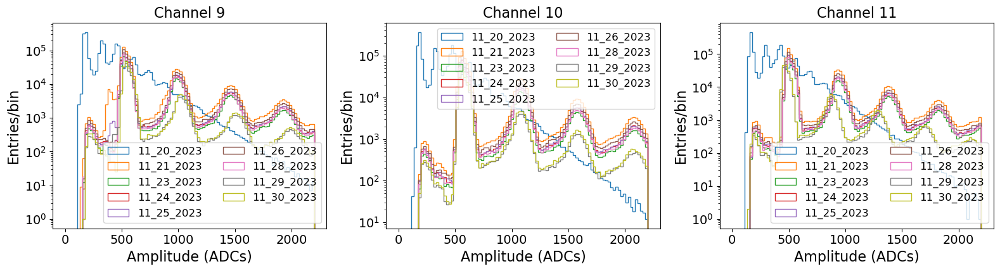

In [23]:
fig, axs = plt.subplots(1, 3, figsize=(16, 4.5))
for date in peak_heights_trigger_SiPMs.keys():
    for k, ch in enumerate(trigger_SiPMs):
        i = int(k/3)
        j = k%3
        axs[j].hist(peak_heights_trigger_SiPMs[date][k], bins=100, range=(0,2200), log=True, label=f'{date}', histtype='step')
        axs[j].set_xlabel('Amplitude (ADCs)', fontsize=16)
        axs[j].set_ylabel('Entries/bin',      fontsize=16)
        axs[j].set_title(f"Channel {ch}",      fontsize=16)
        axs[j].legend(fontsize=12, ncol=2)
plt.tight_layout()
plt.show()

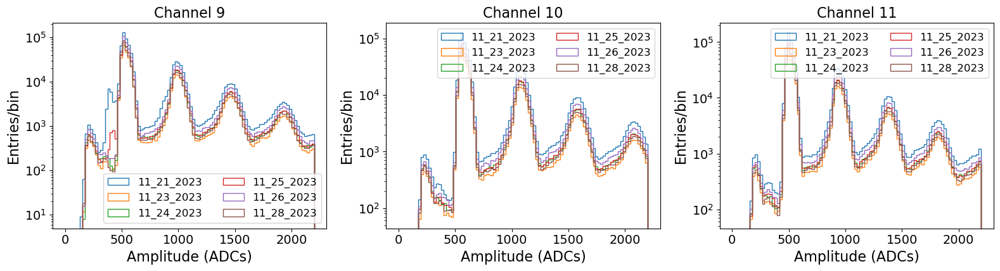

In [24]:
fig, axs = plt.subplots(1, 3, figsize=(16, 4.5))
for date in peak_heights_trigger_SiPMs.keys():
    if date in ['11_20_2023', '11_29_2023', '11_30_2023']:
        continue
    for k, ch in enumerate(trigger_SiPMs):
        i = int(k/3)
        j = k%3
        axs[j].hist(peak_heights_trigger_SiPMs[date][k], bins=100, range=(0,2200), log=True, label=f'{date}', histtype='step')
        axs[j].set_xlabel('Amplitude (ADCs)', fontsize=16)
        axs[j].set_ylabel('Entries/bin',      fontsize=16)
        axs[j].set_title(f"Channel {ch}",      fontsize=16)
        axs[j].legend(fontsize=12, ncol=2)
plt.tight_layout()
plt.show()

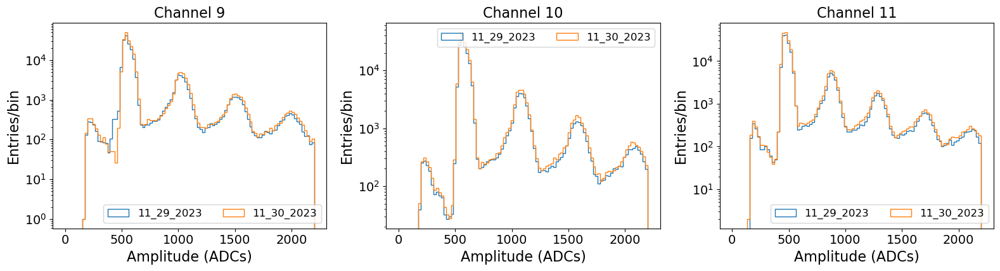

In [25]:
fig, axs = plt.subplots(1, 3, figsize=(16, 4.5))
for date in peak_heights_trigger_SiPMs.keys():
    if date in ['11_29_2023', '11_30_2023']:
        for k, ch in enumerate(trigger_SiPMs):
            i = int(k/3)
            j = k%3
            axs[j].hist(peak_heights_trigger_SiPMs[date][k], bins=100, range=(0,2200), log=True, label=f'{date}', histtype='step')
            axs[j].set_xlabel('Amplitude (ADCs)', fontsize=16)
            axs[j].set_ylabel('Entries/bin',      fontsize=16)
            axs[j].set_title(f"Channel {ch}",      fontsize=16)
            axs[j].legend(fontsize=12, ncol=2)
plt.tight_layout()
plt.show()

### Date: 11_20_2023

In [26]:
initial_guess_trigger_ch_46_7_V = { 9: [150000, 180, 20, 70000, 330, 25, 50000, 460, 30, 20000, 600, 40],
                                   10: [125000, 180, 20, 50000, 330, 25, 50000, 475, 30, 20000, 620, 40],
                                   11: [140000, 165, 20, 60000, 300, 25, 60000, 425, 30, 20000, 555, 40]}

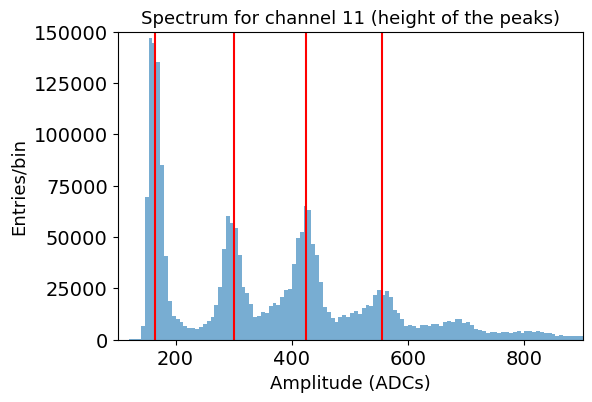

In [27]:
sel_channel = 11
sel_index   = sel_channel - 9
sel_date    = '11_20_2023'
plt.figure(figsize=(6, 4))
y, x, _ = plt.hist(peak_heights_trigger_SiPMs[sel_date][sel_index], bins=120, range=(100,900), log=False, alpha=0.6)
plt.axvline(x=165, color='r')
plt.axvline(x=300, color='r')
plt.axvline(x=425, color='r')
plt.axvline(x=555, color='r')
plt.xlabel('Amplitude (ADCs)',      fontsize=13)
plt.ylabel('Entries/bin',           fontsize=13)
plt.title(f"Spectrum for channel {sel_channel} (height of the peaks)", fontsize=13)
plt.xlim(100, 900)
plt.ylim(0, 150000)
plt.show()

-------------------------------
Channel 0, date = 11_30_2023
-------------------------------


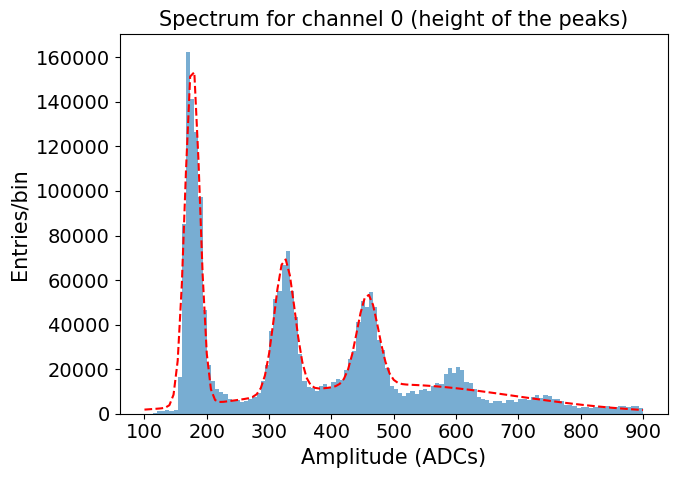

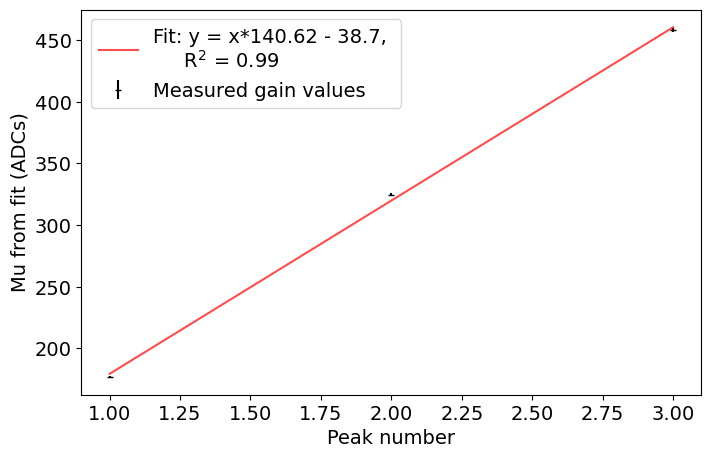

-------------------------------
Channel 1, date = 11_30_2023
-------------------------------


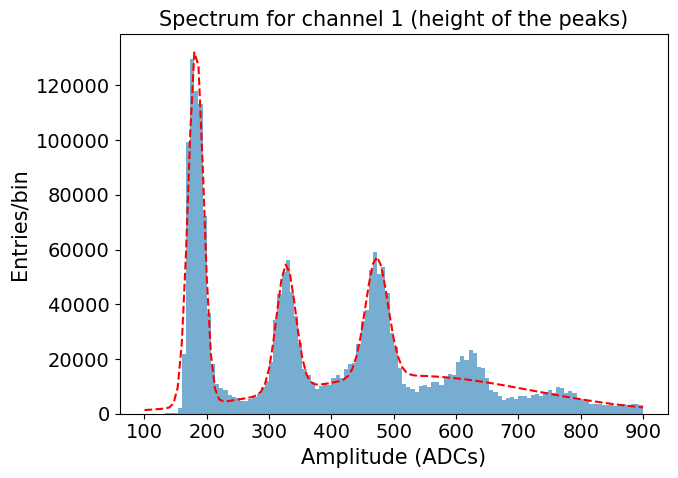

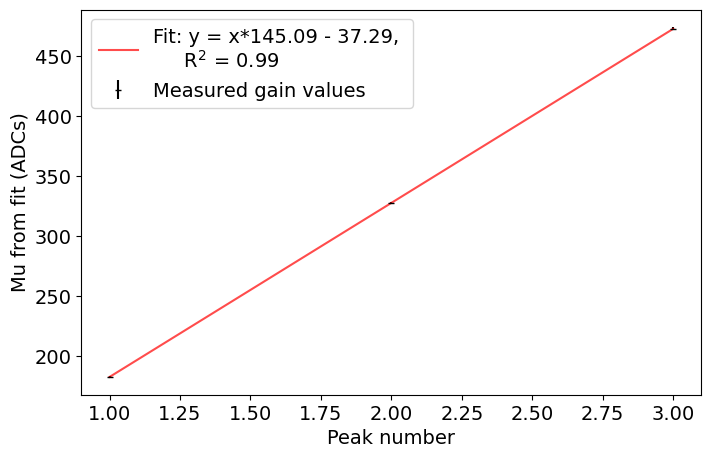

-------------------------------
Channel 2, date = 11_30_2023
-------------------------------


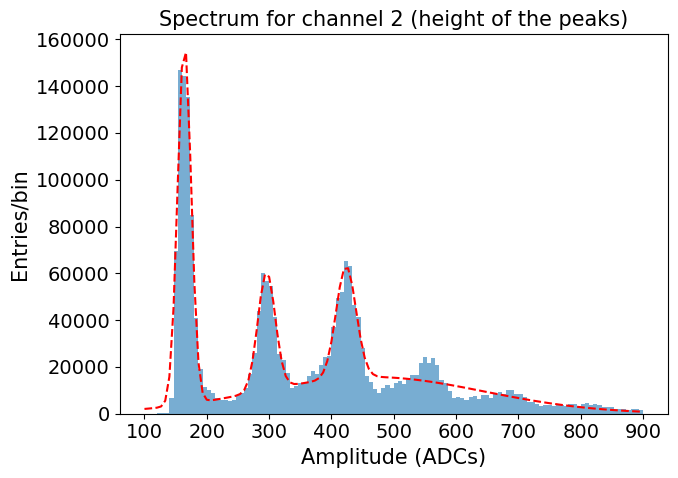

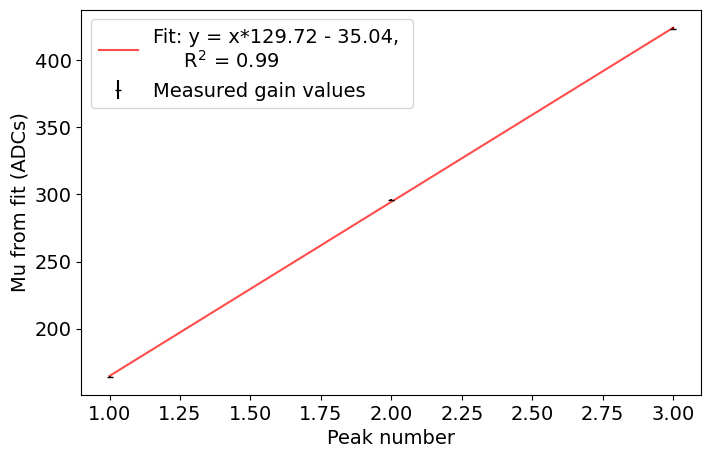

In [28]:
sel_date                 = '11_20_2023'
all_slopes_trigger_SiPMs = {}
slope_ch                 = []
for k in range(3):
    try:
        print('-------------------------------')
        print(f'Channel {k}, date = {date}')
        print('-------------------------------')
        slope = fit_spectrum_and_plot(peak_heights_trigger_SiPMs[sel_date][k], channel=k, initial_guess=initial_guess_trigger_ch_46_7_V[k+9], bins=120, rng=(100,900), num_peaks_fit=3)
        slope_ch.append(slope)
    except RuntimeError:
        slope_ch.append(0)
        continue
        
all_slopes_trigger_SiPMs[sel_date] = np.array(slope_ch)

### Dates: 11_21_2023, 11_23_2023, 11_24_2023, 11_25_2023, 11_26_2023, 11_28_2023

In [29]:
initial_guess_trigger_ch_increase1 = { 9: [130000, 530, 50, 30000, 1000, 60,  9000, 1460, 70, 4000, 1930, 80, 1500, 2400, 80],
                                      10: [120000, 570, 50, 27000, 1080, 60,  9000, 1580, 70, 4000, 2090, 80, 1500, 2600, 80],
                                      11: [130000, 500, 50, 32000,  950, 60, 11000, 1380, 70, 4000, 1820, 80, 1500, 2250, 80]}

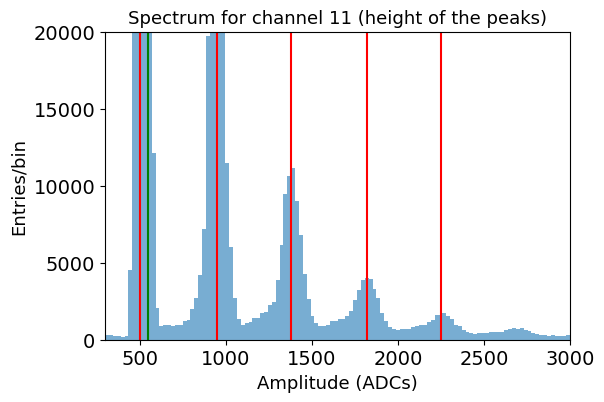

In [30]:
sel_channel = 11
sel_index   = sel_channel - 9
sel_date    = '11_21_2023'
plt.figure(figsize=(6, 4))
y, x, _ = plt.hist(peak_heights_trigger_SiPMs[sel_date][sel_index], bins=120, range=(300,3000), log=False, alpha=0.6)
plt.axvline(x=500, color='r')
plt.axvline(x=550, color='g')
plt.axvline(x=950, color='r')
plt.axvline(x=1380, color='r')
plt.axvline(x=1820, color='r')
plt.axvline(x=2250, color='r')
plt.xlabel('Amplitude (ADCs)',      fontsize=13)
plt.ylabel('Entries/bin',           fontsize=13)
plt.title(f"Spectrum for channel {sel_channel} (height of the peaks)", fontsize=13)
plt.xlim(300, 3000)
plt.ylim(0, 20000)
plt.show()

-------------------------------
Channel 0, date = 11_30_2023
-------------------------------


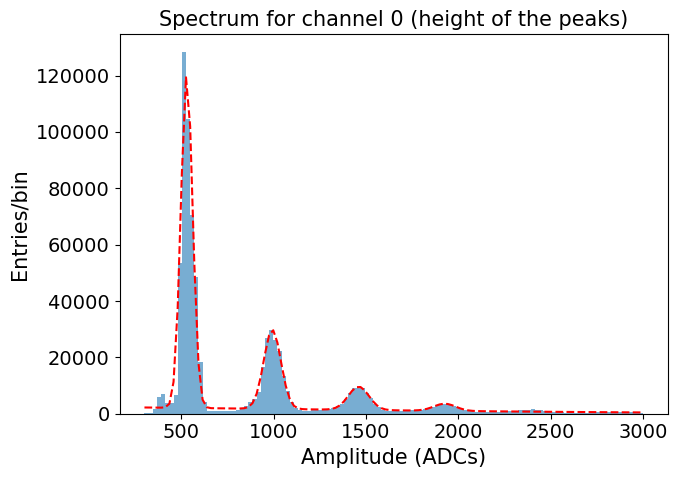

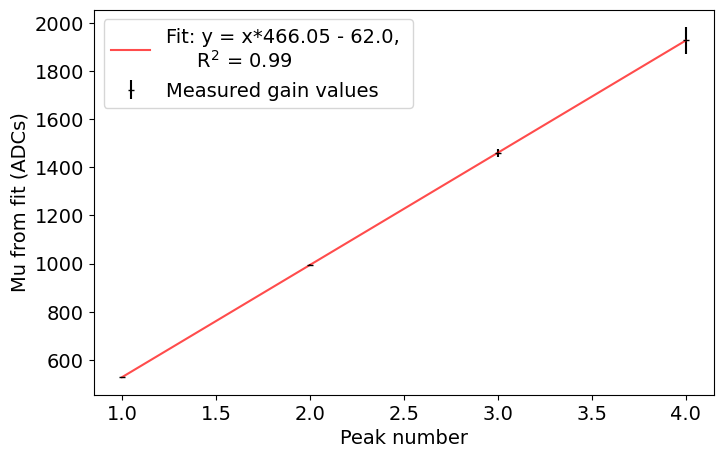

-------------------------------
Channel 1, date = 11_30_2023
-------------------------------


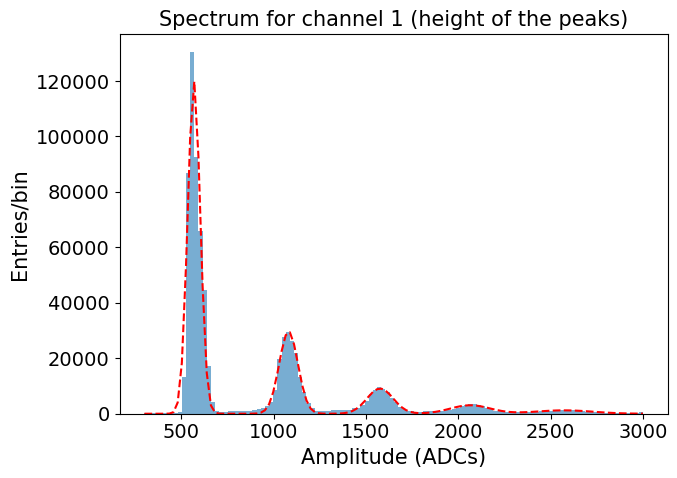

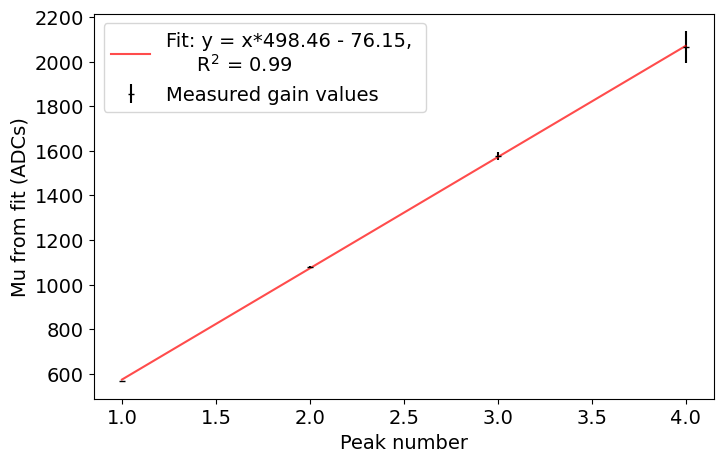

-------------------------------
Channel 2, date = 11_30_2023
-------------------------------


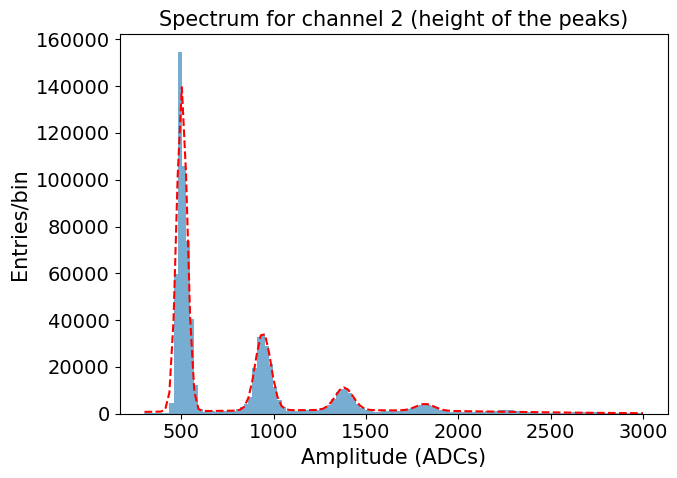

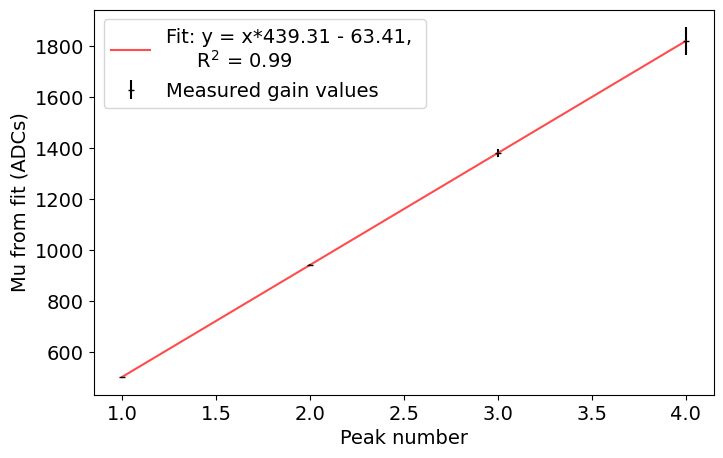

-------------------------------
Channel 0, date = 11_30_2023
-------------------------------


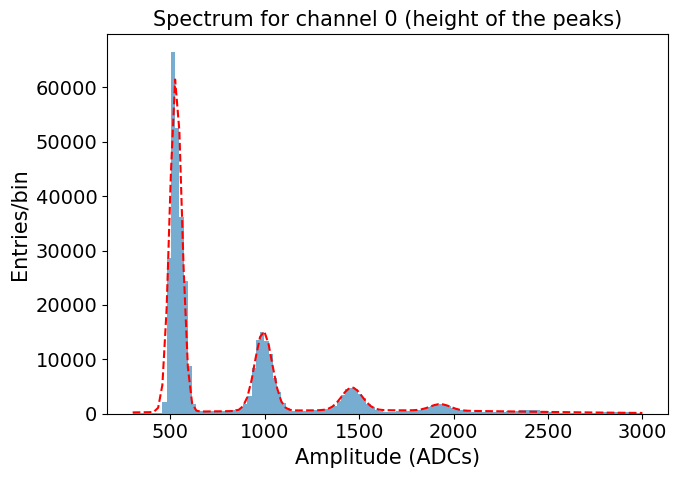

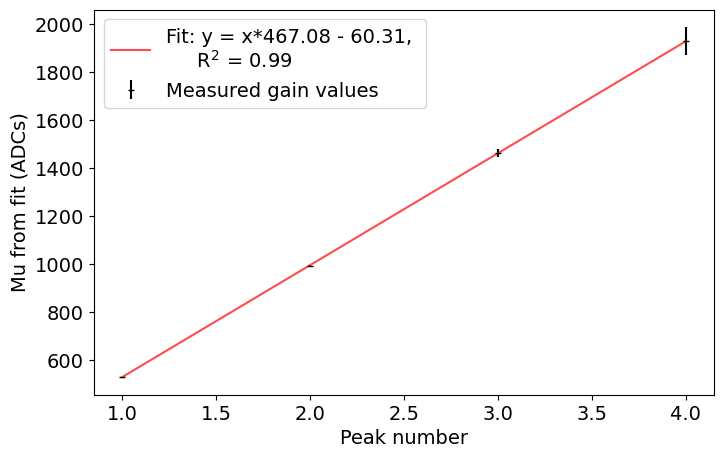

-------------------------------
Channel 1, date = 11_30_2023
-------------------------------


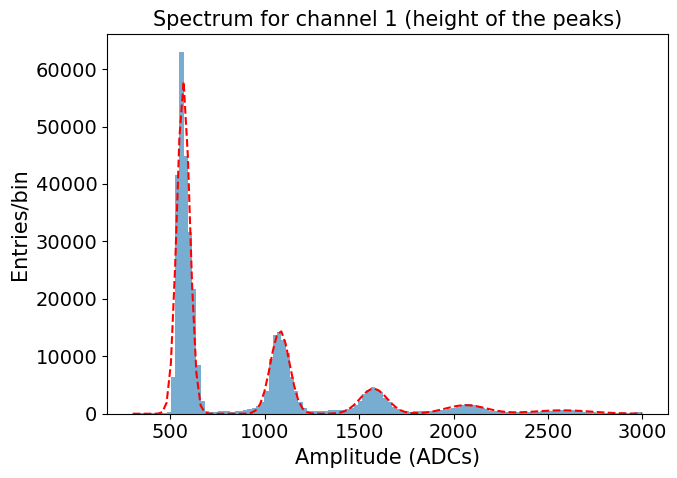

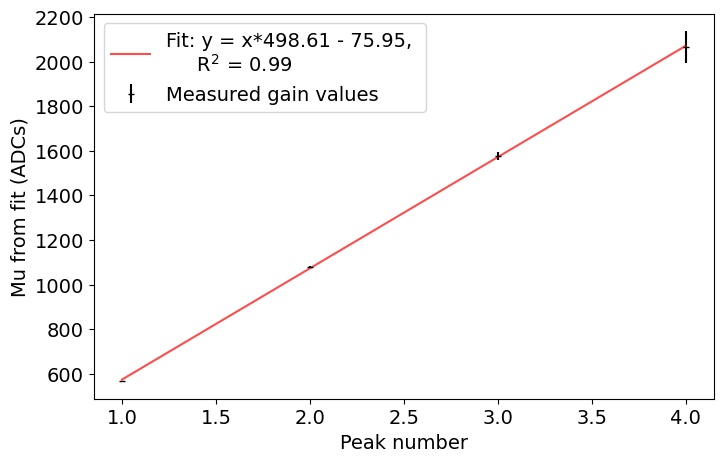

-------------------------------
Channel 2, date = 11_30_2023
-------------------------------


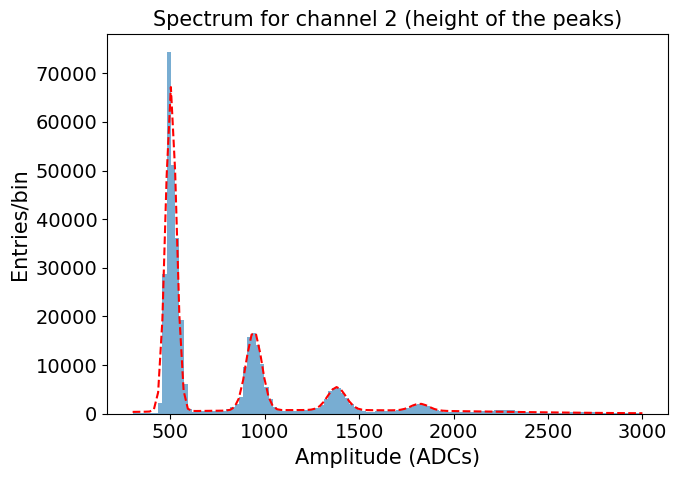

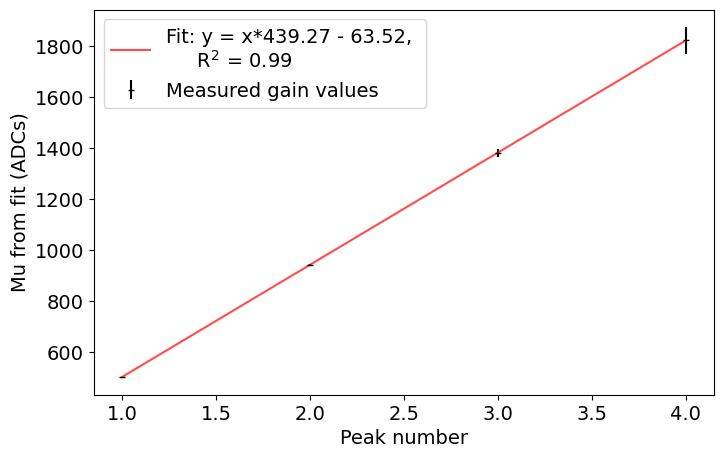

-------------------------------
Channel 0, date = 11_30_2023
-------------------------------


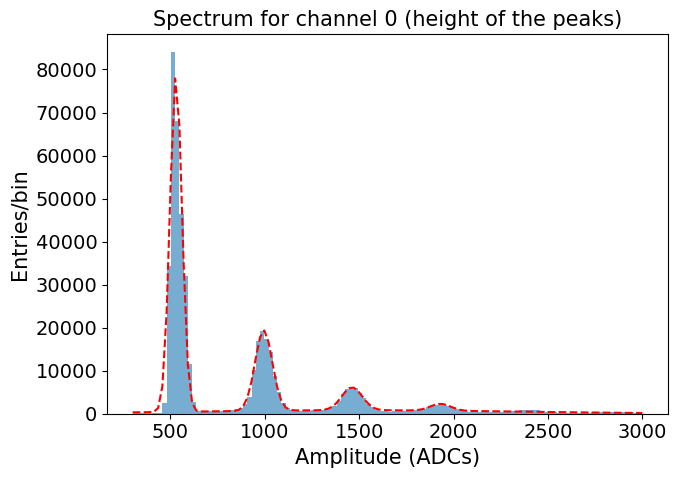

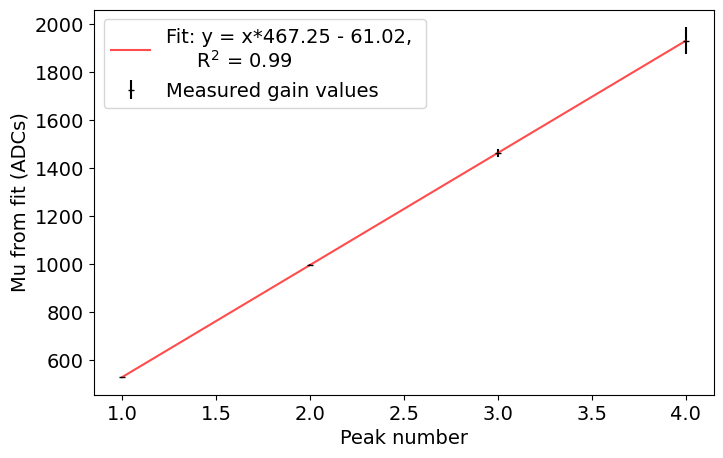

-------------------------------
Channel 1, date = 11_30_2023
-------------------------------


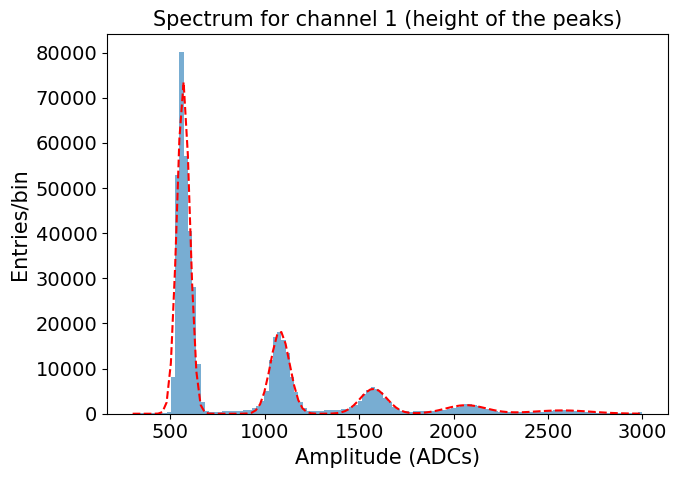

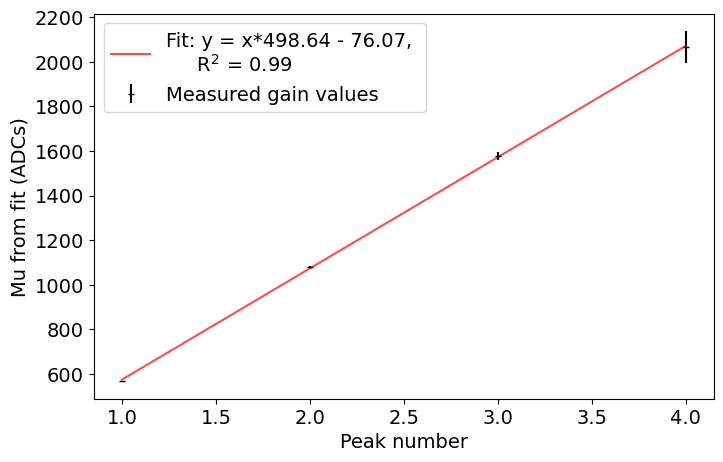

-------------------------------
Channel 2, date = 11_30_2023
-------------------------------


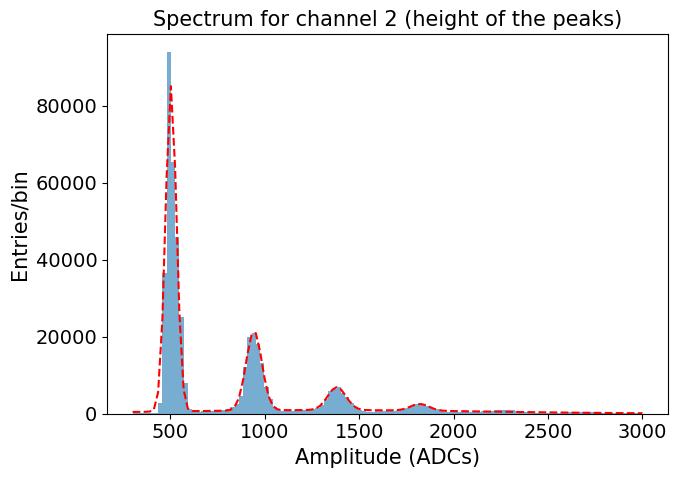

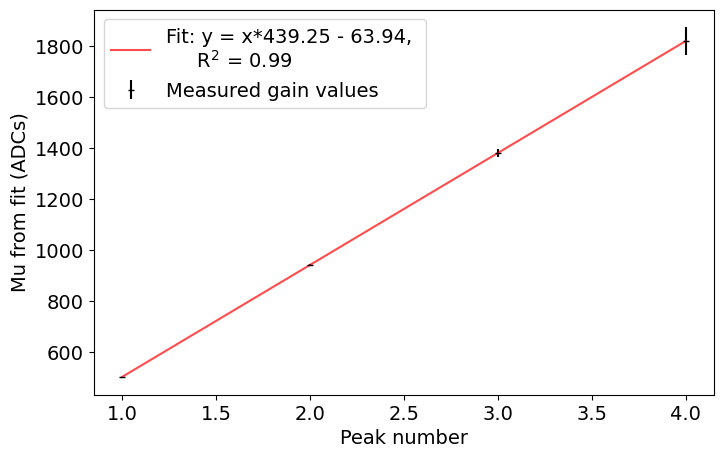

-------------------------------
Channel 0, date = 11_30_2023
-------------------------------


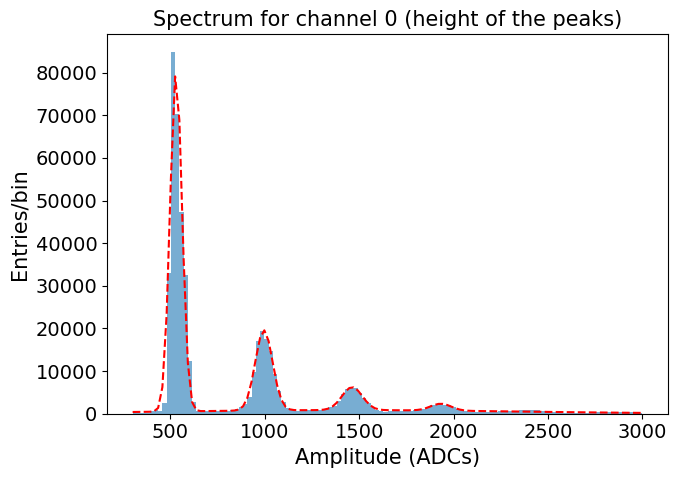

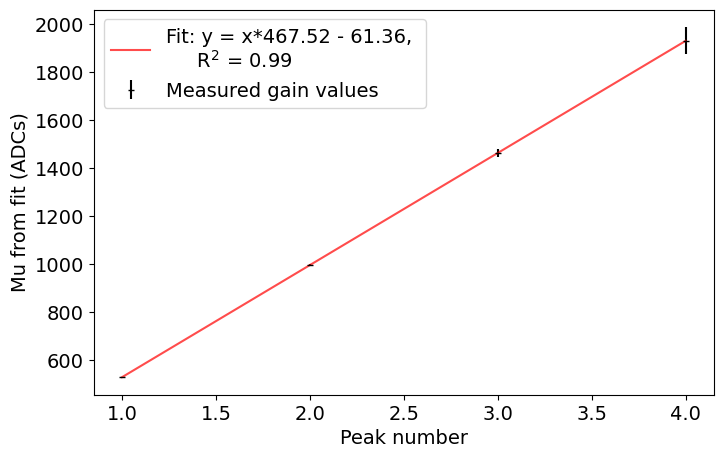

-------------------------------
Channel 1, date = 11_30_2023
-------------------------------


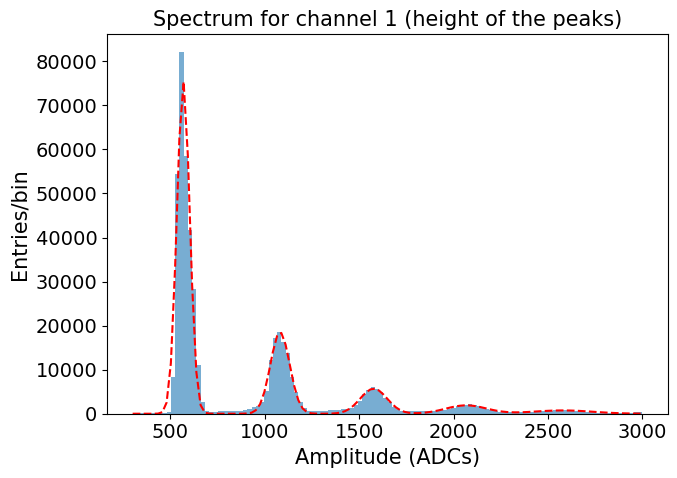

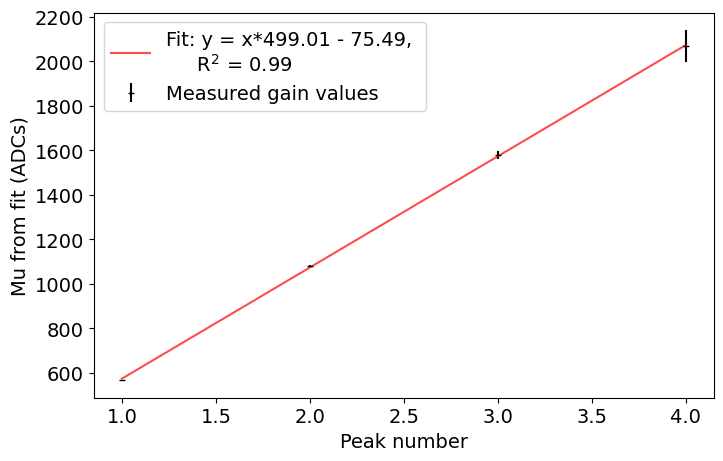

-------------------------------
Channel 2, date = 11_30_2023
-------------------------------


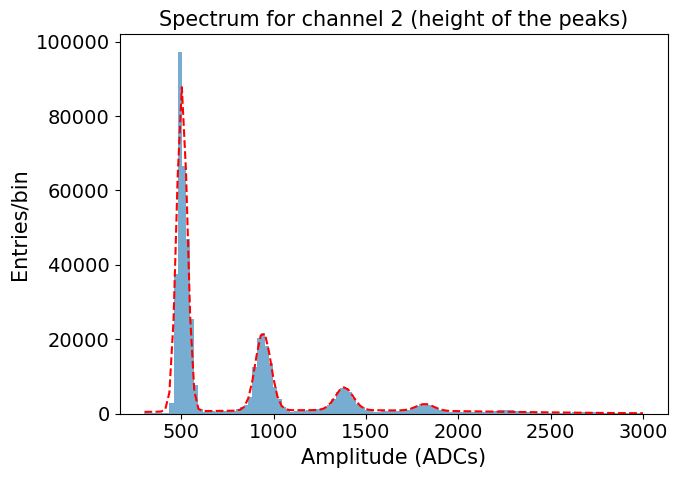

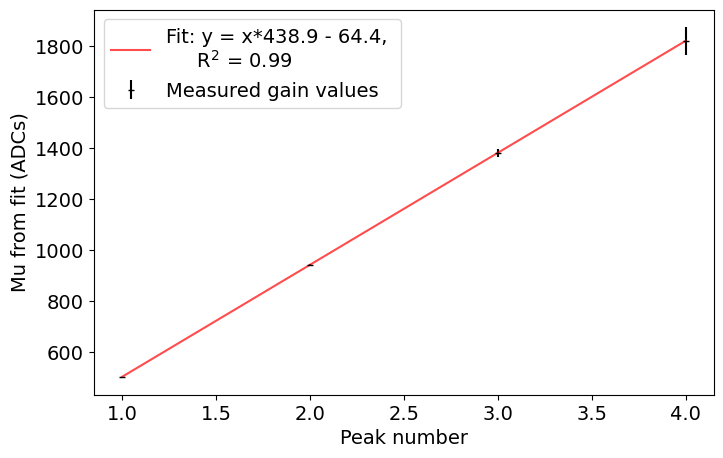

-------------------------------
Channel 0, date = 11_30_2023
-------------------------------


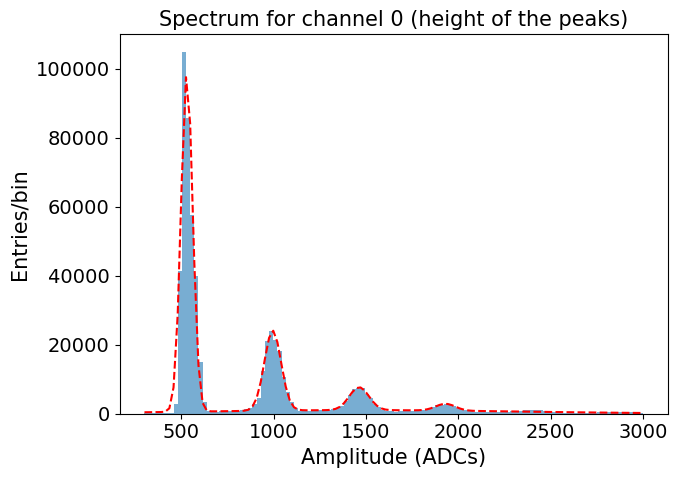

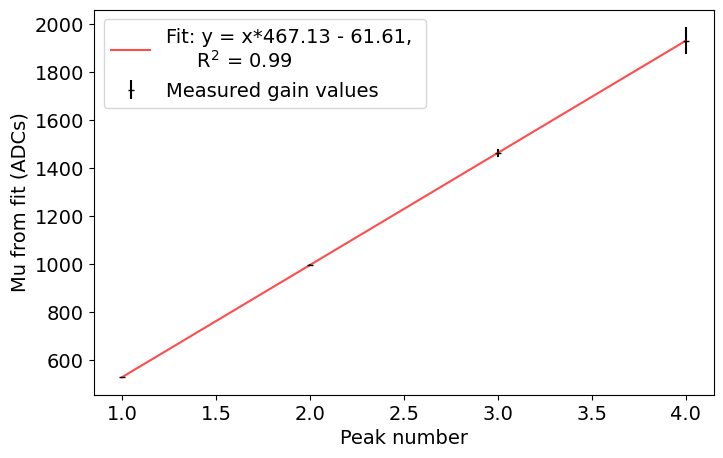

-------------------------------
Channel 1, date = 11_30_2023
-------------------------------


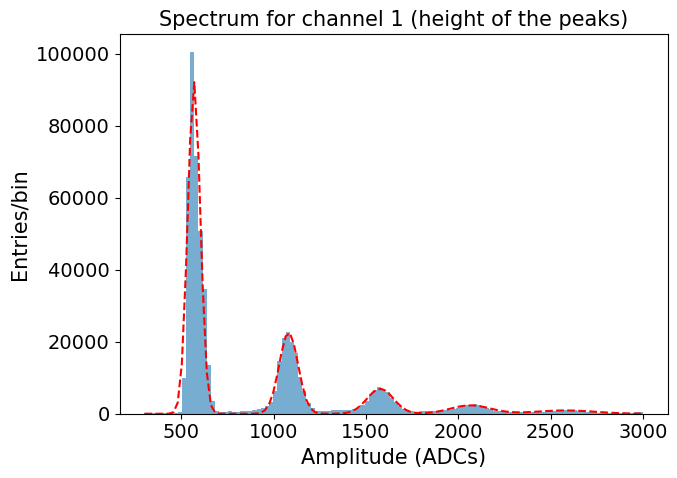

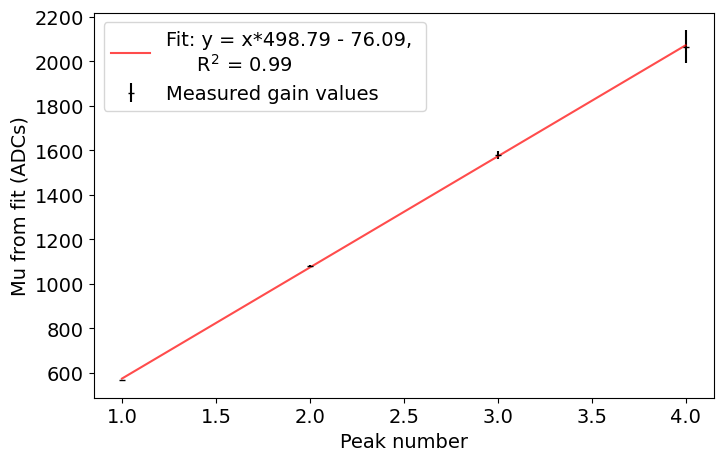

-------------------------------
Channel 2, date = 11_30_2023
-------------------------------


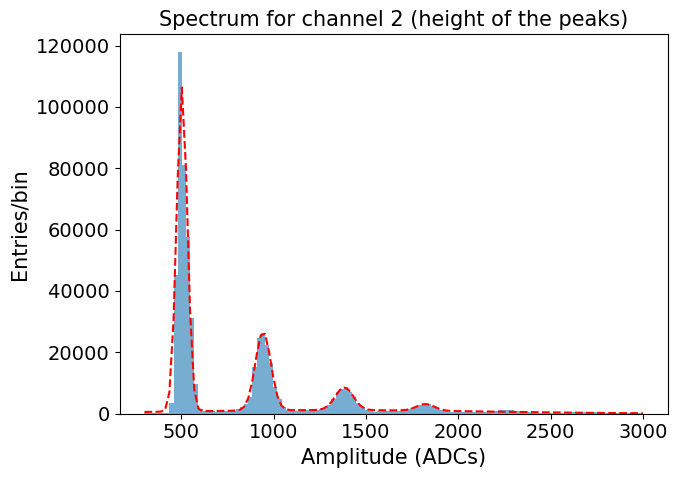

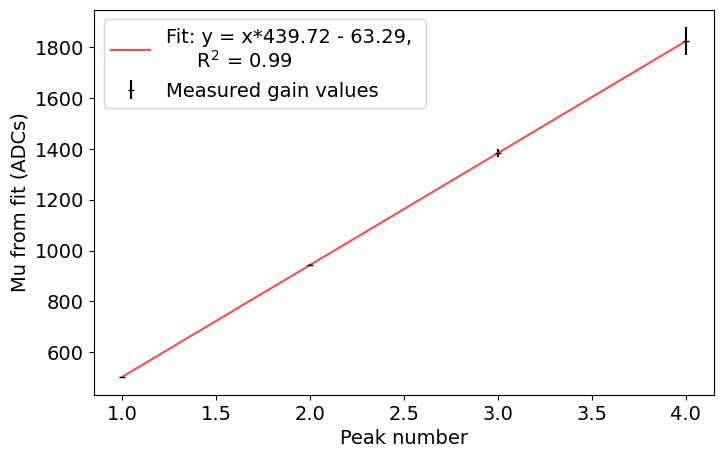

-------------------------------
Channel 0, date = 11_30_2023
-------------------------------


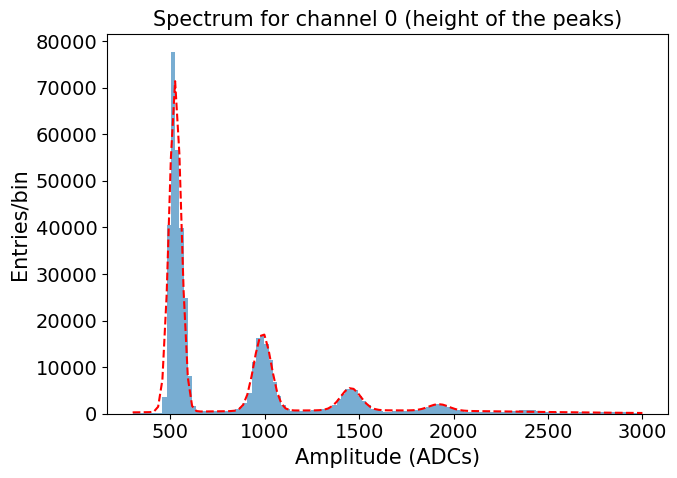

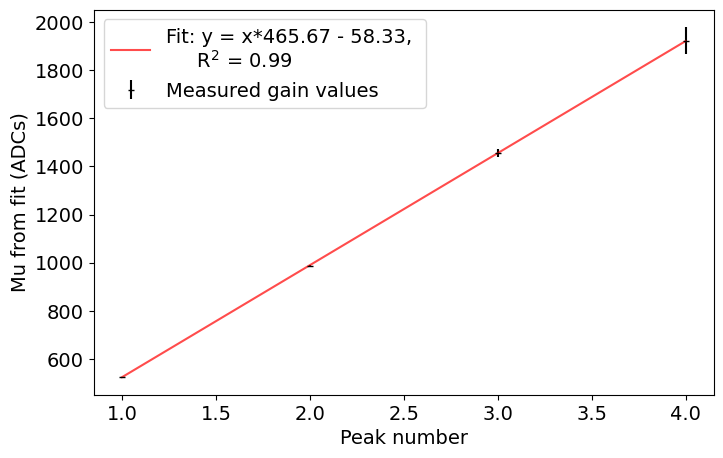

-------------------------------
Channel 1, date = 11_30_2023
-------------------------------


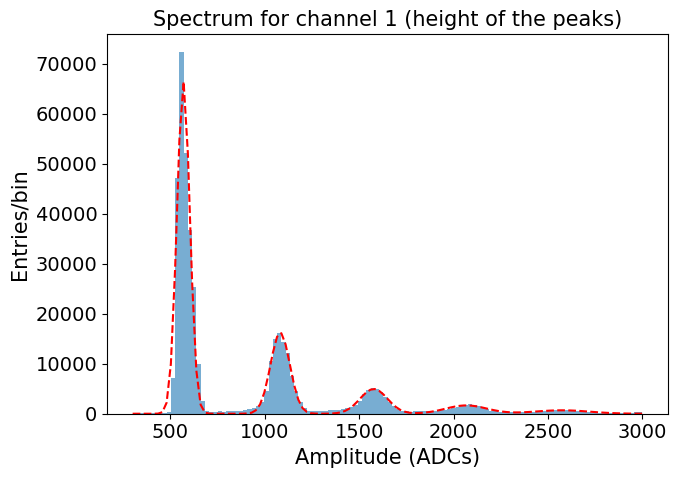

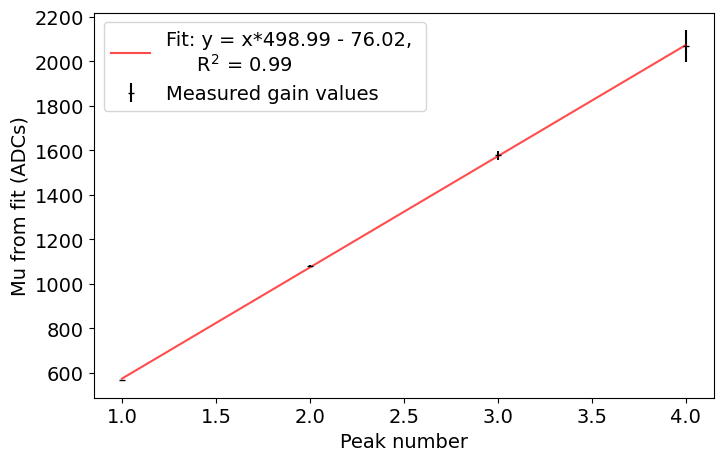

-------------------------------
Channel 2, date = 11_30_2023
-------------------------------


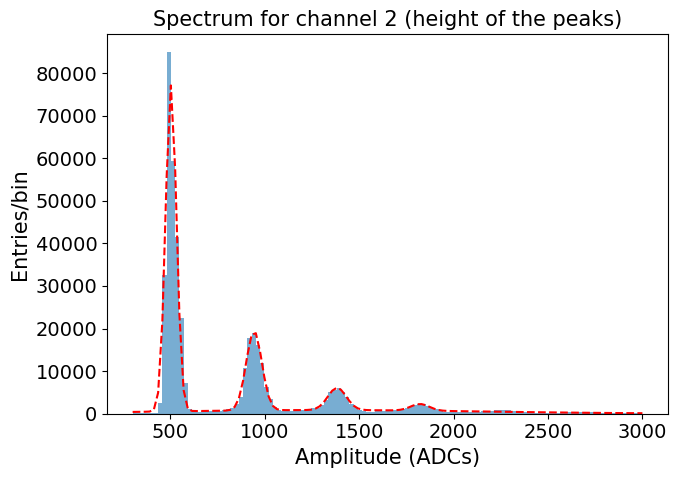

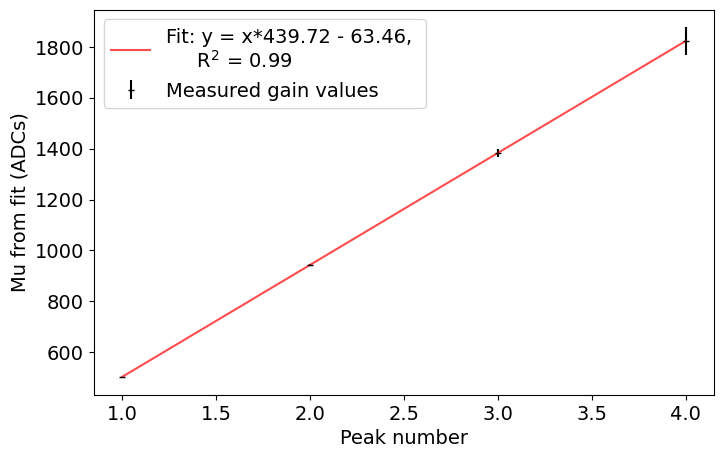

In [31]:
for sel_date in ['11_21_2023', '11_23_2023', '11_24_2023', '11_25_2023', '11_26_2023', '11_28_2023']:
    slope_ch                 = []
    for k in range(3):
        try:
            print('-------------------------------')
            print(f'Channel {k}, date = {date}')
            print('-------------------------------')
            slope = fit_spectrum_and_plot(peak_heights_trigger_SiPMs[sel_date][k], channel=k, initial_guess=initial_guess_trigger_ch_increase1[k+9], bins=120, rng=(300,3000), num_peaks_fit=4)
            slope_ch.append(slope)
        except RuntimeError:
            slope_ch.append(0)
            continue
            
    all_slopes_trigger_SiPMs[sel_date] = np.array(slope_ch)

In [32]:
all_slopes_trigger_SiPMs

{'11_20_2023': array([140.61663496, 145.08514581, 129.71665399]),
 '11_21_2023': array([466.04584782, 498.45870471, 439.30743123]),
 '11_23_2023': array([467.08449907, 498.61482779, 439.26991108]),
 '11_24_2023': array([467.24815558, 498.63543422, 439.25089937]),
 '11_25_2023': array([467.52292104, 499.00738029, 438.9000377 ]),
 '11_26_2023': array([467.1273681 , 498.79176862, 439.71648142]),
 '11_28_2023': array([465.66938516, 498.99072869, 439.71597387])}

### Dates: 11_29_2023, 11_30_2023

In [33]:
initial_guess_trigger_ch_increase2 = { 9: [42000, 545, 50, 4000, 1020, 60, 1100, 1505, 70, 400, 1980, 80],
                                      10: [40000, 580, 50, 4000, 1080, 60, 1400, 1580, 70, 500, 2080, 80],
                                      11: [45000, 480, 50, 5000,  880, 60, 2000, 1285, 70, 600, 1700, 80]}

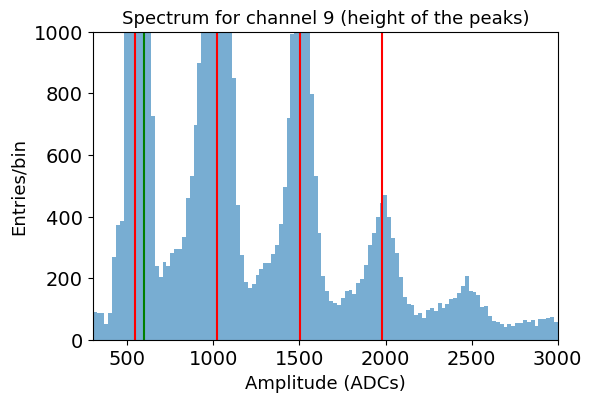

In [34]:
sel_channel = 9
sel_index   = sel_channel - 9
sel_date    = '11_29_2023'
plt.figure(figsize=(6, 4))
y, x, _ = plt.hist(peak_heights_trigger_SiPMs[sel_date][sel_index], bins=120, range=(300,3000), log=False, alpha=0.6)
plt.axvline(x=545, color='r')
plt.axvline(x=600, color='g')
plt.axvline(x=1020, color='r')
plt.axvline(x=1505, color='r')
plt.axvline(x=1980, color='r')
plt.xlabel('Amplitude (ADCs)',      fontsize=13)
plt.ylabel('Entries/bin',           fontsize=13)
plt.title(f"Spectrum for channel {sel_channel} (height of the peaks)", fontsize=13)
plt.xlim(300, 3000)
plt.ylim(0, 1000)
plt.show()

-------------------------------
Channel 0, date = 11_30_2023
-------------------------------


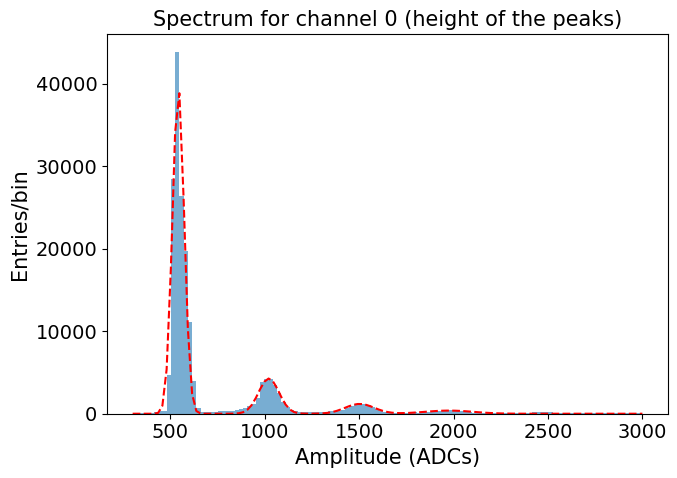

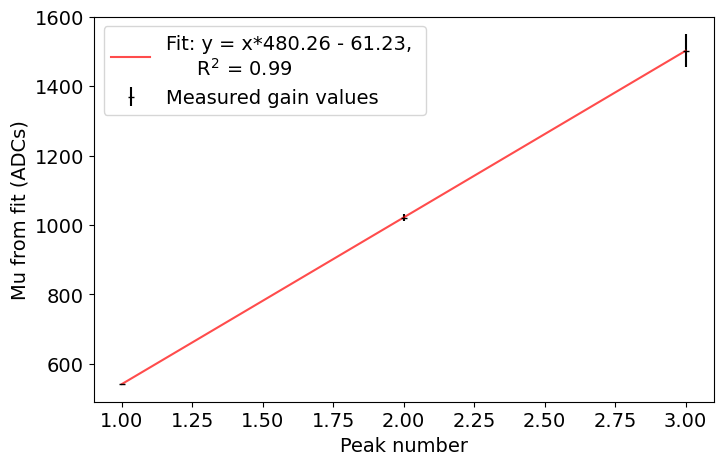

-------------------------------
Channel 1, date = 11_30_2023
-------------------------------


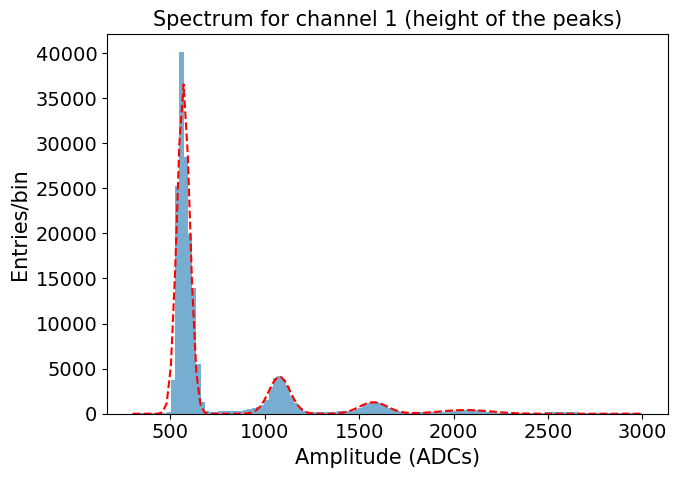

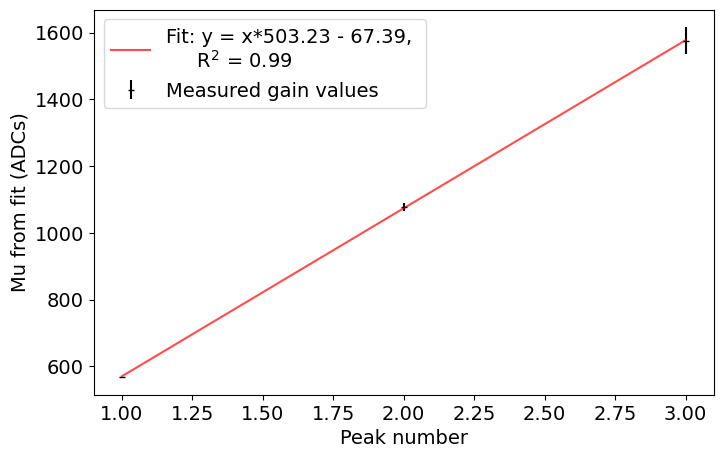

-------------------------------
Channel 2, date = 11_30_2023
-------------------------------


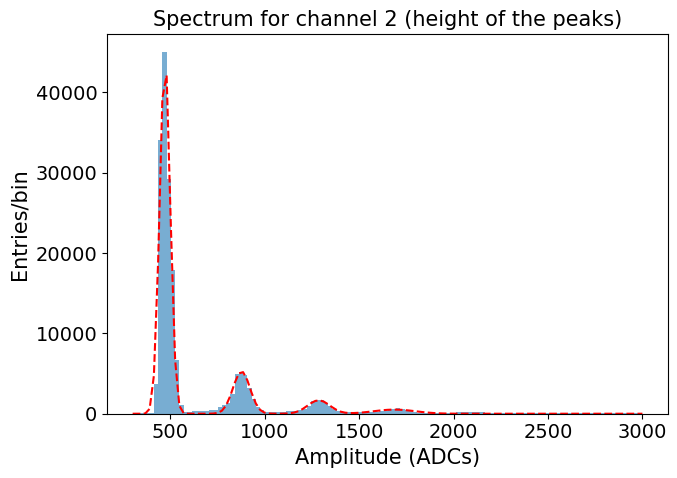

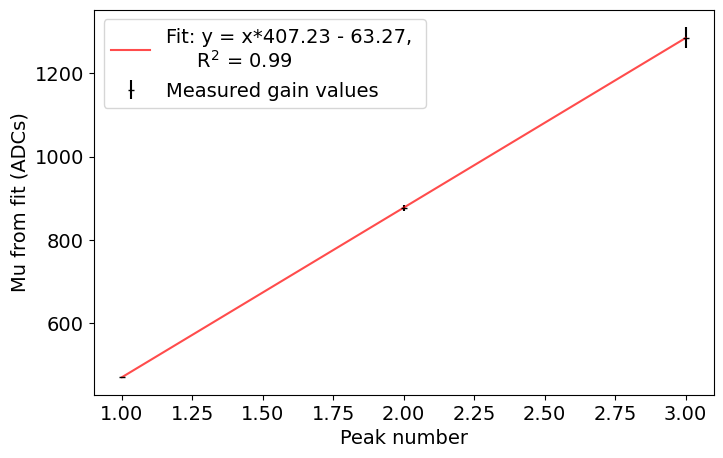

-------------------------------
Channel 0, date = 11_30_2023
-------------------------------


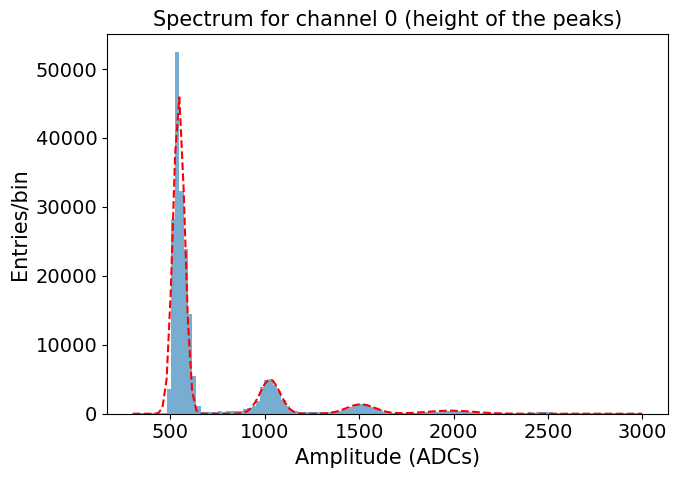

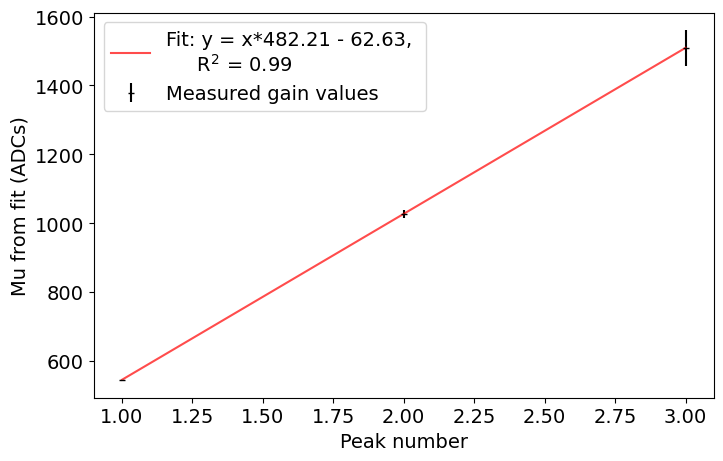

-------------------------------
Channel 1, date = 11_30_2023
-------------------------------


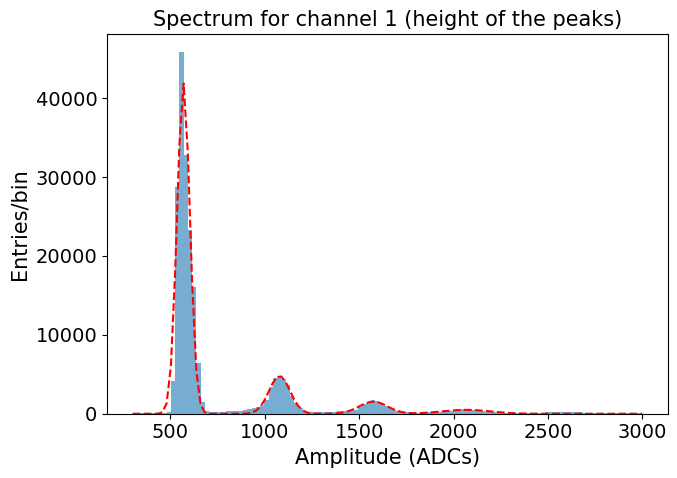

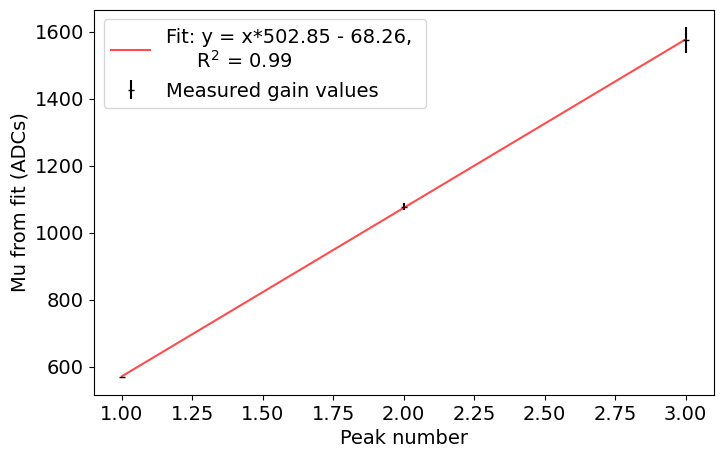

-------------------------------
Channel 2, date = 11_30_2023
-------------------------------


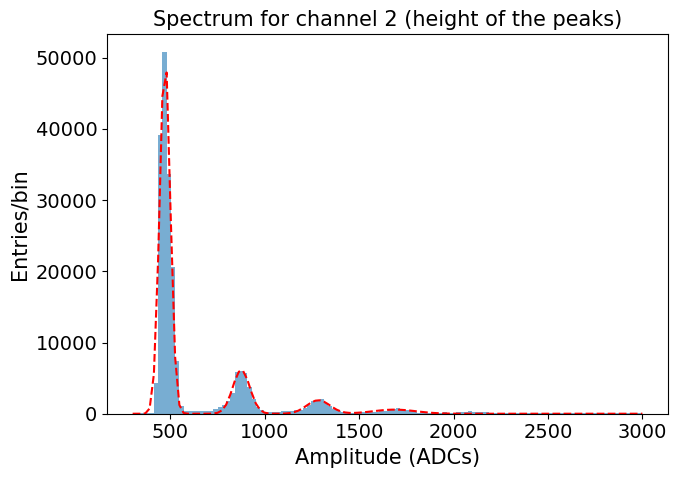

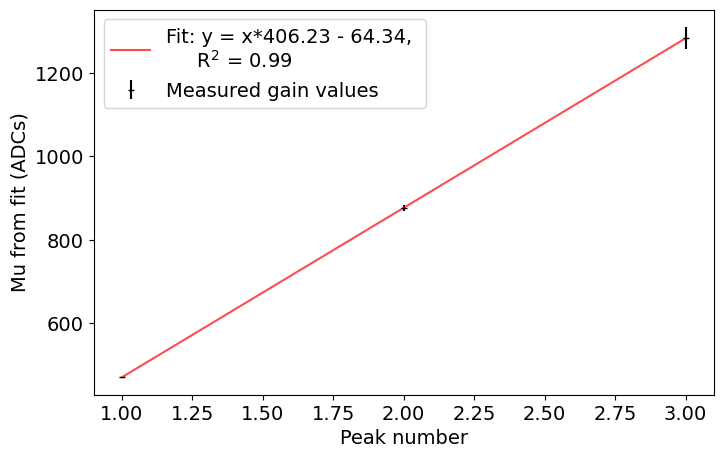

In [35]:
for sel_date in ['11_29_2023', '11_30_2023']:
    slope_ch                 = []
    for k in range(3):
        try:
            print('-------------------------------')
            print(f'Channel {k}, date = {date}')
            print('-------------------------------')
            slope = fit_spectrum_and_plot(peak_heights_trigger_SiPMs[sel_date][k], channel=k, initial_guess=initial_guess_trigger_ch_increase2[k+9], bins=120, rng=(300,3000), num_peaks_fit=3)
            slope_ch.append(slope)
        except RuntimeError:
            slope_ch.append(0)
            continue
            
    all_slopes_trigger_SiPMs[sel_date] = np.array(slope_ch)

In [36]:
all_slopes_trigger_SiPMs

{'11_20_2023': array([140.61663496, 145.08514581, 129.71665399]),
 '11_21_2023': array([466.04584782, 498.45870471, 439.30743123]),
 '11_23_2023': array([467.08449907, 498.61482779, 439.26991108]),
 '11_24_2023': array([467.24815558, 498.63543422, 439.25089937]),
 '11_25_2023': array([467.52292104, 499.00738029, 438.9000377 ]),
 '11_26_2023': array([467.1273681 , 498.79176862, 439.71648142]),
 '11_28_2023': array([465.66938516, 498.99072869, 439.71597387]),
 '11_29_2023': array([480.26445013, 503.22746987, 407.22884827]),
 '11_30_2023': array([482.20582223, 502.84978628, 406.22867413])}

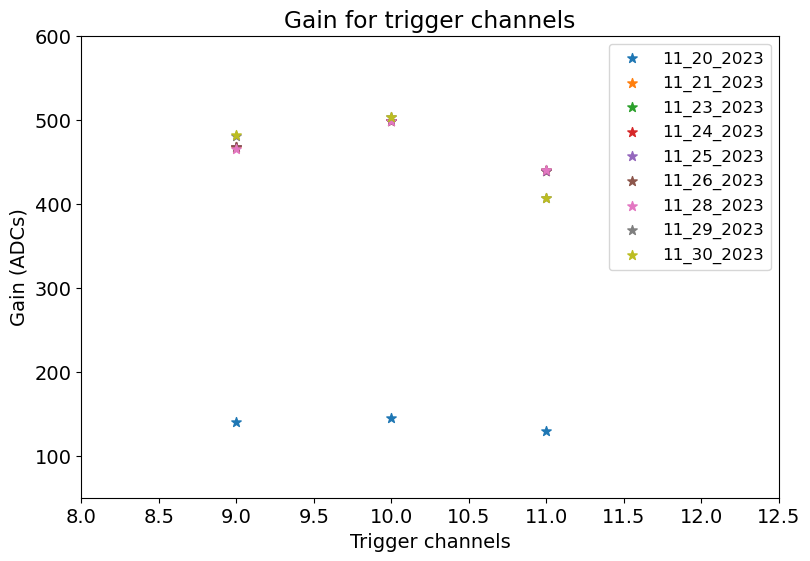

In [37]:
for sel_date in all_slopes_trigger_SiPMs.keys():
    plt.scatter(trigger_SiPMs, all_slopes_trigger_SiPMs[sel_date], marker='*', s=50, label=f'{sel_date}')
plt.ylim(50, 600)
plt.xlim(8, 12.5)
plt.title('Gain for trigger channels')
plt.xlabel('Trigger channels')
plt.ylabel('Gain (ADCs)')
plt.legend(fontsize=12)
plt.show()

## All channels and all cases

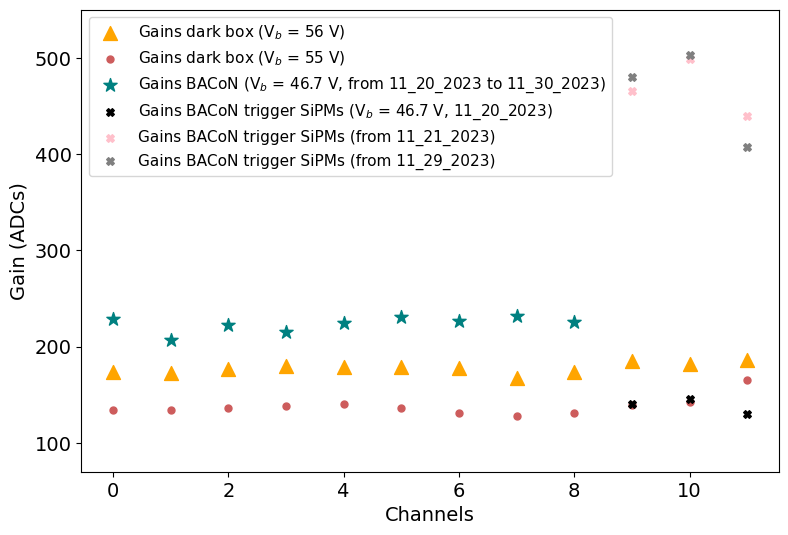

In [44]:
plt.scatter(range(12),     gains_dark_box_vb56,                    marker='^', s=100, label='Gains dark box (V$_b$ = 56 V)', color='orange')
plt.scatter(range(12),     gains_dark_box_vb55,                    marker='.', s=100, label='Gains dark box (V$_b$ = 55 V)', color='indianred')
plt.scatter(range(9),      gains_BACoN,                            marker='*', s=100, label='Gains BACoN (V$_b$ = 46.7 V, from 11_20_2023 to 11_30_2023)' , color='teal')
plt.scatter(trigger_SiPMs, all_slopes_trigger_SiPMs['11_20_2023'], marker='X', s=30,  label='Gains BACoN trigger SiPMs (V$_b$ = 46.7 V, 11_20_2023)'  , color='k')
plt.scatter(trigger_SiPMs, all_slopes_trigger_SiPMs['11_21_2023'], marker='X', s=30,  label='Gains BACoN trigger SiPMs (from 11_21_2023)' , color='pink')
plt.scatter(trigger_SiPMs, all_slopes_trigger_SiPMs['11_29_2023'], marker='X', s=30,  label='Gains BACoN trigger SiPMs (from 11_29_2023)' , color='grey')
plt.ylim(70, 550)
plt.xlabel('Channels')
plt.ylabel('Gain (ADCs)')
plt.legend(fontsize=11)
plt.show()

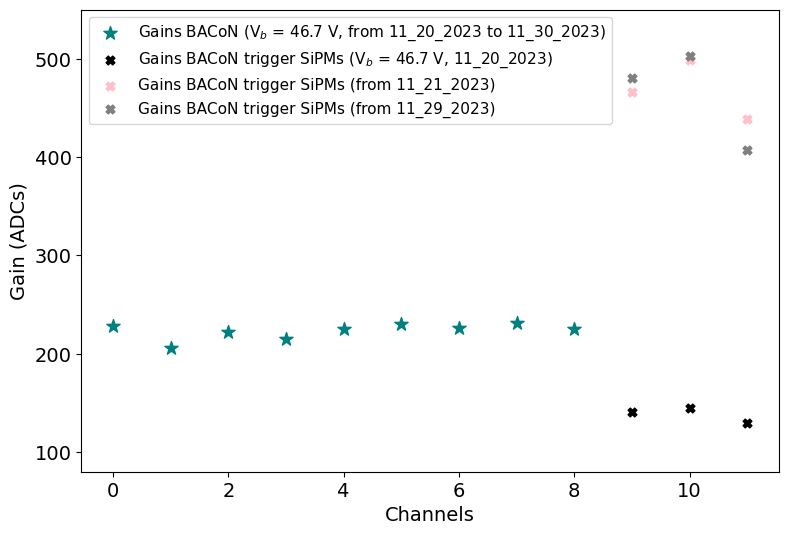

In [47]:
plt.scatter(range(9),      gains_BACoN,                            marker='*', s=100, label='Gains BACoN (V$_b$ = 46.7 V, from 11_20_2023 to 11_30_2023)' , color='teal')
plt.scatter(trigger_SiPMs, all_slopes_trigger_SiPMs['11_20_2023'], marker='X', s=40,  label='Gains BACoN trigger SiPMs (V$_b$ = 46.7 V, 11_20_2023)'  , color='k')
plt.scatter(trigger_SiPMs, all_slopes_trigger_SiPMs['11_21_2023'], marker='X', s=40,  label='Gains BACoN trigger SiPMs (from 11_21_2023)' , color='pink')
plt.scatter(trigger_SiPMs, all_slopes_trigger_SiPMs['11_29_2023'], marker='X', s=40,  label='Gains BACoN trigger SiPMs (from 11_29_2023)' , color='grey')
plt.ylim(80, 550)
plt.xlabel('Channels')
plt.ylabel('Gain (ADCs)')
plt.legend(fontsize=11)
plt.show()

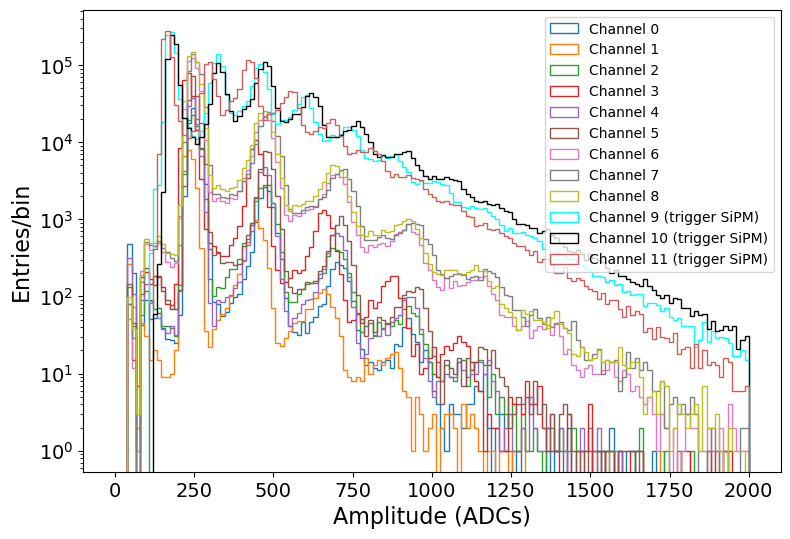

In [57]:
sel_date = '11_20_2023'
for k in range(9):
    plt.hist(peak_heights              [sel_date][k], bins=150, range=(0,2000), log=True, label=f'Channel {k}', histtype='step')
for k, (_, col) in enumerate(zip(trigger_SiPMs, ['cyan', 'k', 'indianred'])):
    plt.hist(peak_heights_trigger_SiPMs[sel_date][k], bins=150, range=(0,2000), log=True, label=f'Channel {k+9} (trigger SiPM)', histtype='step', color=col)
plt.xlabel('Amplitude (ADCs)', fontsize=16)
plt.ylabel('Entries/bin',      fontsize=16)
plt.legend(fontsize=10)
plt.show()

In [ ]:
module LArDSP

using RadiationDetectorDSP, Unitful, RadiationDetectorSignals
using LegendHDF5IO
using HDF5
using TypedTables
using IntervalSets, ArraysOfArrays

export process_lar

    function process_lar(in_path,channel)

        # # the data should come from a legend hdf5 raw file
        data = LHDataStore(in_path, "r")[channel][:]

        bl_mean_min, bl_mean_max = 0u"µs", 8u"µs"

        # get waveform data 
        wvfs = data.waveform
        blfc = data.baseline
        ts   = data.timestamp
        evID = data.eventnumber
        efc  = data.daqenergy

        # get baseline mean, std and slope
        bl_stats = signalstats.(wvfs, bl_mean_min, bl_mean_max)

        # substract baseline from waveforms
        wvfs = shift_waveform.(wvfs, -bl_stats.mean)

        # get baseline subtracted maximum
        max_wf = maximum.(wvfs.signal)
        argmax_wf = argmax.(wvfs.signal)

        # savitzky golay filter
        sg_filter = SavitzkyGolayFilter(100u"ns", 0, 0)
        sg_filtered_waveforms = sg_filter.(wvfs);

        # diff
        diff_wf = diff.(sg_filtered_waveforms.signal)

        # points above threshold
        points_above_threshold = PointsAboveThreshold()
        hit_time = [points_above_threshold(diff_wf[i], 5).hit_time for i in 1:length(diff_wf)]
        hit_sample = [points_above_threshold(diff_wf[i], 5).hit_sample for i in 1:length(diff_wf)]
        nhits = [points_above_threshold(diff_wf[i], 5).nhits for i in 1:length(diff_wf)]
        hit_time_1 = [points_above_threshold(diff_wf[i], 5).hit_time_1 for i in 1:length(diff_wf)]
        hit_sample_1 = [points_above_threshold(diff_wf[i], 5).hit_sample_1 for i in 1:length(diff_wf)]
        hit_time_2 = [points_above_threshold(diff_wf[i], 5).hit_time_2 for i in 1:length(diff_wf)]
        hit_sample_2 = [points_above_threshold(diff_wf[i], 5).hit_sample_2 for i in 1:length(diff_wf)]
        hit_time_3 = [points_above_threshold(diff_wf[i], 5).hit_time_3 for i in 1:length(diff_wf)]
        hit_sample_3 = [points_above_threshold(diff_wf[i], 5).hit_sample_3 for i in 1:length(diff_wf)]
        hit_time_4 = [points_above_threshold(diff_wf[i], 5).hit_time_4 for i in 1:length(diff_wf)]
        hit_sample_4 = [points_above_threshold(diff_wf[i], 5).hit_sample_4 for i in 1:length(diff_wf)]
        hit_time_5 = [points_above_threshold(diff_wf[i], 5).hit_time_5 for i in 1:length(diff_wf)]
        hit_sample_5 = [points_above_threshold(diff_wf[i], 5).hit_sample_5 for i in 1:length(diff_wf)]
        hit_time_6 = [points_above_threshold(diff_wf[i], 5).hit_time_6 for i in 1:length(diff_wf)]
        hit_sample_6 = [points_above_threshold(diff_wf[i], 5).hit_sample_6 for i in 1:length(diff_wf)]
        hit_time_7 = [points_above_threshold(diff_wf[i], 5).hit_time_7 for i in 1:length(diff_wf)]
        hit_sample_7 = [points_above_threshold(diff_wf[i], 5).hit_sample_7 for i in 1:length(diff_wf)]
        hit_time_8 = [points_above_threshold(diff_wf[i], 5).hit_time_8 for i in 1:length(diff_wf)]
        hit_sample_8 = [points_above_threshold(diff_wf[i], 5).hit_sample_8 for i in 1:length(diff_wf)]
        hit_time_9 = [points_above_threshold(diff_wf[i], 5).hit_time_9 for i in 1:length(diff_wf)]
        hit_sample_9 = [points_above_threshold(diff_wf[i], 5).hit_sample_9 for i in 1:length(diff_wf)]
        hit_time_10 = [points_above_threshold(diff_wf[i], 5).hit_time_10 for i in 1:length(diff_wf)]
        hit_sample_10 = [points_above_threshold(diff_wf[i], 5).hit_sample_10 for i in 1:length(diff_wf)]
    

        output = TypedTables.Table(blmean = bl_stats.mean, blsigma = bl_stats.sigma, blslope = bl_stats.slope, bloffset = bl_stats.offset,
                                    timestamp = ts,
                                    nhits = nhits,
                                    hit_time_1 = hit_time_1, hit_sample_1 = hit_sample_1,
                                    hit_time_2 = hit_time_2, hit_sample_2 = hit_sample_2,
                                    hit_time_3 = hit_time_3, hit_sample_3 = hit_sample_3,
                                    hit_time_4 = hit_time_4, hit_sample_4 = hit_sample_4,
                                    hit_time_5 = hit_time_5, hit_sample_5 = hit_sample_5,
                                    hit_time_6 = hit_time_6, hit_sample_6 = hit_sample_6,
                                    hit_time_7 = hit_time_7, hit_sample_7 = hit_sample_7,
                                    hit_time_8 = hit_time_8, hit_sample_8 = hit_sample_8,
                                    hit_time_9 = hit_time_9, hit_sample_9 = hit_sample_9,
                                    hit_time_10 = hit_time_10, hit_sample_10 = hit_sample_10,

                                    )       
        return output
        

    end

end

In [ ]:
points_above_threshold = PointsAboveThreshold()
hit_time = [points_above_threshold(diff_wf[i], 5).hit_time for i in 1:length(diff_wf)]
hit_sample = [points_above_threshold(diff_wf[i], 5).hit_sample for i in 1:length(diff_wf)]
nhits = [points_above_threshold(diff_wf[i], 5).nhits for i in 1:length(diff_wf)]
hit_time_1 = [points_above_threshold(diff_wf[i], 5).hit_time_1 for i in 1:length(diff_wf)]
hit_sample_1 = [points_above_threshold(diff_wf[i], 5).hit_sample_1 for i in 1:length(diff_wf)]
